# EDA

## Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

## Function Definitions

In [2]:
def create_full_WIKIDATA_dataframe(all_triples_file, entity2id_file, entity2name_file, relation2id_file, relation2name_file):
    df_main = pd.read_csv(all_triples_file, sep="\t", header=None, names=["object_id", "relation_id", "subject_id", "start_date", "end_date"])
    df_entity_num = pd.read_csv(entity2id_file, sep="\t", header=None, names=["entity_id", "entity_num_id"])
    df_entity_name = pd.read_csv(entity2name_file, sep="\t", header=None, names=["entity_id", "entity_name"])
    df_relation_num = pd.read_csv(relation2id_file, sep="\t", header=None, names=["relation_id", "relation_num_id"])
    df_relation_name = pd.read_csv(relation2name_file, sep="\t", header=None, names=["relation_id", "relation_name"])
    df_name_num_relation = df_relation_name.merge(df_relation_num, on="relation_id")
    df_entity_name_id = df_entity_num.merge(df_entity_name, on="entity_id")
    df_main["object_id"] = df_main["object_id"].astype(str)
    df_main["relation_id"] = df_main["relation_id"].astype(str)
    df_main["subject_id"] = df_main["subject_id"].astype(str)
    df_entity_name_id["entity_num_id"] = df_entity_name_id["entity_num_id"].astype(str)

    df_main_entity = df_main.merge(df_entity_name_id, left_on="object_id", right_on="entity_num_id")
    df_main_entity_2 = df_main_entity.merge(df_entity_name_id, left_on="subject_id", right_on="entity_num_id")
    df_name_num_relation["relation_num_id"] = df_name_num_relation["relation_num_id"].astype(str)
    df_main_entity_final = df_main_entity_2.merge(df_name_num_relation, left_on="relation_id", right_on="relation_num_id")
    df_main_entity_final.rename(columns={
        "relation_id_x": "object_relation_id", 
        "entity_id_x": "object_entity_id",
        "entity_num_id_x": "object_num_id",
        "entity_name_x": "object_name",
        
        "relation_id_y": "subject_relation_id",
        "entity_id_y": "subject_entity_id",
        "entity_num_id_y": "subject_num_id",
        "entity_name_y": "subject_name"
    }, inplace=True)

    return df_main_entity_final

In [3]:
def create_full_YAGO11k_dataframe(all_triples_file, entity2id_file, entity2name_file, relation2id_file, relation2name_file):
    df_main = pd.read_csv(all_triples_file, sep="\t", header=None, names=["object_id", "relation_id", "subject_id", "start_date", "end_date"])
    df_entity_num = pd.read_csv(entity2id_file, sep="\t", header=None, names=["entity_id", "entity_num_id", "start_date", "end_date"])
    df_entity_name = pd.read_csv(entity2name_file, sep="\t", header=None, names=["entity_id", "entity_name"])
    df_relation_num = pd.read_csv(relation2id_file, sep="\t", header=None, names=["relation_id", "relation_num_id"])
    df_relation_name = pd.read_csv(relation2name_file, sep="\t", header=None, names=["relation_id", "relation_name", "placeholder"])
    df_relation_name = df_relation_name.drop(columns = ["placeholder"])
    df_name_num_relation = df_relation_name.merge(df_relation_num, on="relation_id")
    df_entity_name_id = df_entity_num.merge(df_entity_name, on="entity_id")
    df_main["object_id"] = df_main["object_id"].astype(str)
    df_main["relation_id"] = df_main["relation_id"].astype(str)
    df_main["subject_id"] = df_main["subject_id"].astype(str)
    df_entity_name_id["entity_num_id"] = df_entity_name_id["entity_num_id"].astype(str)

    df_main_entity = df_main.merge(df_entity_name_id, left_on="object_id", right_on="entity_num_id")
    df_main_entity_2 = df_main_entity.merge(df_entity_name_id, left_on="subject_id", right_on="entity_num_id")
    df_name_num_relation["relation_num_id"] = df_name_num_relation["relation_num_id"].astype(str)
    df_main_entity_final = df_main_entity_2.merge(df_name_num_relation, left_on="relation_id", right_on="relation_num_id")
    df_main_entity_final.rename(columns={
        "relation_id_x": "object_relation_id", 
        "entity_id_x": "object_entity_id",
        "entity_num_id_x": "object_num_id",
        "entity_name_x": "object_name",
        "start_date_x": "relation_start_date",
        "end_date_x" : "relation_end_date",
        "start_date_y" : "object_start_date",
        "end_date_y" : "object_end_date",
        "start_date" : "subject_start_date",
        "end_date" : "subject_end_date",
        "relation_id_y": "subject_relation_id",
        "entity_id_y": "subject_entity_id",
        "entity_num_id_y": "subject_num_id",
        "entity_name_y": "subject_name"
    }, inplace=True)

    return df_main_entity_final

In [4]:
def plot_value_counts(df, column, title="Frequency Distribution", x_label="Values", y_label="Frequency"):
    """
    Plots the frequency distribution of unique values in a specified column of a DataFrame.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data.
    - column (str): The name of the column to analyze.
    - title (str): Title of the plot (default is "Frequency Distribution").
    - x_label (str): Label for the x-axis (default is "Values").
    - y_label (str): Label for the y-axis (default is "Frequency").

    Returns:
    - None: Shows the plot.
    """
    # Check if the column exists in the dataframe
    if column not in df.columns:
        print(f"Column '{column}' not found in the DataFrame.")
        return

    # Calculate the frequency of each unique value
    value_counts = df[column].value_counts()
    print(f"greatest number of occurences: {max(value_counts)}")
    print(f"smallest number of occurences: {min(value_counts)}")

    # Plot the frequency distribution
    plt.figure(figsize=(10, 6))
    value_counts.plot(kind='bar', color='skyblue')
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.xticks([])
    plt.tight_layout()
    plt.show()

In [5]:
def analyze_columns(analysis_name, df, columns):
    """
    Analyzes the specified columns of a DataFrame and prints the number of unique values,
    the most common value, and the least common value along with their counts.

    Parameters:
    - df (pd.DataFrame): The DataFrame to analyze.
    - columns (list): A list of column names to analyze.

    Returns:
    - None: Prints the analysis results.
    """
    print(f"Analysis Name: {analysis_name}")
    for column in columns:
        if column not in df.columns:
            print(f"Column '{column}' not found in the DataFrame.")
            continue

        unique_values = df[column].nunique()
        value_counts = df[column].value_counts()

        most_common_value = value_counts.idxmax()
        most_common_count = value_counts.max()

        least_common_value = value_counts.idxmin()
        least_common_count = value_counts.min()

        print(f"Analysis for column '{column}':")
        print(f"  - Number of unique values: {unique_values}")
        print(f"  - Most common value: '{most_common_value}' with {most_common_count} occurrences")
        print(f"  - Least common value: '{least_common_value}' with {least_common_count} occurrence(s)\n")

In [6]:
def visualize_relationships(df, object_col, relation_col, subject_col):
    """
    Visualizes relationships between objects and subjects using a graph.

    Parameters:
    - df (pd.DataFrame): DataFrame containing the data.
    - object_col (str): The column name to be treated as objects.
    - relation_col (str): The column name to be treated as relations.
    - subject_col (str): The column name to be treated as subjects.

    Returns:
    - None: Displays the graph.
    """
    G = nx.DiGraph()
    object_counts = df[object_col].value_counts().to_dict()
    subject_counts = df[subject_col].value_counts().to_dict()

    for _, row in df.iterrows():
        obj = row[object_col]
        rel = row[relation_col]
        subj = row[subject_col]

        G.add_node(obj, count=object_counts.get(obj, 0))
        G.add_node(subj, count=subject_counts.get(subj, 0))
        G.add_edge(obj, subj, label=rel)

    # Set node colors based on the counts
    node_colors = [G.nodes[node]['count'] for node in G.nodes()]

    if len(set(node_colors)) == 1:
        # Set a default color if all counts are the same
        default_color = '#ff9999'  # Light red
        node_colors = [default_color] * len(node_colors)
    else:
        cmap = plt.cm.Reds  # Change to red gradient
        norm = plt.Normalize(vmin=min(node_colors), vmax=max(node_colors))
        node_colors = [cmap(norm(count)) for count in node_colors]

    plt.figure(figsize=(16, 12))
    pos = nx.spring_layout(G, k=1.5)
    nx.draw(G, pos, node_size=700, node_color=node_colors, with_labels=True, font_size=10, edge_color='gray')

    edge_labels = {(u, v): d['label'] for u, v, d in G.edges(data=True)}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

    try:
        sm = plt.cm.ScalarMappable(cmap=plt.cm.Reds, norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=plt.gca())
        cbar.set_label('Occurrences')
    except:
        pass

    plt.title("Object-Subject Relationships")
    plt.show()

def extract_top_n_common(df, column, n=50):
    """
    Extract rows with the top n most commonly occurring items in the specified column.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - column (str): The column name from which to extract the top n common items.
    - n (int): The number of top common items to extract (default is 50).

    Returns:
    - pd.DataFrame: A new DataFrame containing only the rows with the top n common items.
    """
    top_n_values = df[column].value_counts().nlargest(n).index.tolist()
    filtered_df = df[df[column].isin(top_n_values)]
    
    return filtered_df

In [7]:
def plot_conditional_distribution(df, object_col, object_value, conditional_col, dataset_name):
    """
    Plots the conditional distribution of values in a specified column based on the occurrence
    of a specific object value in another column.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - object_col (str): The column name where the object value is specified.
    - object_value (str): The specific object value to analyze.
    - conditional_col (str): The column name for the conditional distribution (relation or subject).

    Returns:
    - None: Displays the distribution plot.
    """
    filtered_df = df[df[object_col] == object_value]
    counts = filtered_df[conditional_col].value_counts()
    
    plt.figure(figsize=(10, 6))
    sns.barplot(x=counts.index, y=counts.values, palette='viridis', hue=1.0)
    
    plt.title(f'{dataset_name} Conditional Distribution of {conditional_col} for {object_value}')
    plt.xlabel(conditional_col)
    plt.ylabel('Frequency')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

def find_duplicates(df, column, min_occurences=1):
    """
    Returns the values that appear more than once in a specified column along with their counts.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - column (str): The column name to check for duplicate values.

    Returns:
    - pd.DataFrame: A DataFrame containing the duplicated values and their counts.
    """

    value_counts = df[column].value_counts()
    duplicates = value_counts[value_counts > min_occurences].index.to_list()
    return duplicates

In [8]:
def plot_year_distributions(df, date_column1, date_column2, title="Year distribution", bins=30):
    # Extract the years from both date columns without modifying the original DataFrame
    years1 = df[date_column1].str.split('-').str[0]
    years2 = df[date_column2].str.split('-').str[0]
    
    # Convert the extracted years to numeric
    years1 = pd.to_numeric(years1, errors='coerce').dropna()
    years2 = pd.to_numeric(years2, errors='coerce').dropna()
    
    # Combine both year series for the first plot
    combined_years = pd.concat([years1, years2])
    combined_years.astype(int).to_list()
    
    # Create the first histogram for combined years
    plt.figure(figsize=(12, 6))
    plt.hist(combined_years, bins=bins, alpha=0.7, color='blue')
    plt.title(title)
    plt.xlabel('Year')
    plt.ylabel('Frequency')
    #plt.xticks(range(int(combined_years.min()), int(combined_years.max()) + 1))
    plt.grid(axis='y')
    plt.show()

    # Create the second histogram for individual year distributions
    plt.figure(figsize=(12, 6))
    plt.hist(years1, bins=bins, alpha=0.5, color='blue', label=date_column1)
    plt.hist(years2, bins=bins, alpha=0.5, color='orange', label=date_column2)
    
    plt.title(title)
    plt.xlabel('Year')
    plt.ylabel('Frequency')
    #plt.xticks(range(int(min(years1.min(), years2.min())), 
    #                 int(max(years1.max(), years2.max())) + 1))
    plt.legend()
    plt.grid(axis='y')
    plt.show()

In [9]:
def plot_year_distribution(df, date_column, title="Year distribution"):
    years = df[date_column].str.split('-').str[0]
    years = pd.to_numeric(years, errors='coerce')
    years = years.dropna().astype(int)
    years = years.to_list()
    plt.figure(figsize=(10, 6))
    plt.hist(years, bins=range(int(min(years)), int(max(years))), alpha=0.7, color='blue', edgecolor='black')
    plt.title(title)
    plt.xlabel('Year')
    plt.ylabel('Frequency')
    plt.grid(axis='y')
    plt.show()

In [10]:
def plot_year_distribution_bins(df, date_column, title="Year distribution", bins=20):
    years = df[date_column].str.split('-').str[0]
    years = pd.to_numeric(years, errors='coerce').dropna().astype(int)
    years = years.to_list()
    
    plt.figure(figsize=(10, 6))
    plt.hist(years, bins=bins, alpha=0.7, color='blue', edgecolor='black')
    plt.title(title)
    plt.xlabel('Year')
    plt.ylabel('Frequency')
    #plt.xticks(range(int(min(years)), int(max(years)) + 1))
    plt.grid(axis='y')
    plt.show()

## Data Reading

In [11]:
all_triples_file = "data/inductive/all-triples/WIKIDATA12k/all-triples.txt"
entity2id_file = "data/inductive/all-triples/WIKIDATA12k/entity2id.txt"
entity2name_file = "data/inductive/all-triples/WIKIDATA12k/entity2name.txt"
relation2id_file = "data/inductive/all-triples/WIKIDATA12k/relation2id.txt"
relation2name_file = "data/inductive/all-triples/WIKIDATA12k/relation2name.txt"

indictive_wiki = create_full_WIKIDATA_dataframe(all_triples_file, entity2id_file, entity2name_file, relation2id_file, relation2name_file)
indictive_wiki

,object_id,object_relation_id,subject_id,start_date,end_date,object_entity_id,object_num_id,object_name,subject_entity_id,subject_num_id,subject_name,subject_relation_id,relation_name,relation_num_id
0,3962,14,3927,1926-##-##,1929-##-##,Q382767,3962,James Garfield Gardiner,Q6578215,3927,Premier of Saskatchewan,P39,position held,14
1,2716,17,8276,2008-##-##,2008-##-##,Q1176859,2716,David Tilman,Q575568,8276,International Prize for Biology,P166,award received,17
2,950,1,148,1790-##-##,1968-##-##,Q273133,950,Osny,Q979470,148,Seine-et-Oise,P131,located in the administrative territorial entity,1
3,1875,17,7569,2002-##-##,2002-##-##,Q84327,1875,Heinrich August Winkler,Q876105,7569,Friedrich-Schiedel-Literaturpreis,P166,award received,17
4,250,1,241,1968-##-##,####-##-##,Q1166018,250,Videlles,Q3368,241,Essonne,P131,located in the administrative territorial entity,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40618,1858,19,25,1996-##-##,####-##-##,Q7747,1858,Vladimir Putin,Q649,25,Moscow,P551,residence,19
40619,11480,22,10664,1994-##-##,1995-##-##,Q516722,11480,Victor Ferreyra,Q1022939,10664,Club Atlético Talleres,P54,member of sports team,22
40620,10922,22,9923,2013-##-##,2015-##-##,Q322333,10922,Thorsten Kirschbaum,Q4512,9923,VfB Stuttgart,P54,member of sports team,22
40621,11267,22,10202,2013-##-##,####-##-##,Q438652,11267,Mark Birighitti,Q268208,10202,Australia national association football team,P54,member of sports team,22


In [12]:
all_triples_file = "data/inductive/all-triples/YAGO11k/all-triples.txt"
entity2id_file = "data/inductive/all-triples/YAGO11k/entity2id.txt"
entity2name_file = "data/inductive/all-triples/YAGO11k/entity2name.txt"
relation2id_file = "data/inductive/all-triples/YAGO11k/relation2id.txt"
relation2name_file = "data/inductive/all-triples/YAGO11k/relation2name.txt"

inductve_yago = create_full_YAGO11k_dataframe(all_triples_file, entity2id_file, entity2name_file, relation2id_file, relation2name_file)
inductve_yago

,object_id,object_relation_id,subject_id,relation_start_date,relation_end_date,object_entity_id,object_num_id,object_start_date,object_end_date,object_name,subject_entity_id,subject_num_id,subject_start_date,subject_end_date,subject_name,subject_relation_id,relation_name,relation_num_id
0,6464,5,6465,1952-##-##,1964-##-##,<Government_of_Canada>,6464,1867-##-##,####-##-##,Government of Canada,<RCAF_Station_Grostenquin>,6465,####-##-##,####-##-##,RCAF Station Grostenquin,<owns>,owns,5
1,10289,9,10290,1787-##-##,####-##-##,<Szymon_Bogumił_Zug>,10289,1733-##-##,1807-##-##,Szymon Bogumił Zug,<Lelewel_Palace>,10290,1755-##-##,####-##-##,Lelewel Palace,<created>,created,9
2,8429,9,8468,360-##-##,####-##-##,<EA_Canada>,8429,1983-##-##,####-##-##,EA Canada,<2010_FIFA_World_Cup_South_Africa_(video_game)>,8468,2010-04-27,####-##-##,2010 FIFA World Cup South Africa (video game),<created>,created,9
3,8147,9,8148,2010-##-##,####-##-##,<Gary_D._Solis>,8147,1941-##-##,####-##-##,Gary D. Solis,<Cambridge_University_Press>,8148,1534-##-##,####-##-##,Cambridge University Press,<created>,created,9
4,3790,4,944,1925-04-23,1974-01-31,<Frances_Howard_(actress)>,3790,1903-06-04,1976-07-02,Frances Howard (actress),<Samuel_Goldwyn>,944,1879-08-17,1974-01-31,Samuel Goldwyn,<isMarriedTo>,is married to,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20504,1359,3,5479,1955-##-##,####-##-##,<Hendrik_C._van_de_Hulst>,1359,1918-11-19,2000-07-31,Hendrik C. van de Hulst,<Henry_Draper_Medal>,5479,1886-##-##,####-##-##,Henry Draper Medal,<hasWonPrize>,has won prize,3
20505,4917,2,5038,2006-##-##,2009-##-##,<Jordi_Pablo_Ripollés>,4917,1990-01-01,####-##-##,Jordi Pablo Ripollés,<Villarreal_CF_B>,5038,1999-##-##,####-##-##,Villarreal CF B,<playsFor>,plays for,2
20506,6059,6,7461,2010-##-##,####-##-##,<Yumi_Hogan>,6059,1959-12-25,####-##-##,Yumi Hogan,<American_University>,7461,1893-02-24,####-##-##,American University,<graduatedFrom>,graduated from,6
20507,6231,7,301,2009-06-29,2009-06-29,<Jan_Rubeš>,6231,1920-06-06,2009-06-29,Jan Rubeš,<Toronto>,301,1750-##-##,####-##-##,Toronto,<diedIn>,died in,7


In [13]:
all_triples_file = "data/WIKIDATA12k/all_triples.txt"
entity2id_file = "data/WIKIDATA12k/entity2id.txt"
entity2name_file = "data/WIKIDATA12k/entity2name.txt"
relation2id_file = "data/WIKIDATA12k/relation2id.txt"
relation2name_file = "data/WIKIDATA12k/relation2name.txt"

wiki = create_full_WIKIDATA_dataframe(all_triples_file, entity2id_file, entity2name_file, relation2id_file, relation2name_file)
wiki

,object_id,object_relation_id,subject_id,start_date,end_date,object_entity_id,object_num_id,object_name,subject_entity_id,subject_num_id,subject_name,subject_relation_id,relation_name,relation_num_id
0,3962,14,3927,1926-##-##,1929-##-##,Q382767,3962,James Garfield Gardiner,Q6578215,3927,Premier of Saskatchewan,P39,position held,14
1,2716,17,8276,2008-##-##,2008-##-##,Q1176859,2716,David Tilman,Q575568,8276,International Prize for Biology,P166,award received,17
2,950,1,148,1790-##-##,1968-##-##,Q273133,950,Osny,Q979470,148,Seine-et-Oise,P131,located in the administrative territorial entity,1
3,1875,17,7569,2002-##-##,2002-##-##,Q84327,1875,Heinrich August Winkler,Q876105,7569,Friedrich-Schiedel-Literaturpreis,P166,award received,17
4,250,1,241,1968-##-##,####-##-##,Q1166018,250,Videlles,Q3368,241,Essonne,P131,located in the administrative territorial entity,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40618,1858,19,25,1996-##-##,####-##-##,Q7747,1858,Vladimir Putin,Q649,25,Moscow,P551,residence,19
40619,11480,22,10664,1994-##-##,1995-##-##,Q516722,11480,Victor Ferreyra,Q1022939,10664,Club Atlético Talleres,P54,member of sports team,22
40620,10922,22,9923,2013-##-##,2015-##-##,Q322333,10922,Thorsten Kirschbaum,Q4512,9923,VfB Stuttgart,P54,member of sports team,22
40621,11267,22,10202,2013-##-##,####-##-##,Q438652,11267,Mark Birighitti,Q268208,10202,Australia national association football team,P54,member of sports team,22


In [14]:
all_triples_file = "data/YAGO11k/all_triples.txt"
entity2id_file = "data/YAGO11k/entity2id.txt"
entity2name_file = "data/YAGO11k/entity2name.txt"
relation2id_file = "data/YAGO11k/relation2id.txt"
relation2name_file = "data/YAGO11k/relation2name.txt"

yago = create_full_YAGO11k_dataframe(all_triples_file, entity2id_file, entity2name_file, relation2id_file, relation2name_file)
yago

,object_id,object_relation_id,subject_id,relation_start_date,relation_end_date,object_entity_id,object_num_id,object_start_date,object_end_date,object_name,subject_entity_id,subject_num_id,subject_start_date,subject_end_date,subject_name,subject_relation_id,relation_name,relation_num_id
0,6464,5,6465,1952-##-##,1964-##-##,<Government_of_Canada>,6464,1867-##-##,####-##-##,Government of Canada,<RCAF_Station_Grostenquin>,6465,####-##-##,####-##-##,RCAF Station Grostenquin,<owns>,owns,5
1,10289,9,10290,1787-##-##,####-##-##,<Szymon_Bogumił_Zug>,10289,1733-##-##,1807-##-##,Szymon Bogumił Zug,<Lelewel_Palace>,10290,1755-##-##,####-##-##,Lelewel Palace,<created>,created,9
2,8429,9,8468,360-##-##,####-##-##,<EA_Canada>,8429,1983-##-##,####-##-##,EA Canada,<2010_FIFA_World_Cup_South_Africa_(video_game)>,8468,2010-04-27,####-##-##,2010 FIFA World Cup South Africa (video game),<created>,created,9
3,8147,9,8148,2010-##-##,####-##-##,<Gary_D._Solis>,8147,1941-##-##,####-##-##,Gary D. Solis,<Cambridge_University_Press>,8148,1534-##-##,####-##-##,Cambridge University Press,<created>,created,9
4,3790,4,944,1925-04-23,1974-01-31,<Frances_Howard_(actress)>,3790,1903-06-04,1976-07-02,Frances Howard (actress),<Samuel_Goldwyn>,944,1879-08-17,1974-01-31,Samuel Goldwyn,<isMarriedTo>,is married to,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20504,1359,3,5479,1955-##-##,####-##-##,<Hendrik_C._van_de_Hulst>,1359,1918-11-19,2000-07-31,Hendrik C. van de Hulst,<Henry_Draper_Medal>,5479,1886-##-##,####-##-##,Henry Draper Medal,<hasWonPrize>,has won prize,3
20505,4917,2,5038,2006-##-##,2009-##-##,<Jordi_Pablo_Ripollés>,4917,1990-01-01,####-##-##,Jordi Pablo Ripollés,<Villarreal_CF_B>,5038,1999-##-##,####-##-##,Villarreal CF B,<playsFor>,plays for,2
20506,6059,6,7461,2010-##-##,####-##-##,<Yumi_Hogan>,6059,1959-12-25,####-##-##,Yumi Hogan,<American_University>,7461,1893-02-24,####-##-##,American University,<graduatedFrom>,graduated from,6
20507,6231,7,301,2009-06-29,2009-06-29,<Jan_Rubeš>,6231,1920-06-06,2009-06-29,Jan Rubeš,<Toronto>,301,1750-##-##,####-##-##,Toronto,<diedIn>,died in,7


In [15]:
total_inductive = pd.concat([inductve_yago, indictive_wiki], axis=0, ignore_index=True)
total_inductive

,object_id,object_relation_id,subject_id,relation_start_date,relation_end_date,object_entity_id,object_num_id,object_start_date,object_end_date,object_name,subject_entity_id,subject_num_id,subject_start_date,subject_end_date,subject_name,subject_relation_id,relation_name,relation_num_id,start_date,end_date
0,6464,5,6465,1952-##-##,1964-##-##,<Government_of_Canada>,6464,1867-##-##,####-##-##,Government of Canada,<RCAF_Station_Grostenquin>,6465,####-##-##,####-##-##,RCAF Station Grostenquin,<owns>,owns,5,NaN,NaN
1,10289,9,10290,1787-##-##,####-##-##,<Szymon_Bogumił_Zug>,10289,1733-##-##,1807-##-##,Szymon Bogumił Zug,<Lelewel_Palace>,10290,1755-##-##,####-##-##,Lelewel Palace,<created>,created,9,NaN,NaN
2,8429,9,8468,360-##-##,####-##-##,<EA_Canada>,8429,1983-##-##,####-##-##,EA Canada,<2010_FIFA_World_Cup_South_Africa_(video_game)>,8468,2010-04-27,####-##-##,2010 FIFA World Cup South Africa (video game),<created>,created,9,NaN,NaN
3,8147,9,8148,2010-##-##,####-##-##,<Gary_D._Solis>,8147,1941-##-##,####-##-##,Gary D. Solis,<Cambridge_University_Press>,8148,1534-##-##,####-##-##,Cambridge University Press,<created>,created,9,NaN,NaN
4,3790,4,944,1925-04-23,1974-01-31,<Frances_Howard_(actress)>,3790,1903-06-04,1976-07-02,Frances Howard (actress),<Samuel_Goldwyn>,944,1879-08-17,1974-01-31,Samuel Goldwyn,<isMarriedTo>,is married to,4,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61127,1858,19,25,NaN,NaN,Q7747,1858,NaN,NaN,Vladimir Putin,Q649,25,NaN,NaN,Moscow,P551,residence,19,1996-##-##,####-##-##
61128,11480,22,10664,NaN,NaN,Q516722,11480,NaN,NaN,Victor Ferreyra,Q1022939,10664,NaN,NaN,Club Atlético Talleres,P54,member of sports team,22,1994-##-##,1995-##-##
61129,10922,22,9923,NaN,NaN,Q322333,10922,NaN,NaN,Thorsten Kirschbaum,Q4512,9923,NaN,NaN,VfB Stuttgart,P54,member of sports team,22,2013-##-##,2015-##-##
61130,11267,22,10202,NaN,NaN,Q438652,11267,NaN,NaN,Mark Birighitti,Q268208,10202,NaN,NaN,Australia national association football team,P54,member of sports team,22,2013-##-##,####-##-##


In [16]:
total_transductive = pd.concat([yago, wiki], axis=0, ignore_index=True)
total_transductive

,object_id,object_relation_id,subject_id,relation_start_date,relation_end_date,object_entity_id,object_num_id,object_start_date,object_end_date,object_name,subject_entity_id,subject_num_id,subject_start_date,subject_end_date,subject_name,subject_relation_id,relation_name,relation_num_id,start_date,end_date
0,6464,5,6465,1952-##-##,1964-##-##,<Government_of_Canada>,6464,1867-##-##,####-##-##,Government of Canada,<RCAF_Station_Grostenquin>,6465,####-##-##,####-##-##,RCAF Station Grostenquin,<owns>,owns,5,NaN,NaN
1,10289,9,10290,1787-##-##,####-##-##,<Szymon_Bogumił_Zug>,10289,1733-##-##,1807-##-##,Szymon Bogumił Zug,<Lelewel_Palace>,10290,1755-##-##,####-##-##,Lelewel Palace,<created>,created,9,NaN,NaN
2,8429,9,8468,360-##-##,####-##-##,<EA_Canada>,8429,1983-##-##,####-##-##,EA Canada,<2010_FIFA_World_Cup_South_Africa_(video_game)>,8468,2010-04-27,####-##-##,2010 FIFA World Cup South Africa (video game),<created>,created,9,NaN,NaN
3,8147,9,8148,2010-##-##,####-##-##,<Gary_D._Solis>,8147,1941-##-##,####-##-##,Gary D. Solis,<Cambridge_University_Press>,8148,1534-##-##,####-##-##,Cambridge University Press,<created>,created,9,NaN,NaN
4,3790,4,944,1925-04-23,1974-01-31,<Frances_Howard_(actress)>,3790,1903-06-04,1976-07-02,Frances Howard (actress),<Samuel_Goldwyn>,944,1879-08-17,1974-01-31,Samuel Goldwyn,<isMarriedTo>,is married to,4,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61127,1858,19,25,NaN,NaN,Q7747,1858,NaN,NaN,Vladimir Putin,Q649,25,NaN,NaN,Moscow,P551,residence,19,1996-##-##,####-##-##
61128,11480,22,10664,NaN,NaN,Q516722,11480,NaN,NaN,Victor Ferreyra,Q1022939,10664,NaN,NaN,Club Atlético Talleres,P54,member of sports team,22,1994-##-##,1995-##-##
61129,10922,22,9923,NaN,NaN,Q322333,10922,NaN,NaN,Thorsten Kirschbaum,Q4512,9923,NaN,NaN,VfB Stuttgart,P54,member of sports team,22,2013-##-##,2015-##-##
61130,11267,22,10202,NaN,NaN,Q438652,11267,NaN,NaN,Mark Birighitti,Q268208,10202,NaN,NaN,Australia national association football team,P54,member of sports team,22,2013-##-##,####-##-##


## Plots

### Inductive

### YAGO11K

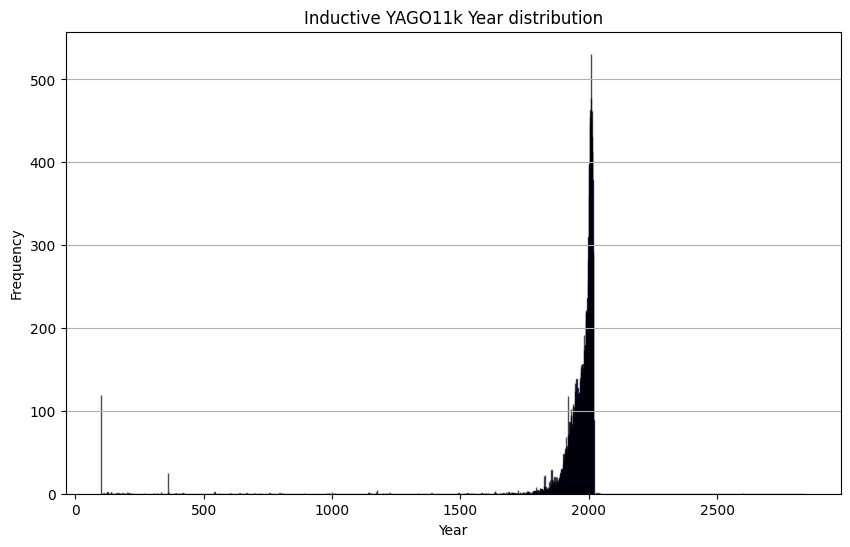

In [17]:
plot_year_distribution(inductve_yago, "relation_start_date", title="Inductive YAGO11k Year distribution")

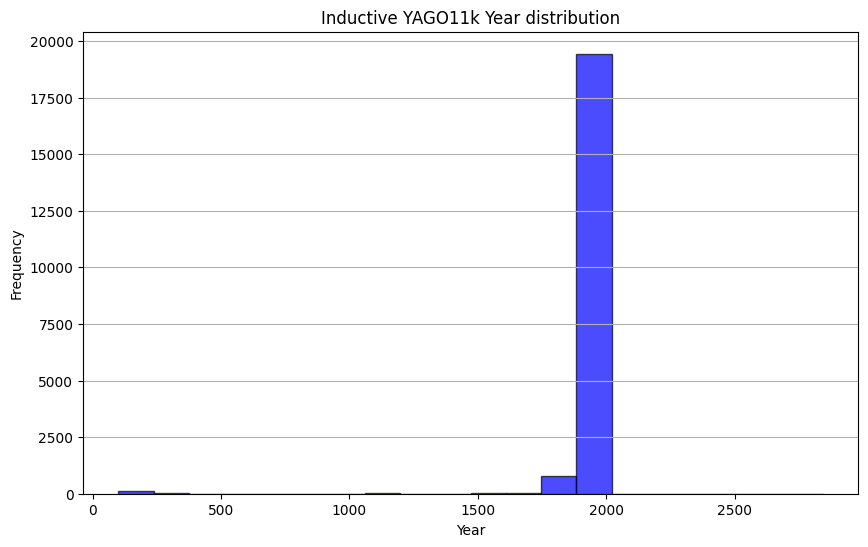

In [18]:
plot_year_distribution_bins(inductve_yago, "relation_start_date", title="Inductive YAGO11k Year distribution", bins=20)

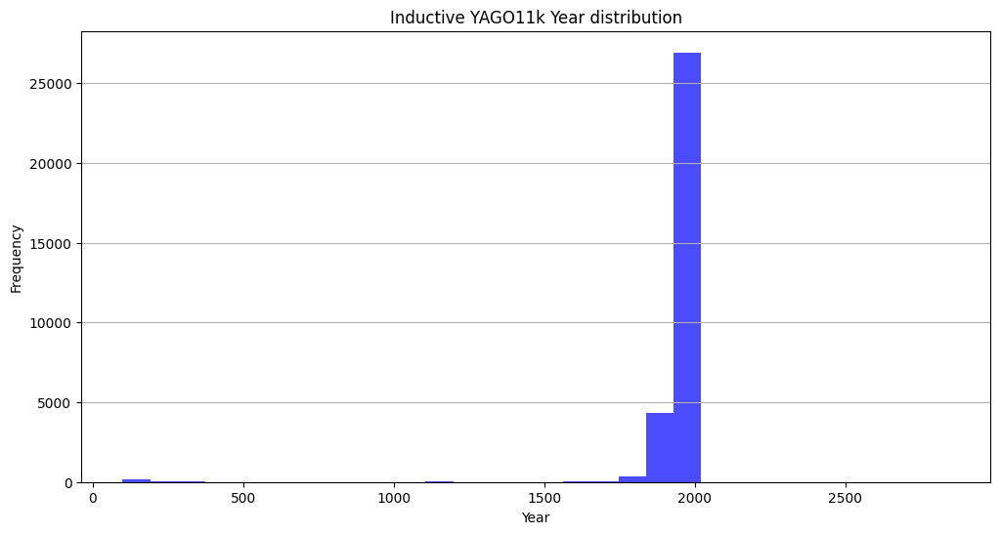

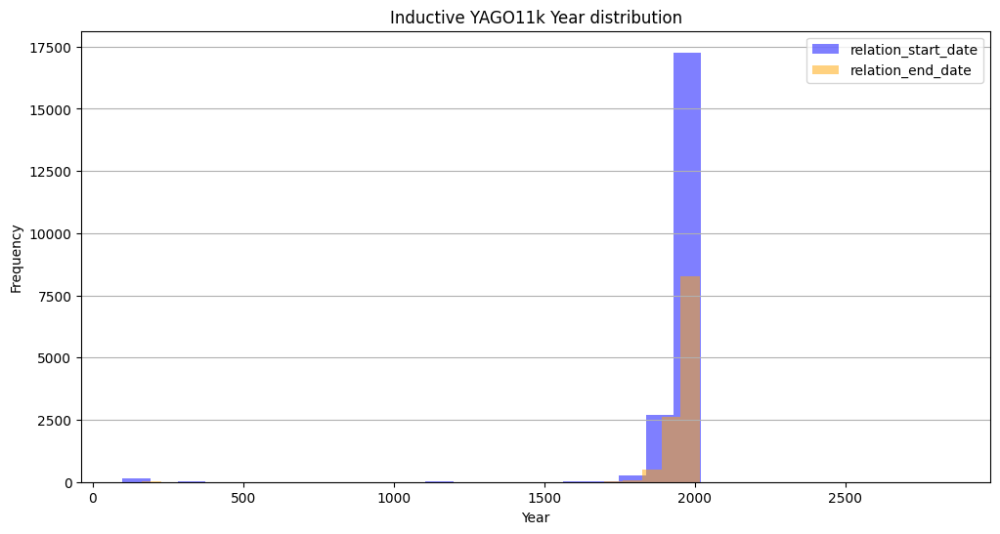

In [19]:
plot_year_distributions(inductve_yago, "relation_start_date", "relation_end_date", title="Inductive YAGO11k Year distribution")

greatest number of occurences: 26
smallest number of occurences: 1


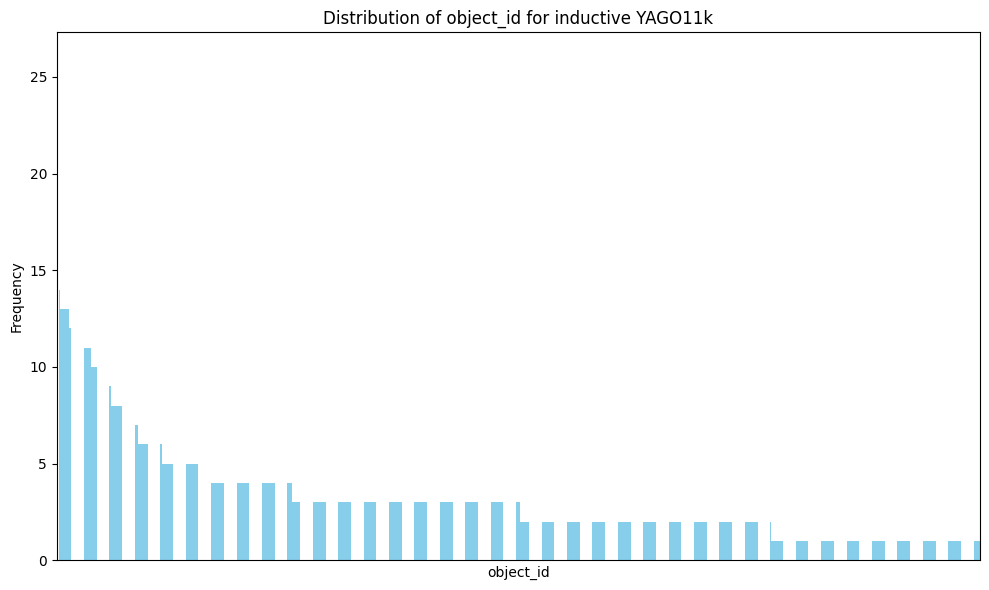

greatest number of occurences: 347
smallest number of occurences: 1


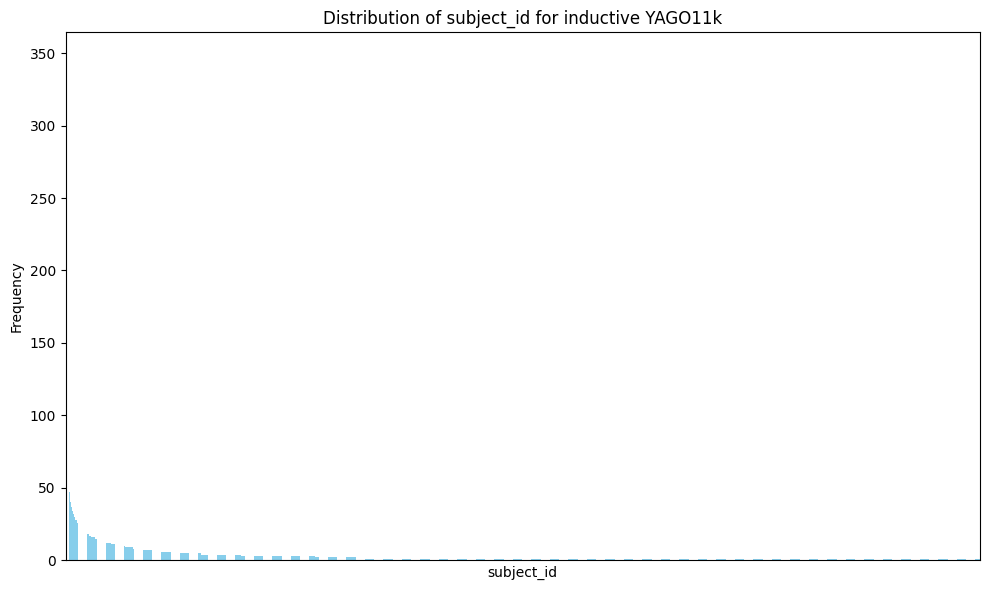

greatest number of occurences: 4787
smallest number of occurences: 408


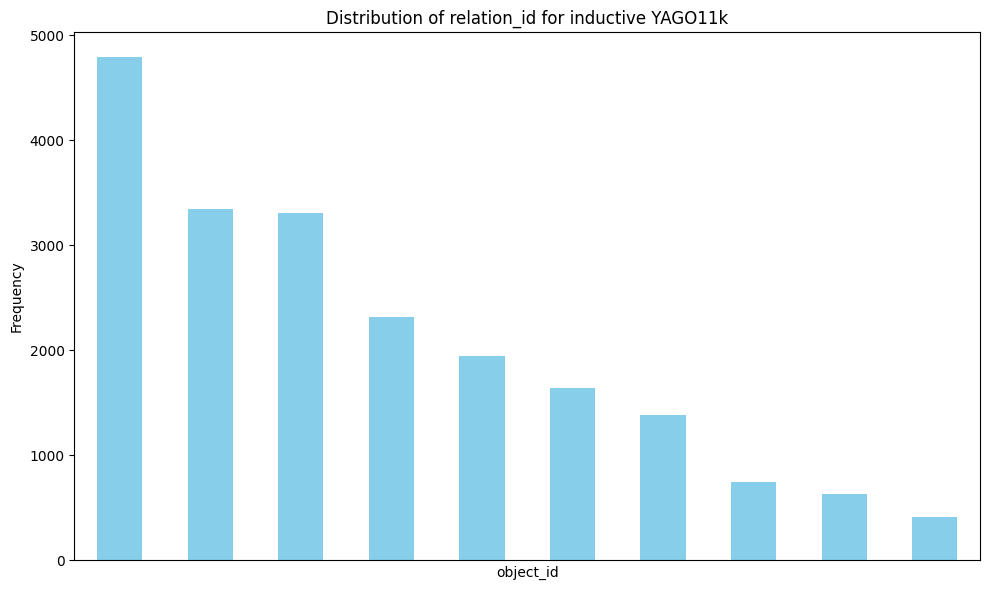

In [20]:
plot_value_counts(inductve_yago, "object_id", title="Distribution of object_id for inductive YAGO11k", x_label="object_id", y_label="Frequency")
plot_value_counts(inductve_yago, "subject_id", title="Distribution of subject_id for inductive YAGO11k", x_label="subject_id", y_label="Frequency")
plot_value_counts(inductve_yago, "subject_relation_id", title="Distribution of relation_id for inductive YAGO11k", x_label="object_id", y_label="Frequency")

In [21]:
analyze_columns("Inductive YAGO11K", inductve_yago, columns=["object_id", "object_entity_id", "object_name", "subject_id", "subject_num_id", "subject_name", "relation_name", "relation_num_id", "relation_start_date", "relation_end_date"])

Analysis Name: Inductive YAGO11K
Analysis for column 'object_id':
  - Number of unique values: 6498
  - Most common value: '6546' with 26 occurrences
  - Least common value: '6464' with 1 occurrence(s)

Analysis for column 'object_entity_id':
  - Number of unique values: 6498
  - Most common value: '<Southern_Region_of_British_Railways>' with 26 occurrences
  - Least common value: '<Government_of_Canada>' with 1 occurrence(s)

Analysis for column 'object_name':
  - Number of unique values: 6498
  - Most common value: 'Southern Region of British Railways' with 26 occurrences
  - Least common value: 'Government of Canada' with 1 occurrence(s)

Analysis for column 'subject_id':
  - Number of unique values: 6351
  - Most common value: '139' with 347 occurrences
  - Least common value: '6274' with 1 occurrence(s)

Analysis for column 'subject_num_id':
  - Number of unique values: 6351
  - Most common value: '139' with 347 occurrences
  - Least common value: '6274' with 1 occurrence(s)

Anal

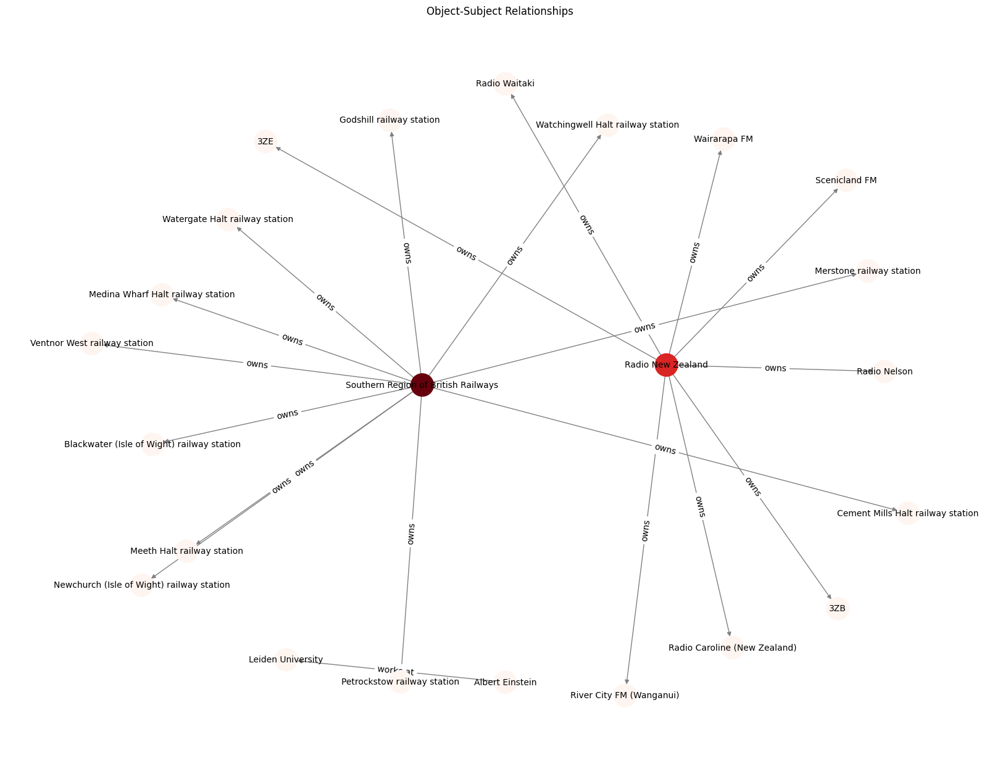

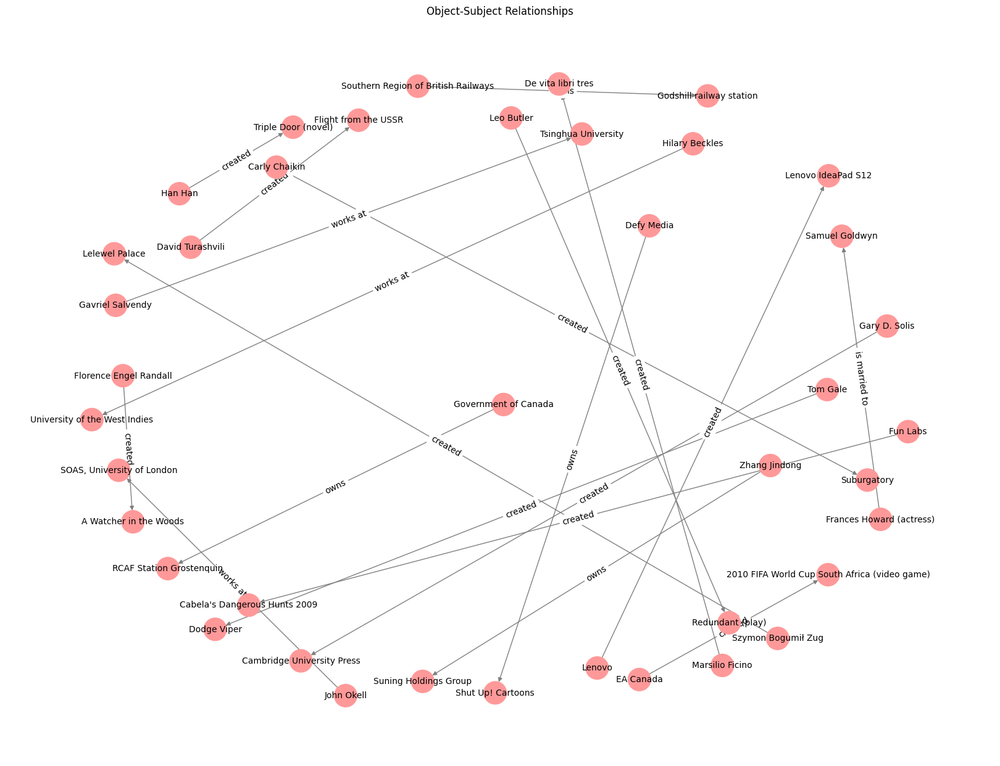

In [22]:
top_15_df = extract_top_n_common(inductve_yago, "object_name", n=5)
visualize_relationships(top_15_df.head(20), 'object_name', 'relation_name', 'subject_name')
visualize_relationships(inductve_yago.head(20), 'object_name', 'relation_name', 'subject_name')

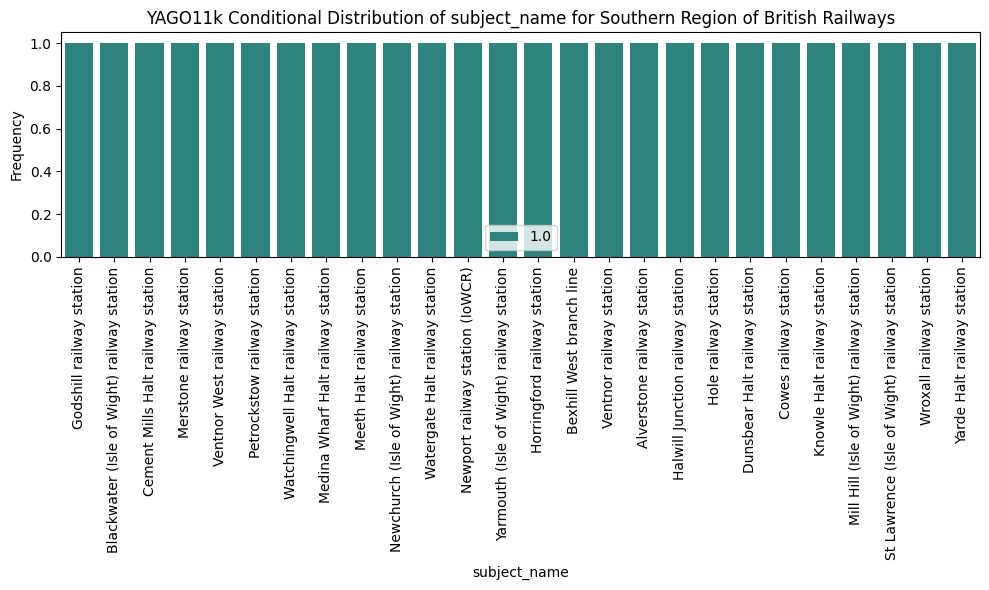

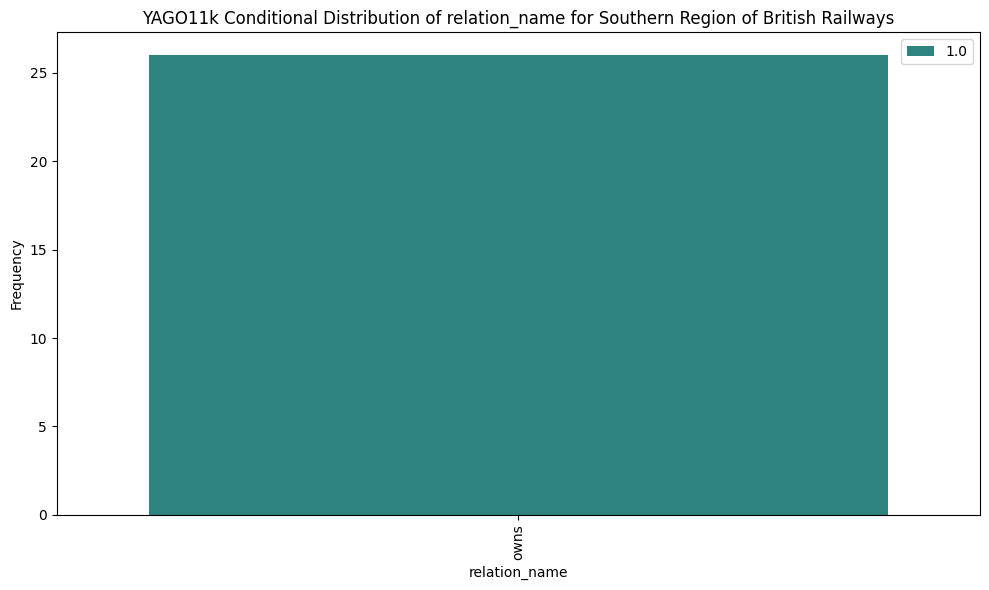

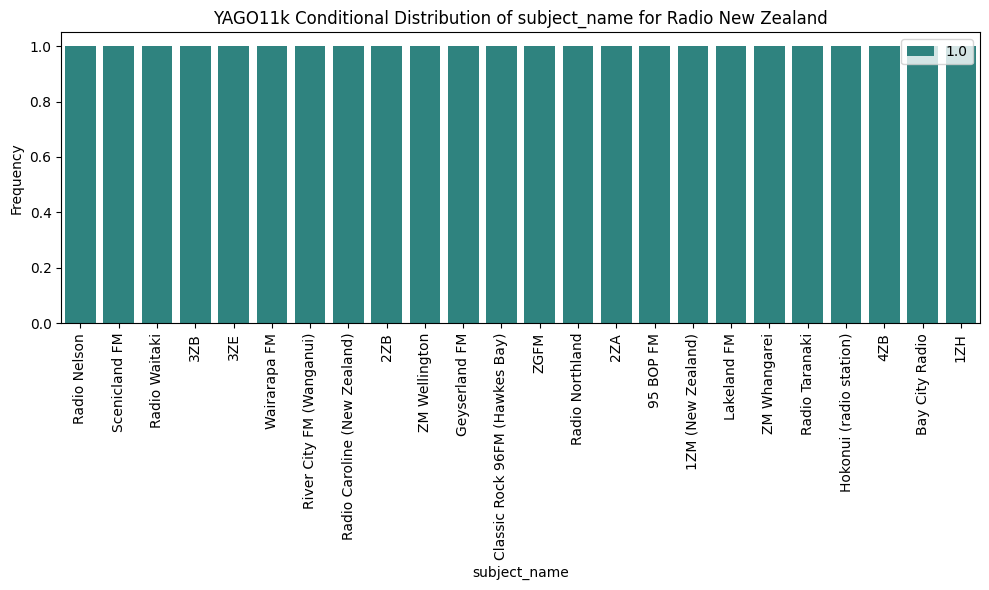

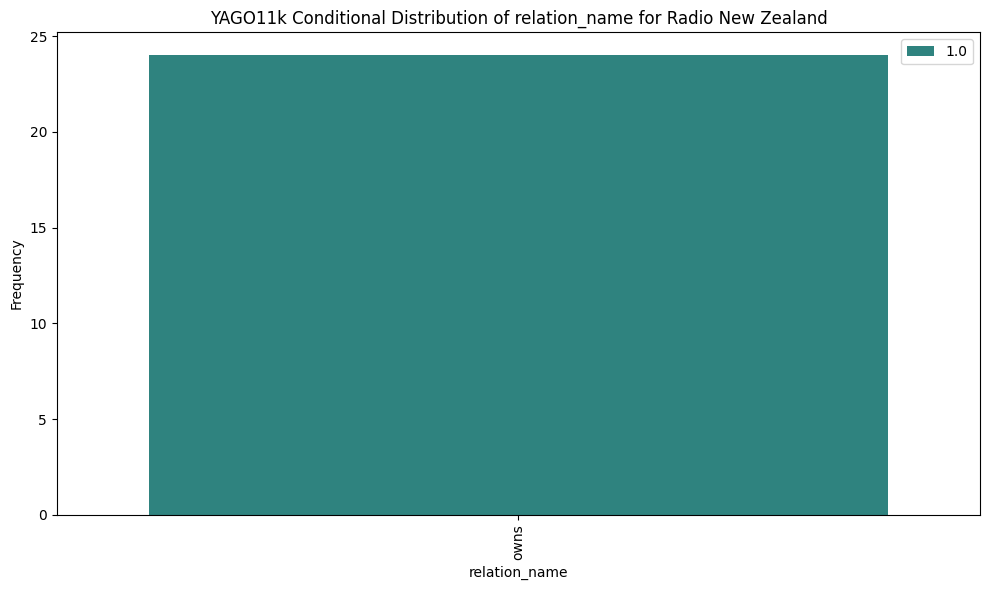

In [23]:
duplicate_values = find_duplicates(inductve_yago, 'object_name', min_occurences=20)

duplicate_values = list(duplicate_values)
for val in duplicate_values:
    plot_conditional_distribution(inductve_yago, 'object_name', val, 'subject_name', dataset_name = "YAGO11k")
    plot_conditional_distribution(inductve_yago, 'object_name', val, 'relation_name', dataset_name = "YAGO11k")

### WikiData

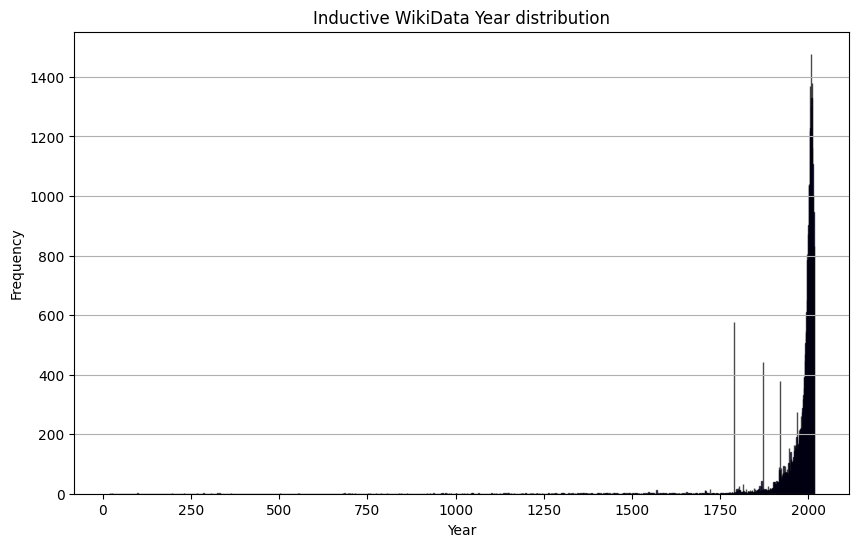

In [24]:
plot_year_distribution(indictive_wiki, "start_date", title="Inductive WikiData Year distribution")

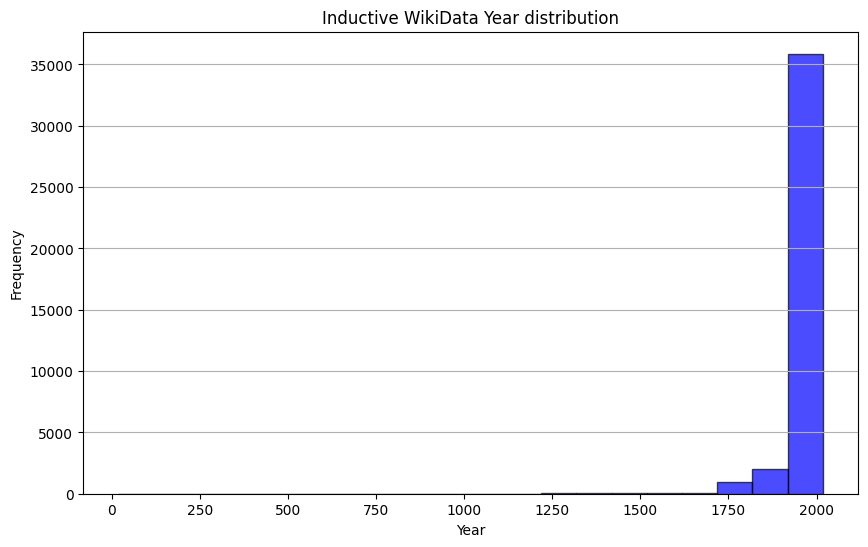

In [25]:
plot_year_distribution_bins(indictive_wiki, "start_date", title="Inductive WikiData Year distribution", bins=20)

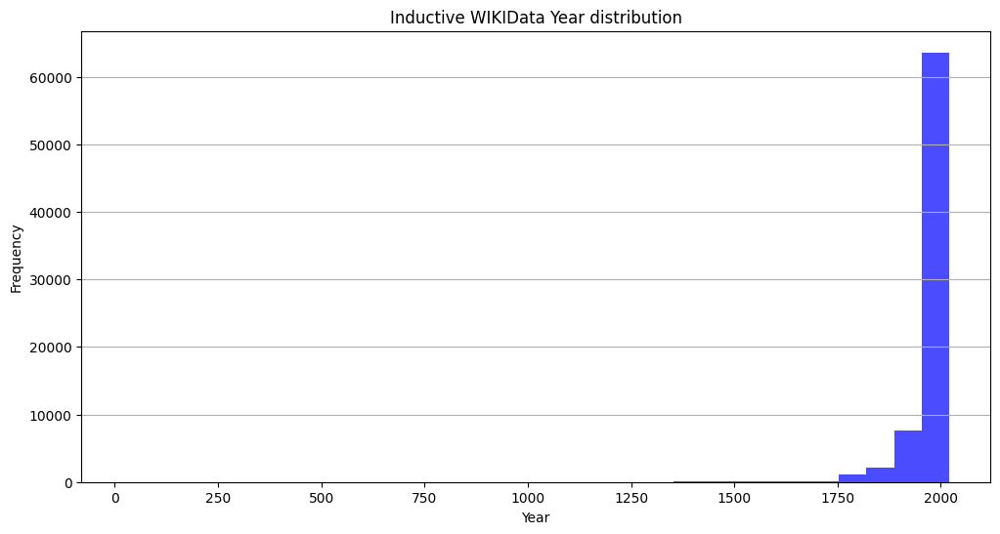

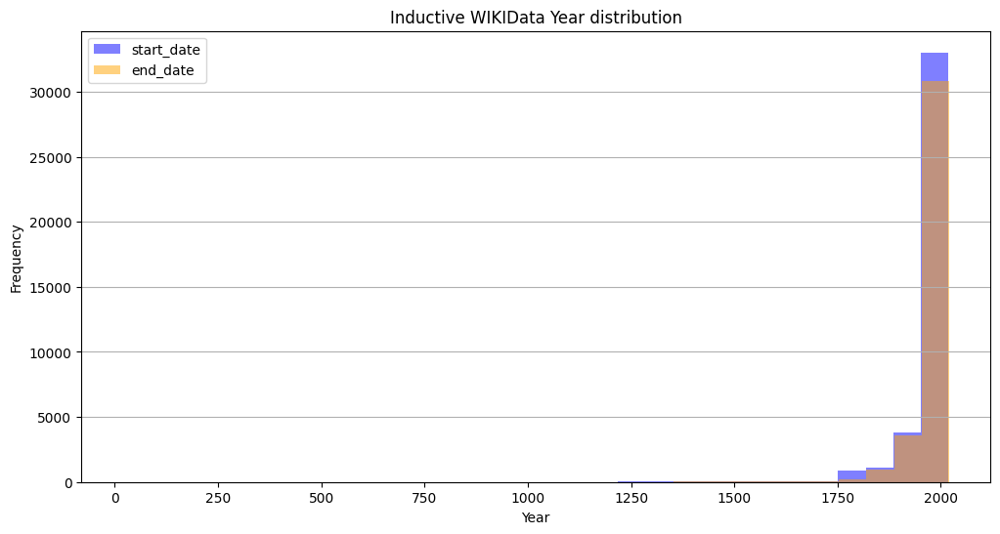

In [26]:
plot_year_distributions(indictive_wiki, "start_date", "end_date", title="Inductive WIKIData Year distribution")

greatest number of occurences: 187
smallest number of occurences: 1


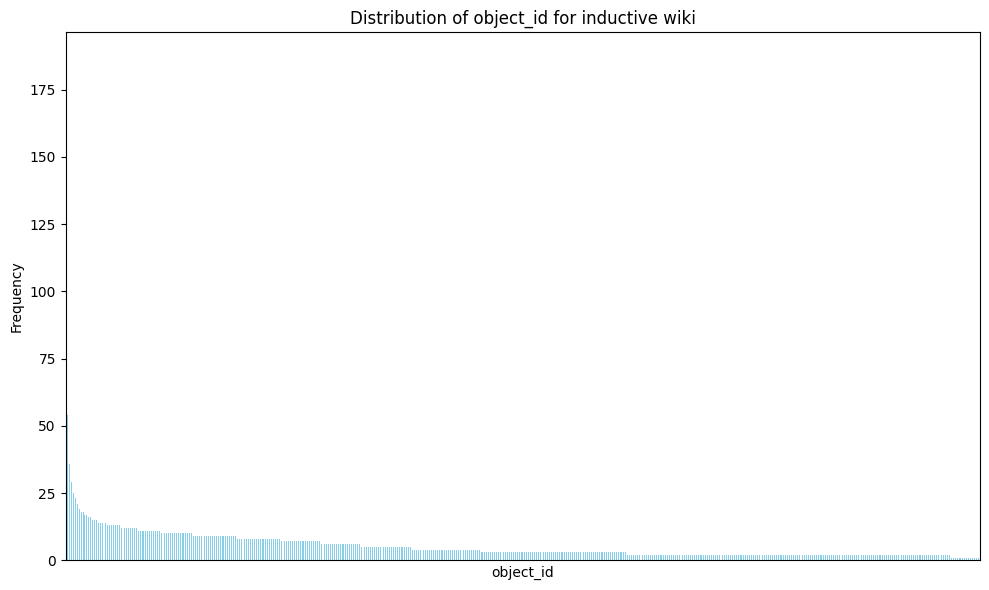

greatest number of occurences: 356
smallest number of occurences: 1


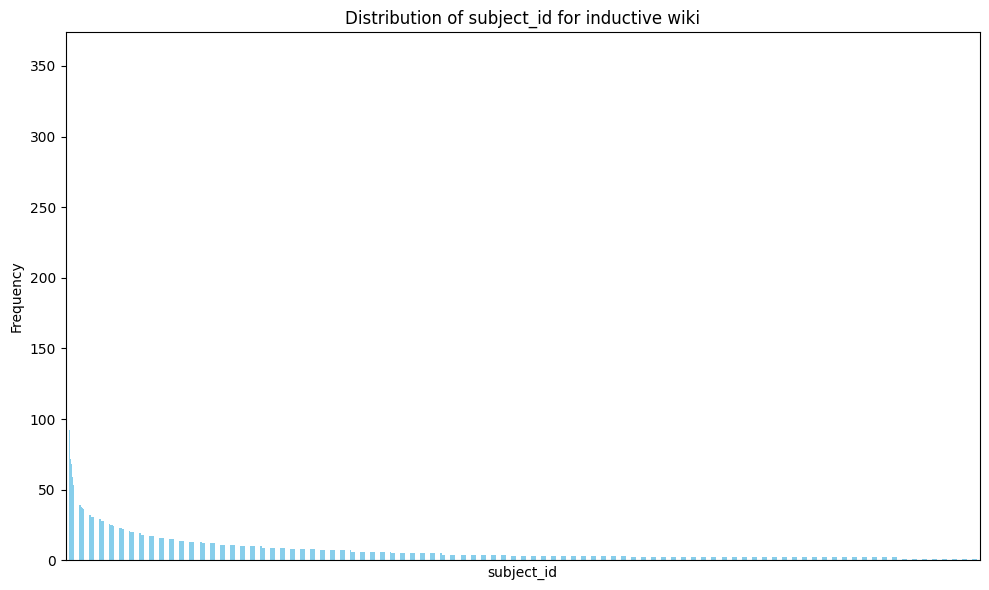

greatest number of occurences: 16090
smallest number of occurences: 80


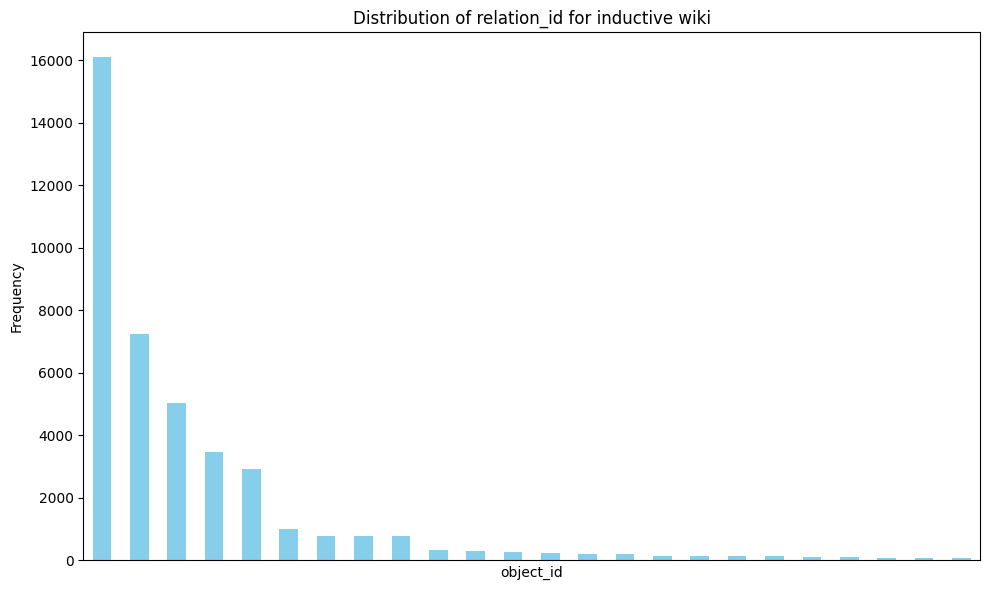

In [27]:
plot_value_counts(indictive_wiki, "object_id", title="Distribution of object_id for inductive wiki", x_label="object_id", y_label="Frequency")
plot_value_counts(indictive_wiki, "subject_id", title="Distribution of subject_id for inductive wiki", x_label="subject_id", y_label="Frequency")
plot_value_counts(indictive_wiki, "subject_relation_id", title="Distribution of relation_id for inductive wiki", x_label="object_id", y_label="Frequency")

In [28]:
analyze_columns("Inductive WikiData", indictive_wiki, columns=["object_id", "object_entity_id", "object_name", "subject_id", "subject_num_id", "subject_name", "relation_name", "relation_num_id", "start_date", "end_date"])

Analysis Name: Inductive WikiData
Analysis for column 'object_id':
  - Number of unique values: 7749
  - Most common value: '6663' with 187 occurrences
  - Least common value: '2347' with 1 occurrence(s)

Analysis for column 'object_entity_id':
  - Number of unique values: 7749
  - Most common value: 'Q23628' with 187 occurrences
  - Least common value: 'Q256531' with 1 occurrence(s)

Analysis for column 'object_name':
  - Number of unique values: 7741
  - Most common value: 'The Sopranos' with 187 occurrences
  - Least common value: 'Kingdom of Scotland' with 1 occurrence(s)

Analysis for column 'subject_id':
  - Number of unique values: 5395
  - Most common value: '7092' with 356 occurrences
  - Least common value: '396' with 1 occurrence(s)

Analysis for column 'subject_num_id':
  - Number of unique values: 5395
  - Most common value: '7092' with 356 occurrences
  - Least common value: '396' with 1 occurrence(s)

Analysis for column 'subject_name':
  - Number of unique values: 5366


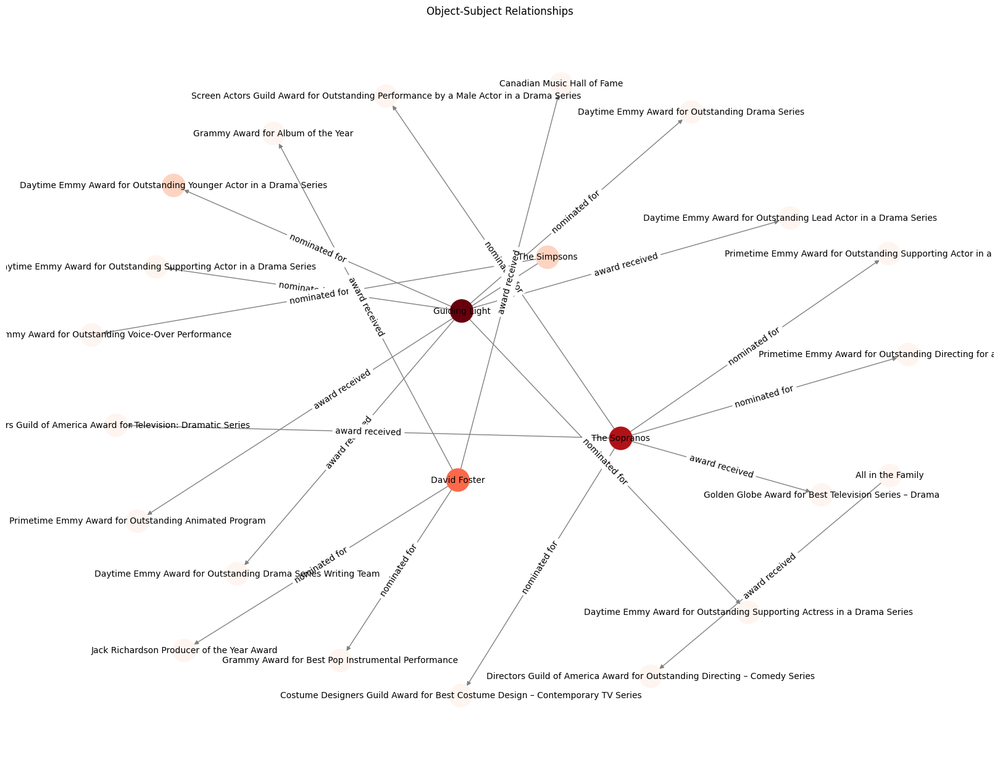

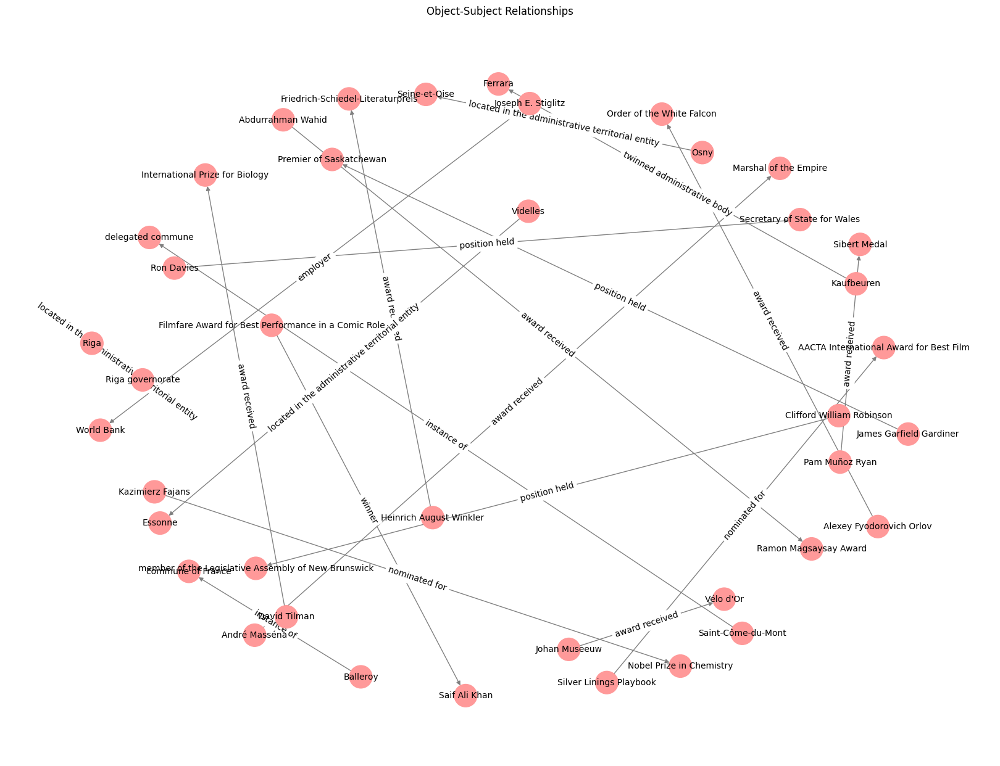

In [29]:
top_15_df = extract_top_n_common(indictive_wiki, "object_name", n=5)
visualize_relationships(top_15_df.head(20), 'object_name', 'relation_name', 'subject_name')
visualize_relationships(indictive_wiki.head(20), 'object_name', 'relation_name', 'subject_name')

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


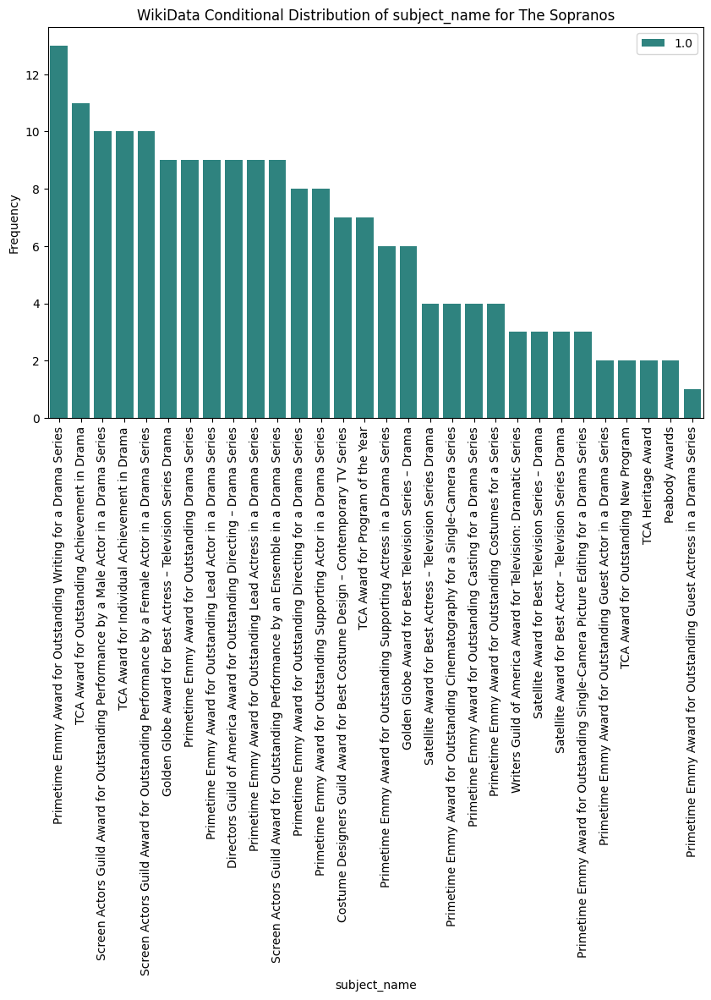

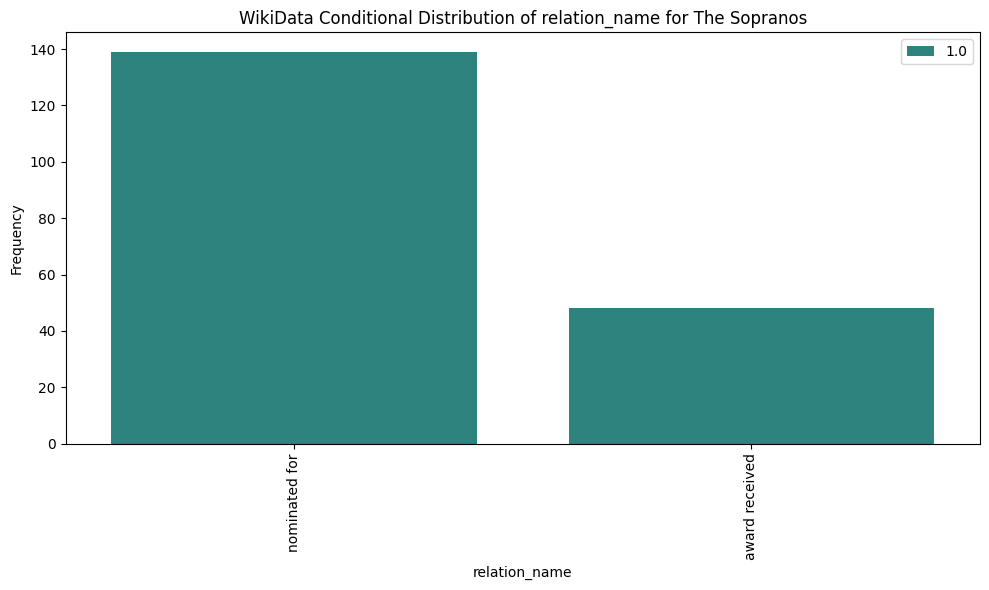

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


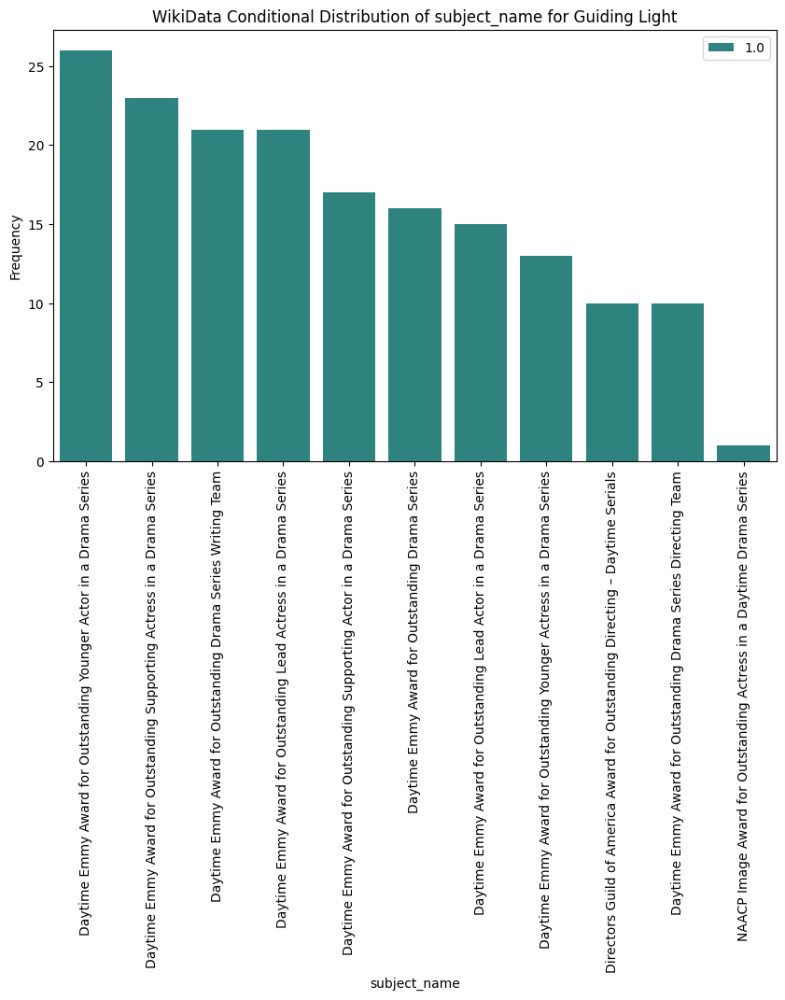

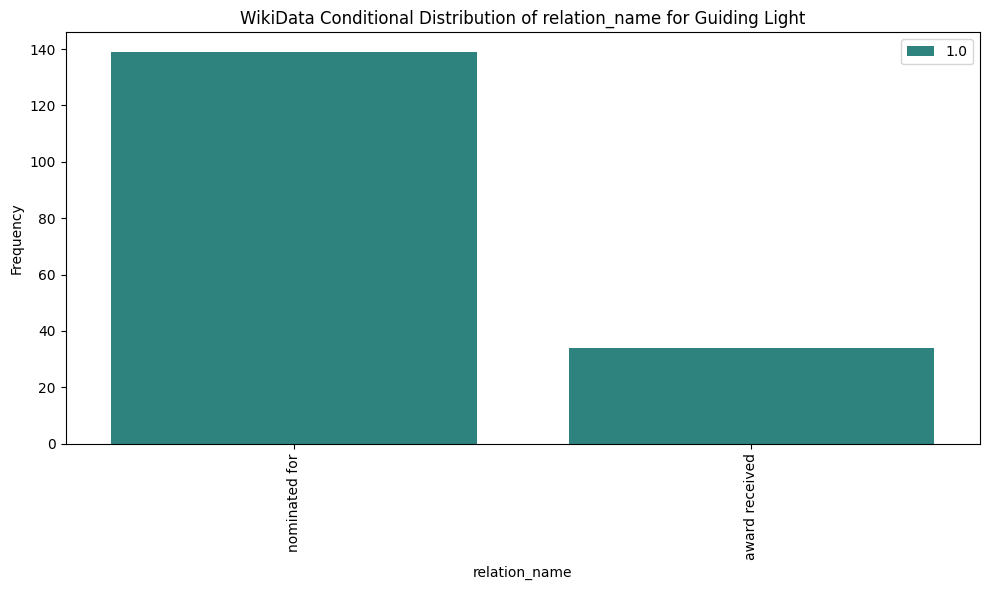

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


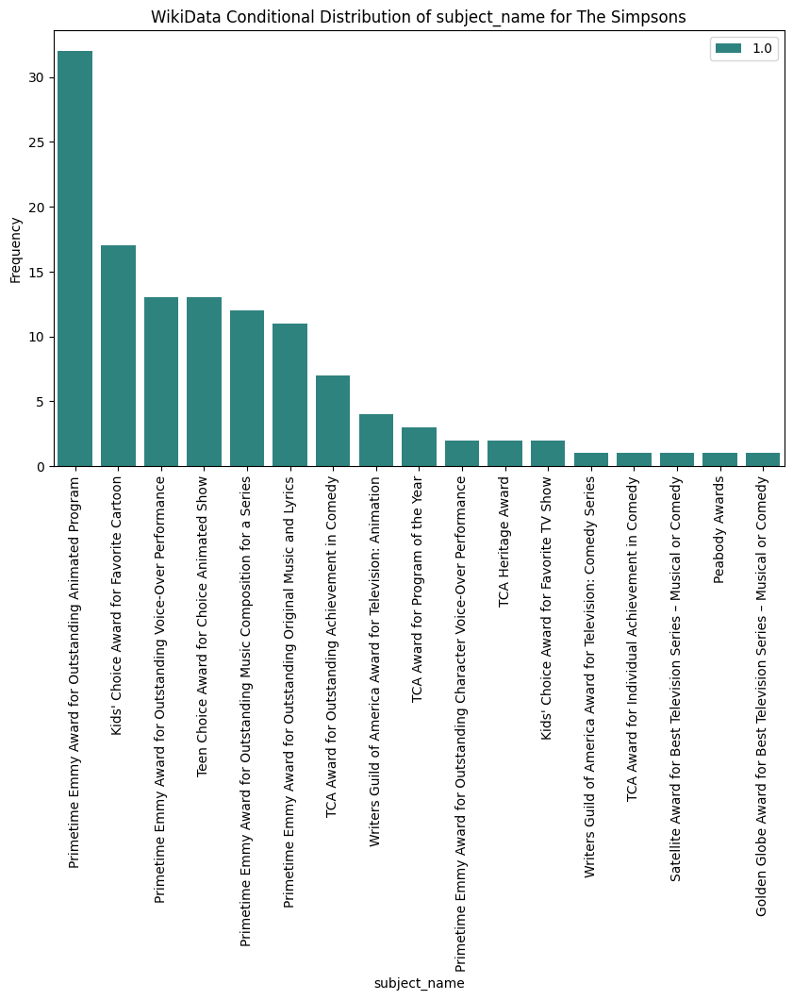

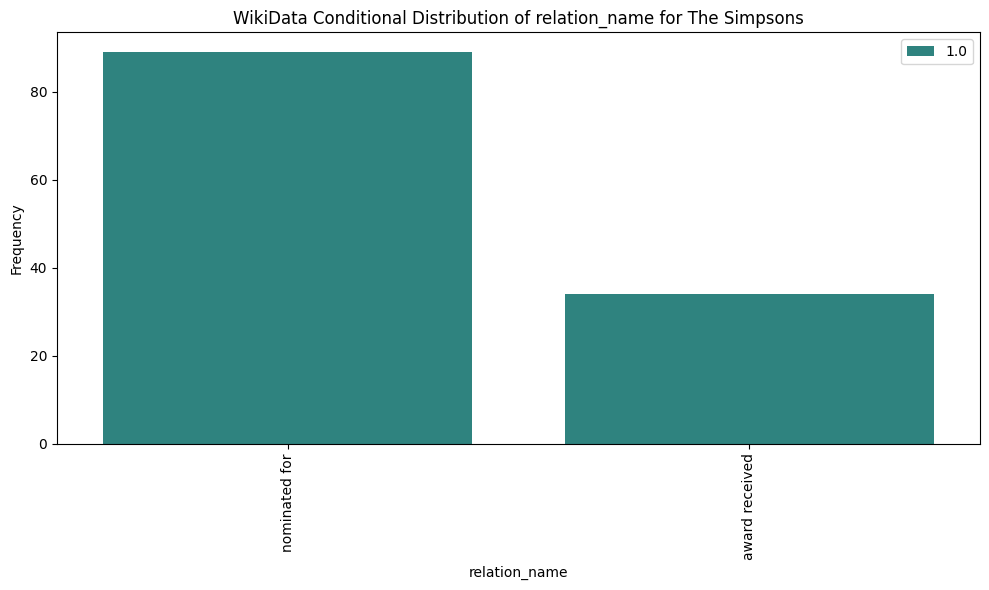

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


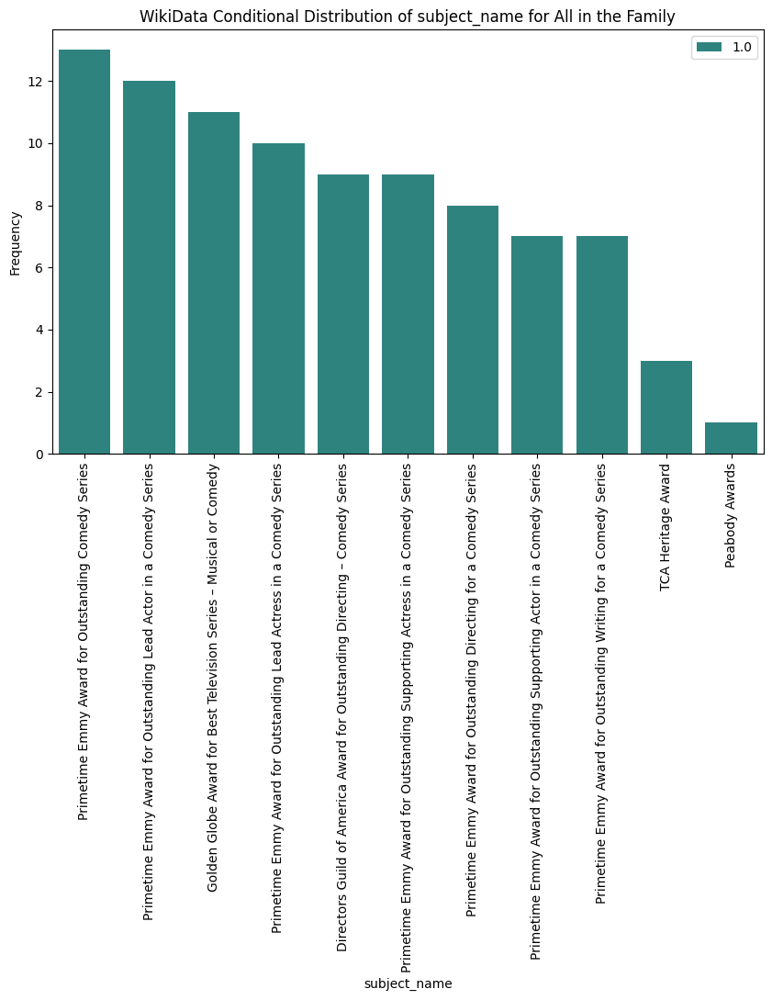

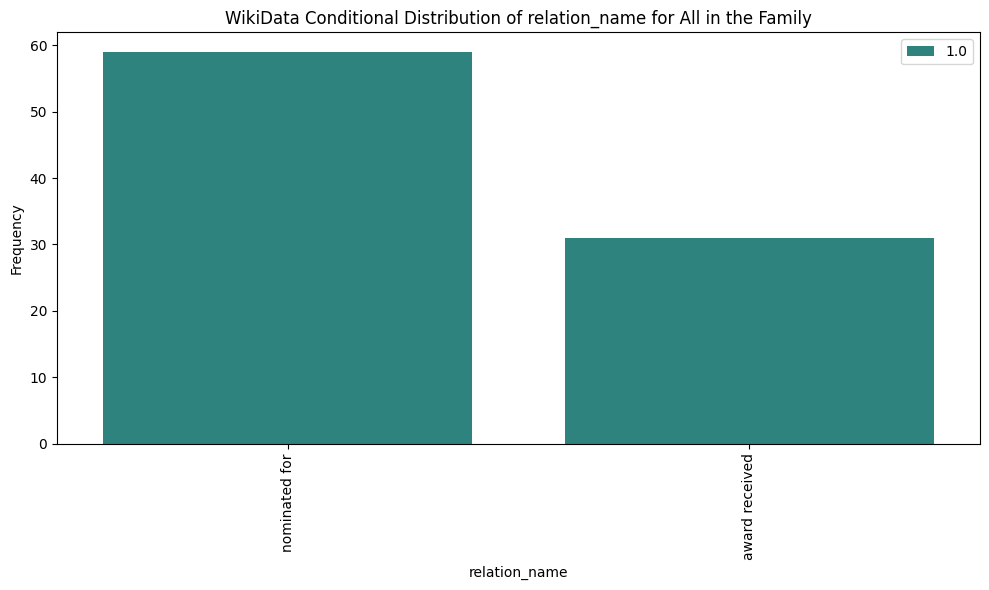

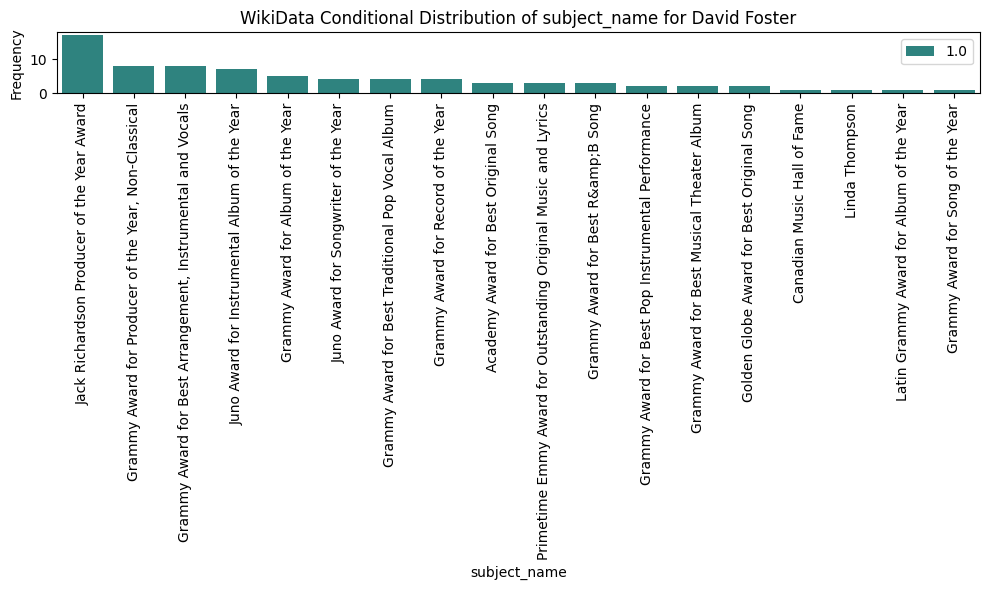

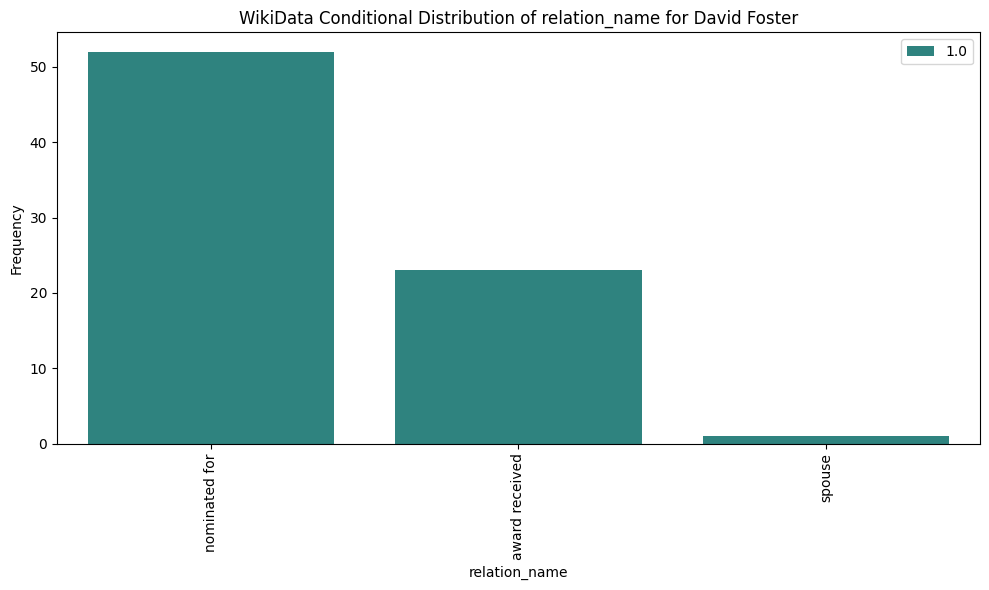

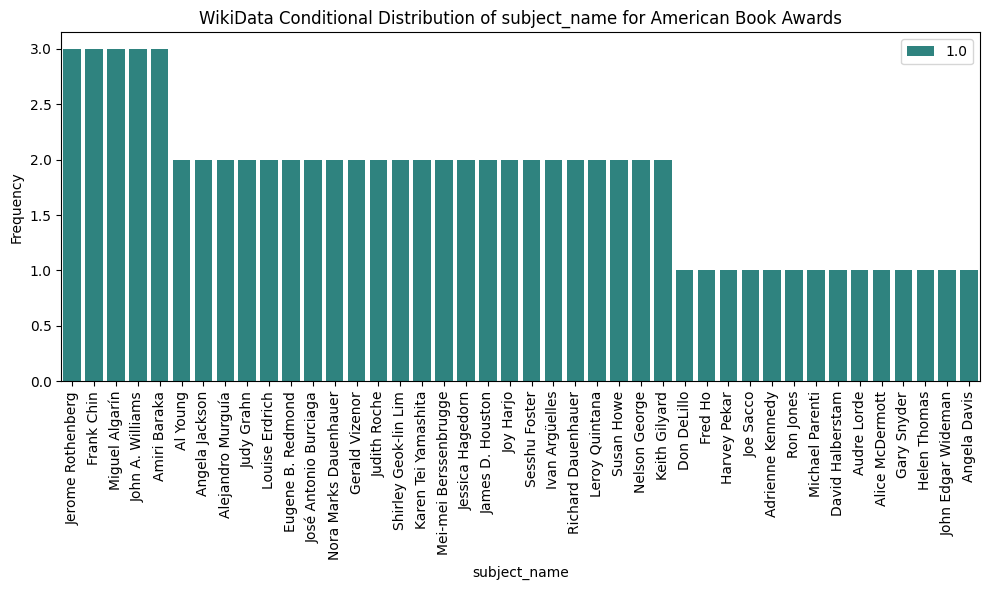

...

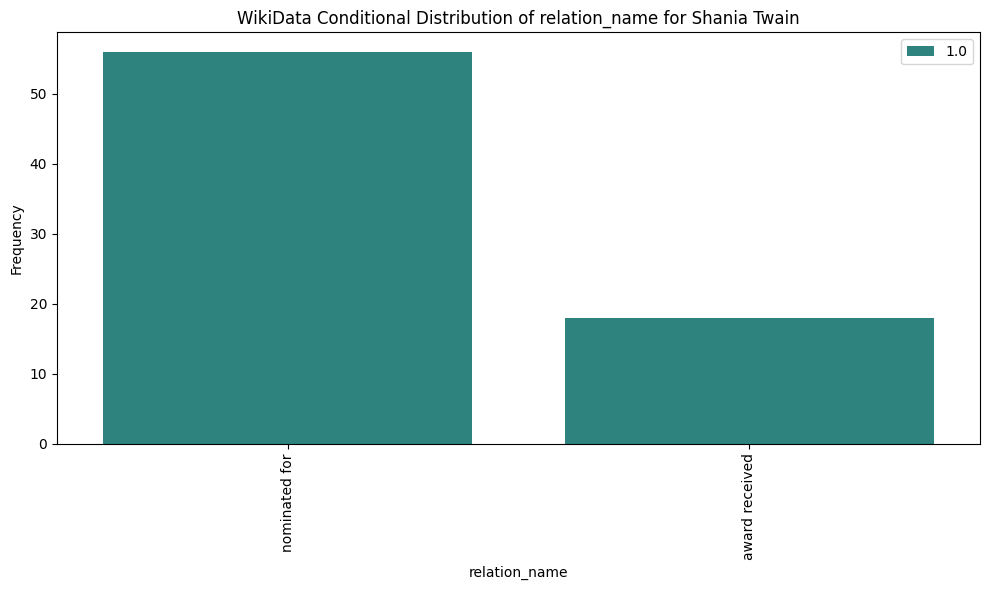

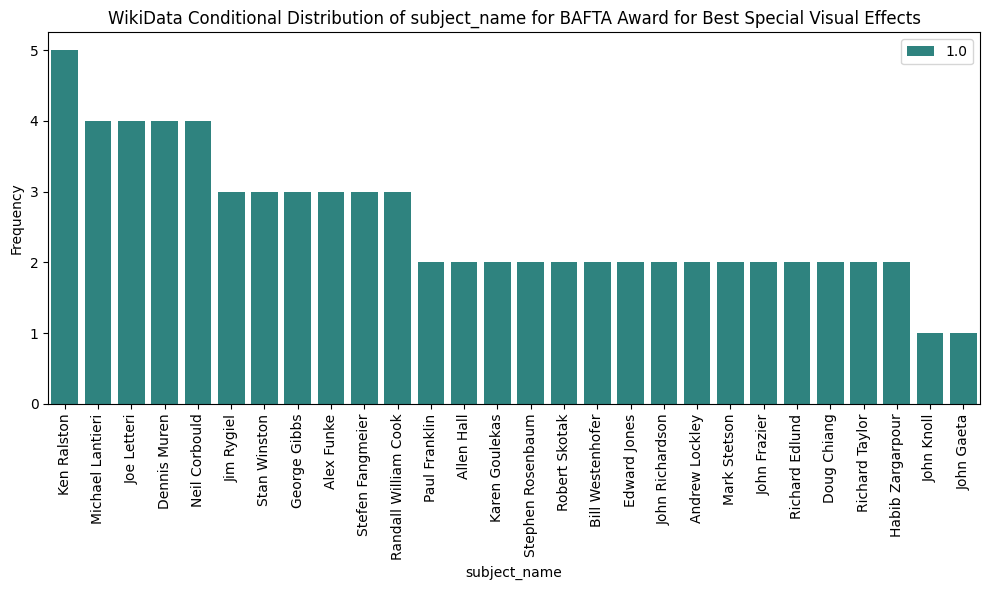

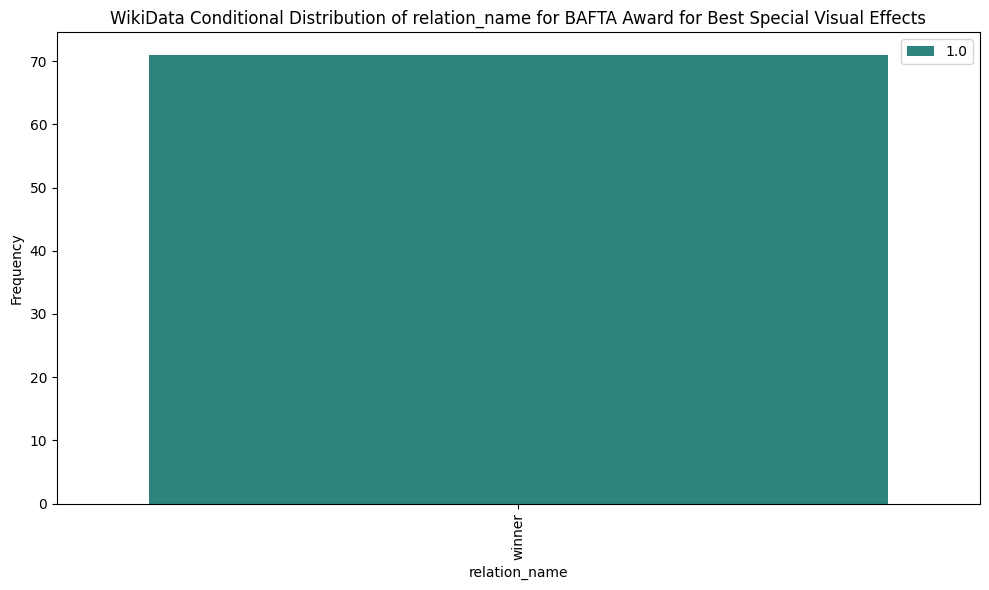

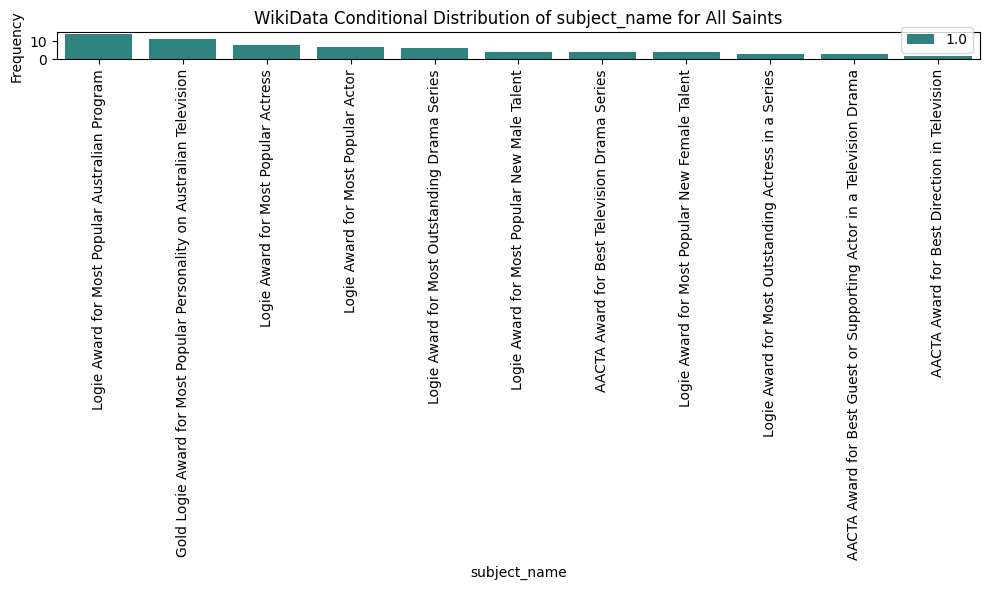

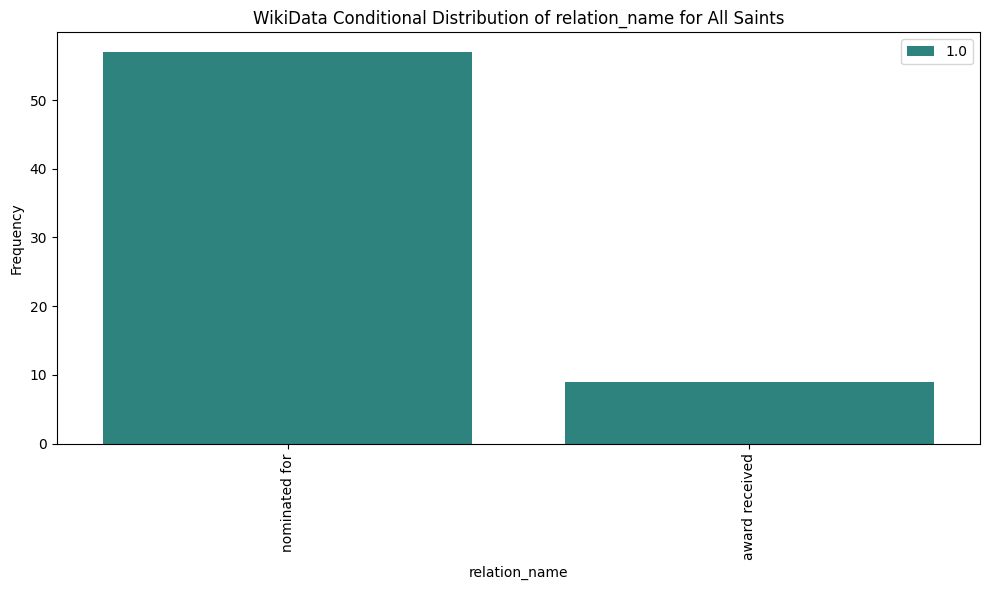

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


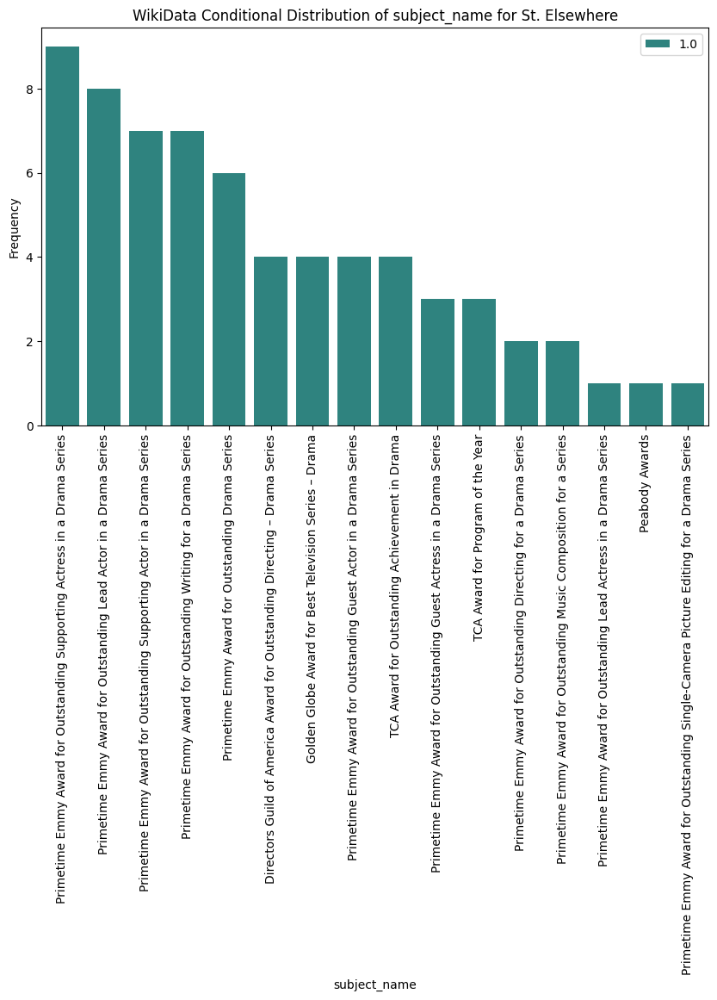

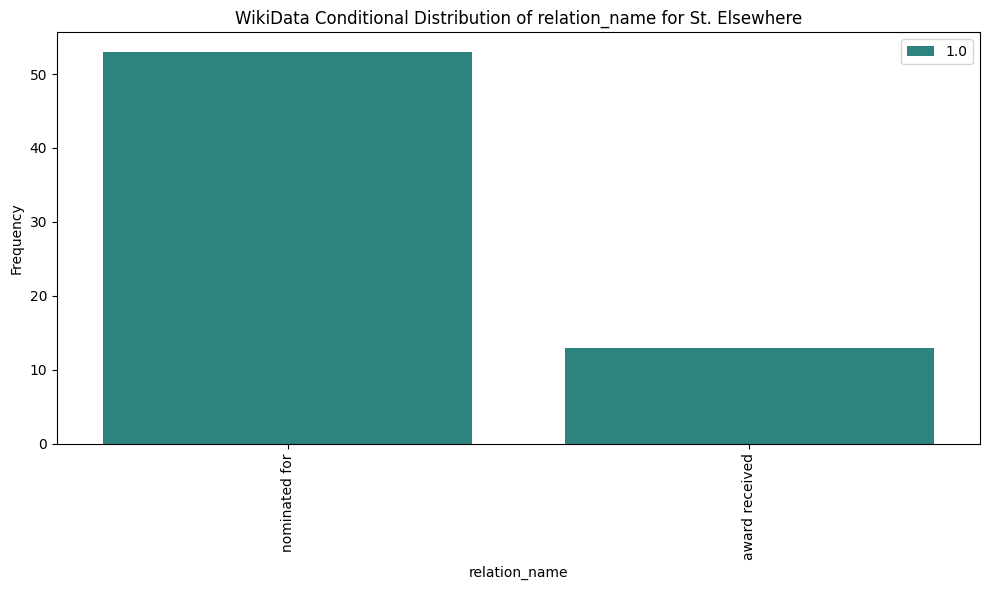

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


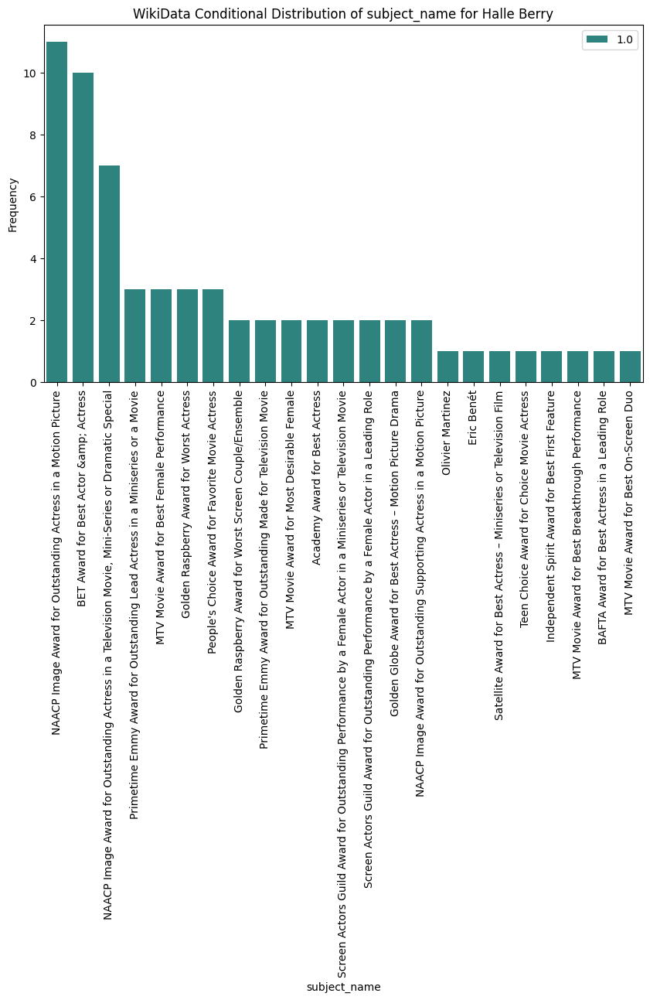

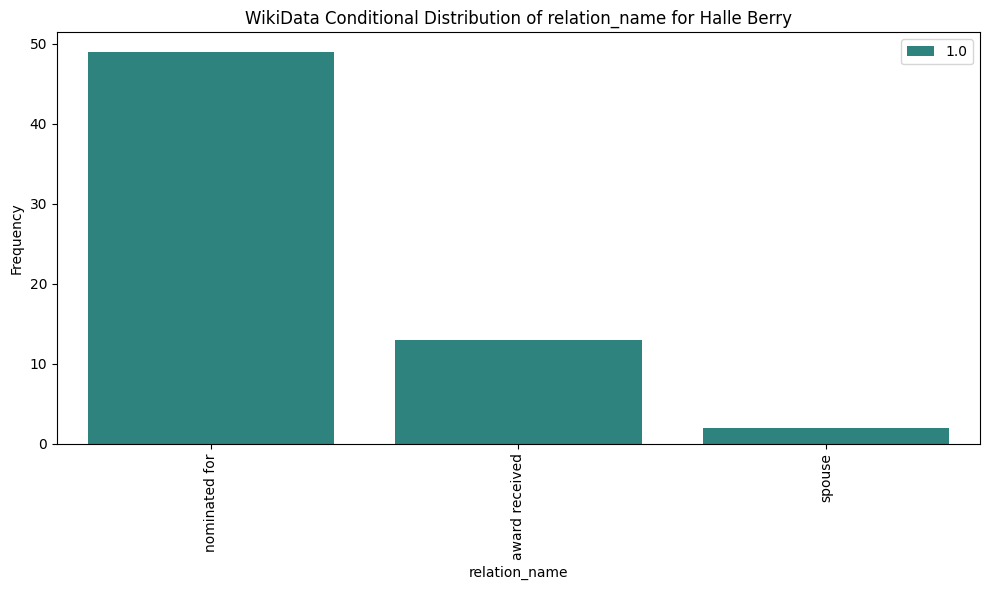

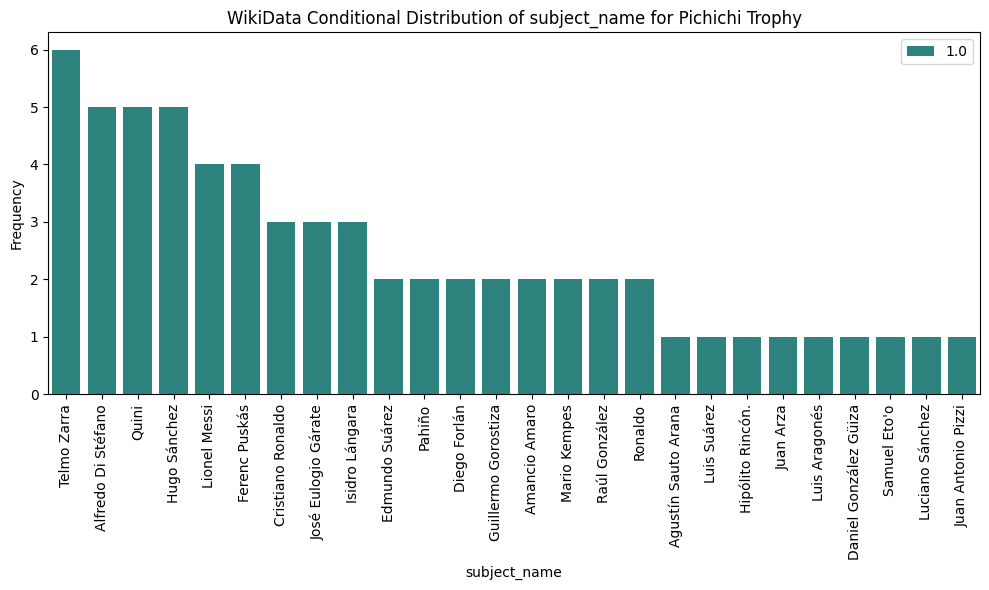

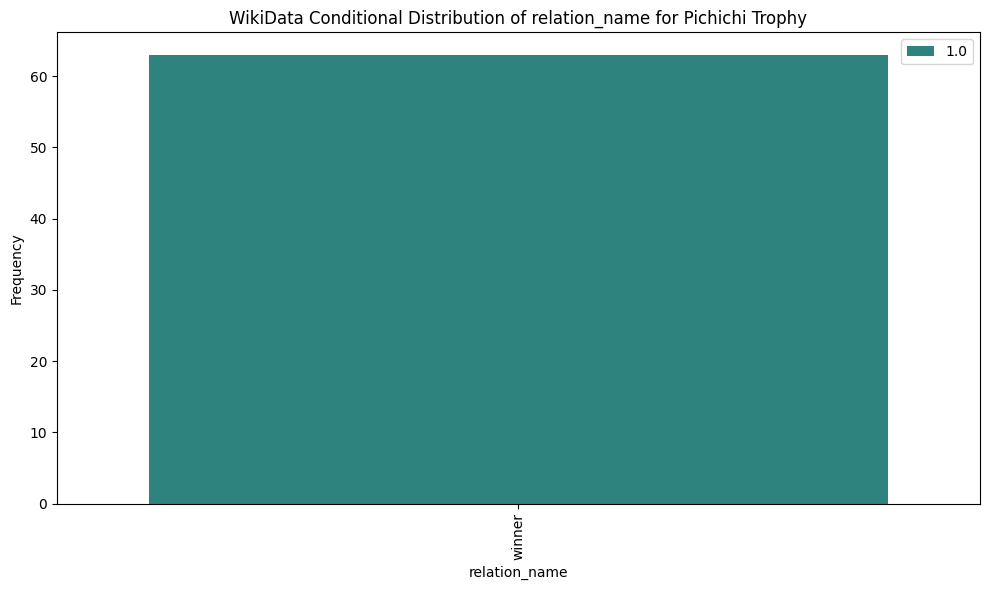

In [30]:
duplicate_values = find_duplicates(indictive_wiki, 'object_name', min_occurences=60)

duplicate_values = list(duplicate_values)
for val in duplicate_values:
    plot_conditional_distribution(indictive_wiki, 'object_name', val, 'subject_name', dataset_name = "WikiData")
    plot_conditional_distribution(indictive_wiki, 'object_name', val, 'relation_name', dataset_name = "WikiData")

### Complete

greatest number of occurences: 187
smallest number of occurences: 1


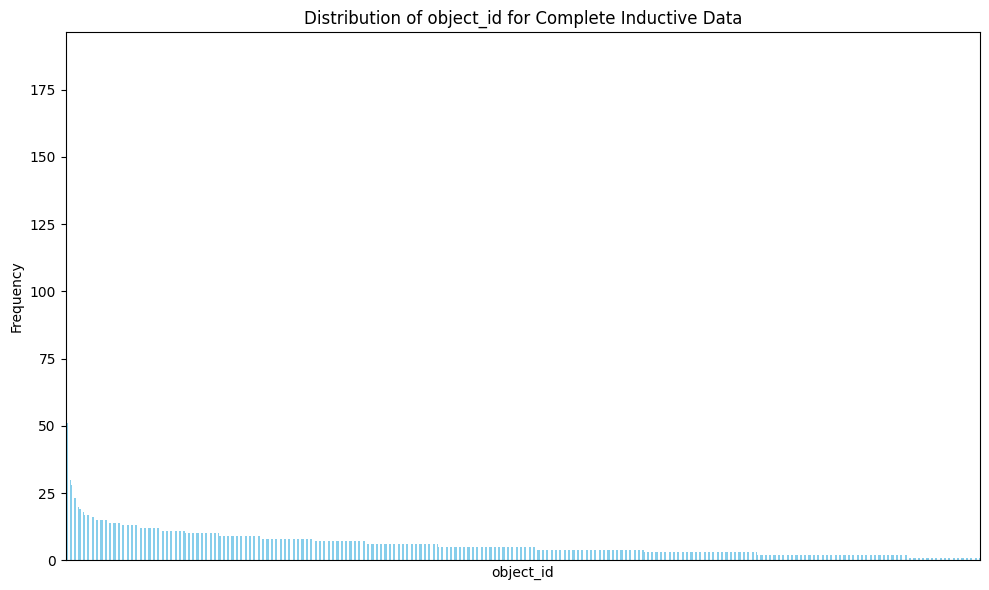

greatest number of occurences: 356
smallest number of occurences: 1


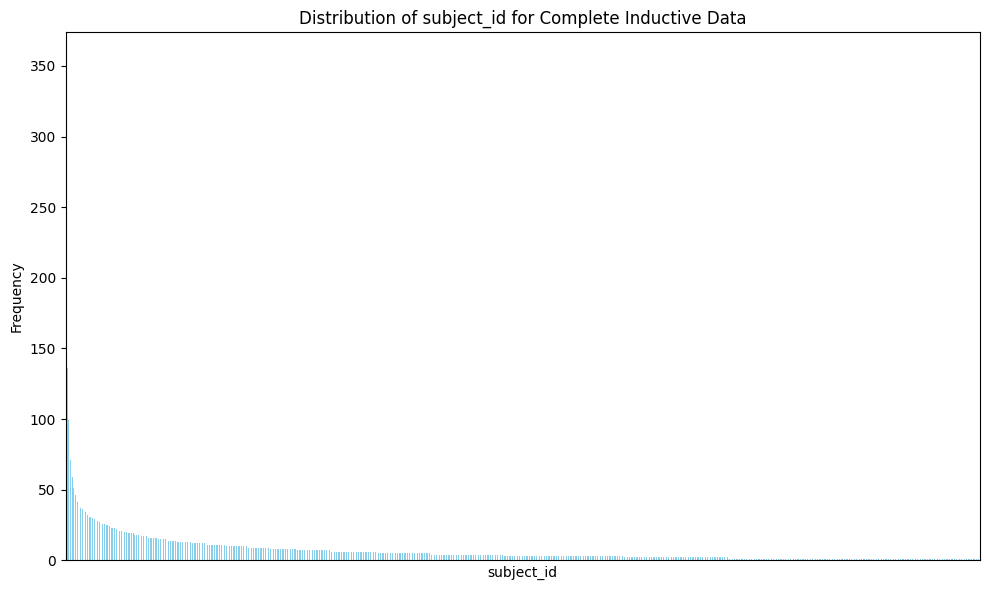

greatest number of occurences: 16090
smallest number of occurences: 80


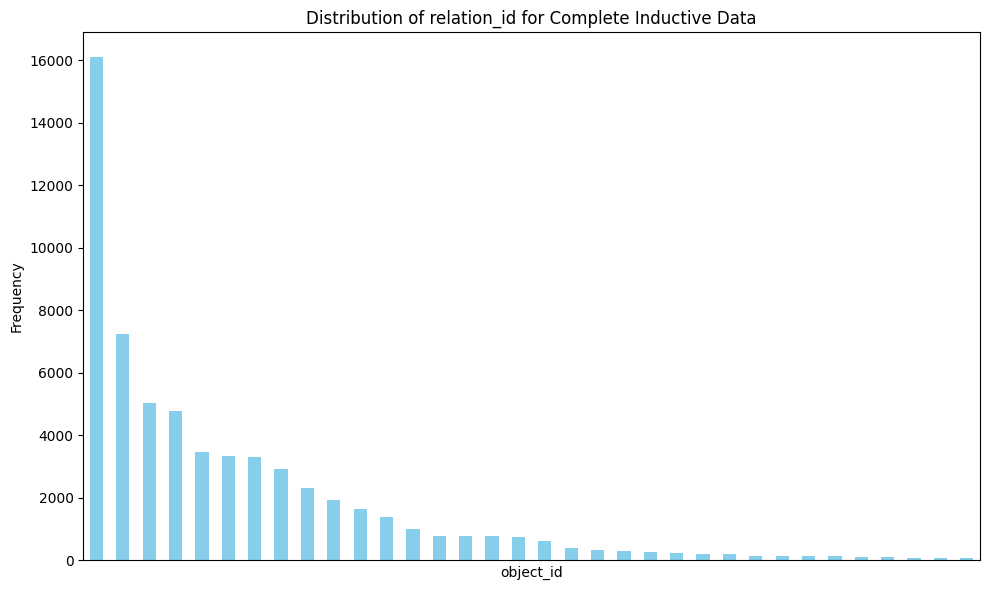

In [31]:
plot_value_counts(total_inductive, "object_id", title="Distribution of object_id for Complete Inductive Data", x_label="object_id", y_label="Frequency")
plot_value_counts(total_inductive, "subject_id", title="Distribution of subject_id for Complete Inductive Data", x_label="subject_id", y_label="Frequency")
plot_value_counts(total_inductive, "subject_relation_id", title="Distribution of relation_id for Complete Inductive Data", x_label="object_id", y_label="Frequency")

In [32]:
analyze_columns("Inductive Complete Dataset", total_inductive, columns=["object_id", "object_entity_id", "object_name", "subject_id", "subject_num_id", "subject_name", "relation_name", "relation_num_id", "relation_start_date", "relation_end_date"])

Analysis Name: Inductive Complete Dataset
Analysis for column 'object_id':
  - Number of unique values: 10267
  - Most common value: '6663' with 187 occurrences
  - Least common value: '10289' with 1 occurrence(s)

Analysis for column 'object_entity_id':
  - Number of unique values: 14247
  - Most common value: 'Q23628' with 187 occurrences
  - Least common value: 'Q53037' with 1 occurrence(s)

Analysis for column 'object_name':
  - Number of unique values: 13971
  - Most common value: 'The Sopranos' with 187 occurrences
  - Least common value: 'Ettore Scola' with 1 occurrence(s)

Analysis for column 'subject_id':
  - Number of unique values: 8769
  - Most common value: '7092' with 356 occurrences
  - Least common value: '5661' with 1 occurrence(s)

Analysis for column 'subject_num_id':
  - Number of unique values: 8769
  - Most common value: '7092' with 356 occurrences
  - Least common value: '5661' with 1 occurrence(s)

Analysis for column 'subject_name':
  - Number of unique values:

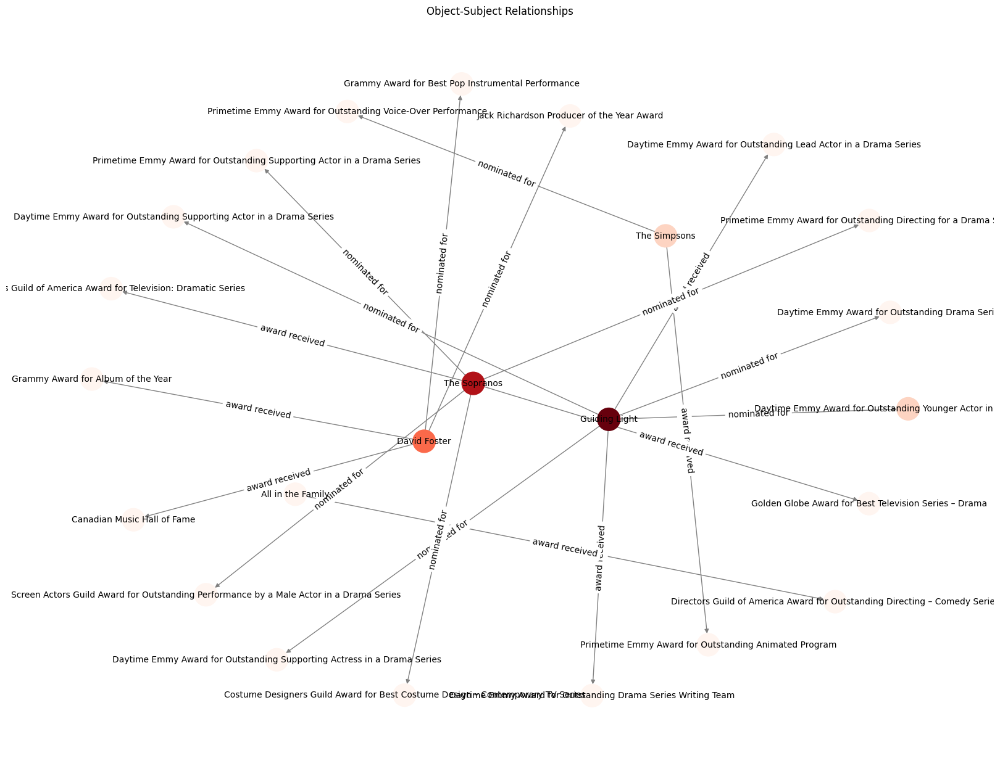

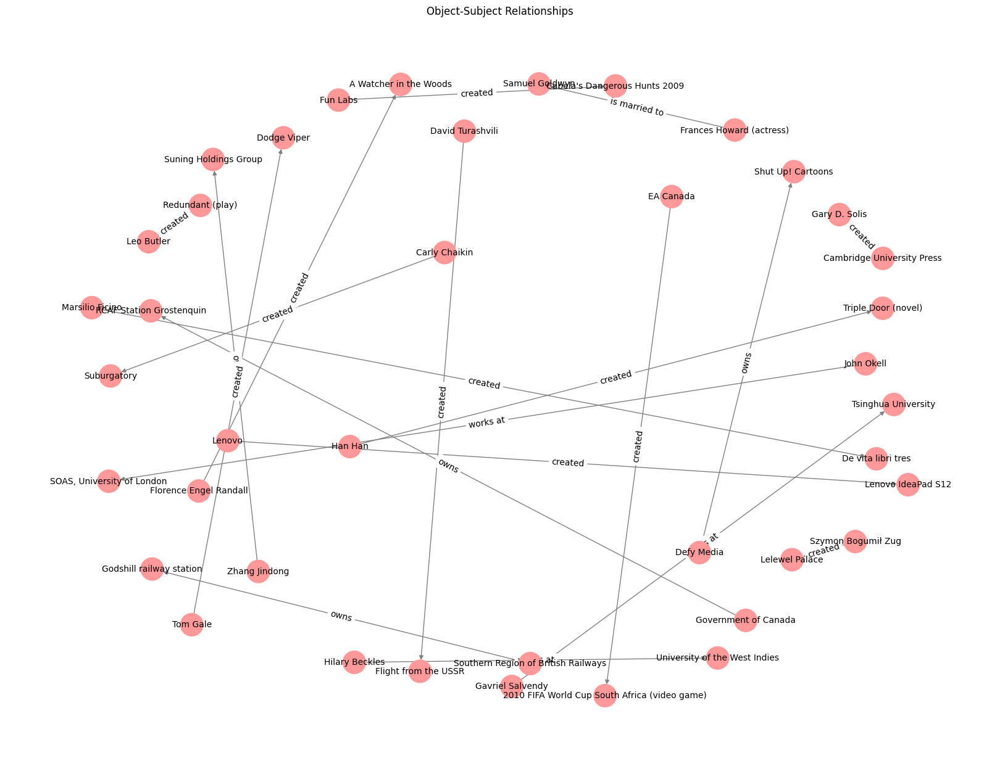

In [33]:
top_15_df = extract_top_n_common(total_inductive, "object_name", n=5)
visualize_relationships(top_15_df.head(20), 'object_name', 'relation_name', 'subject_name')
visualize_relationships(total_inductive.head(20), 'object_name', 'relation_name', 'subject_name')

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


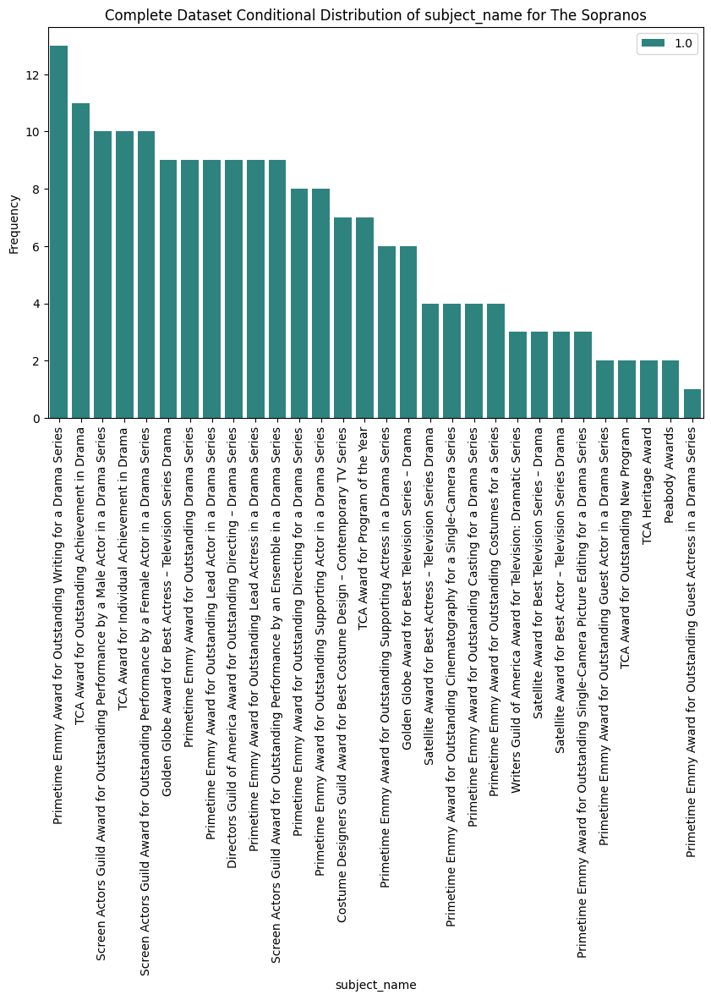

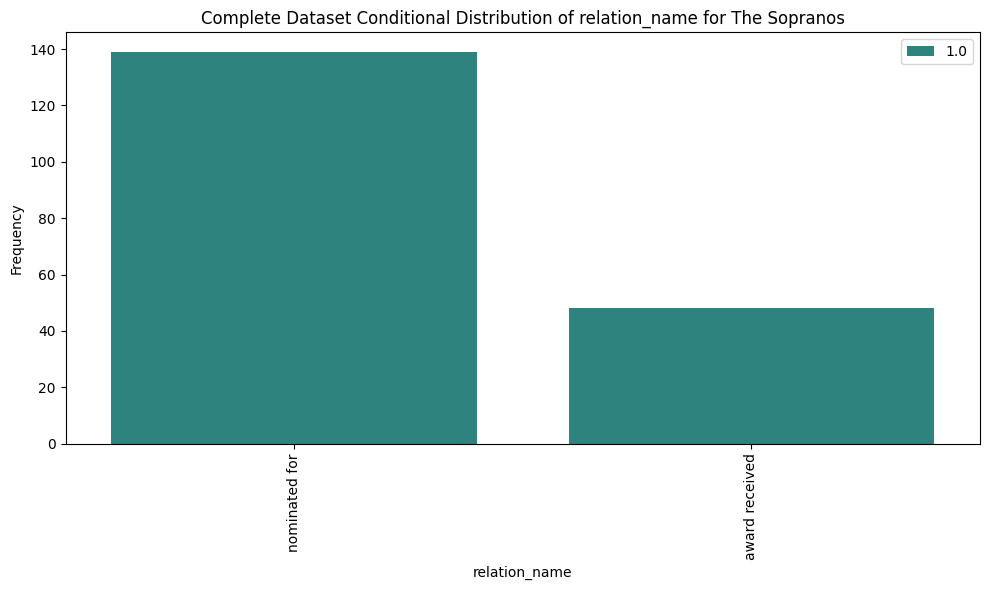

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


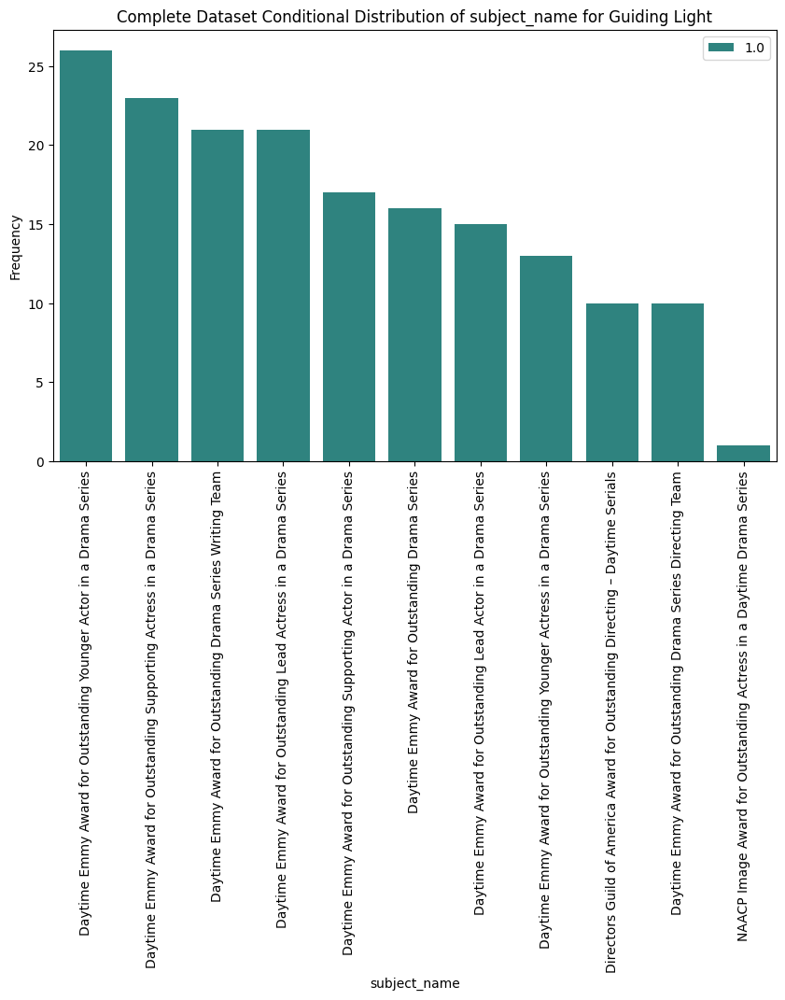

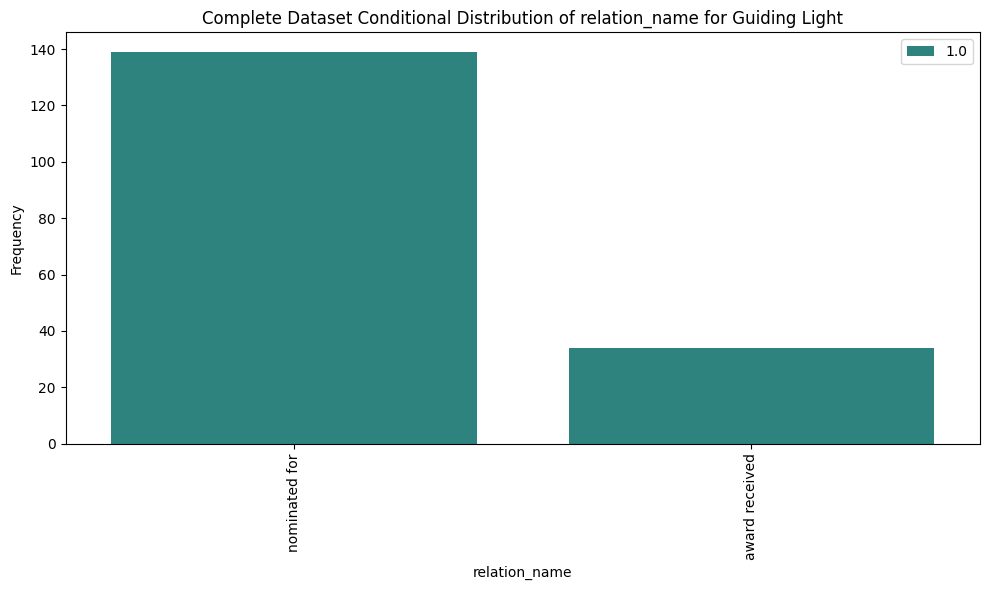

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


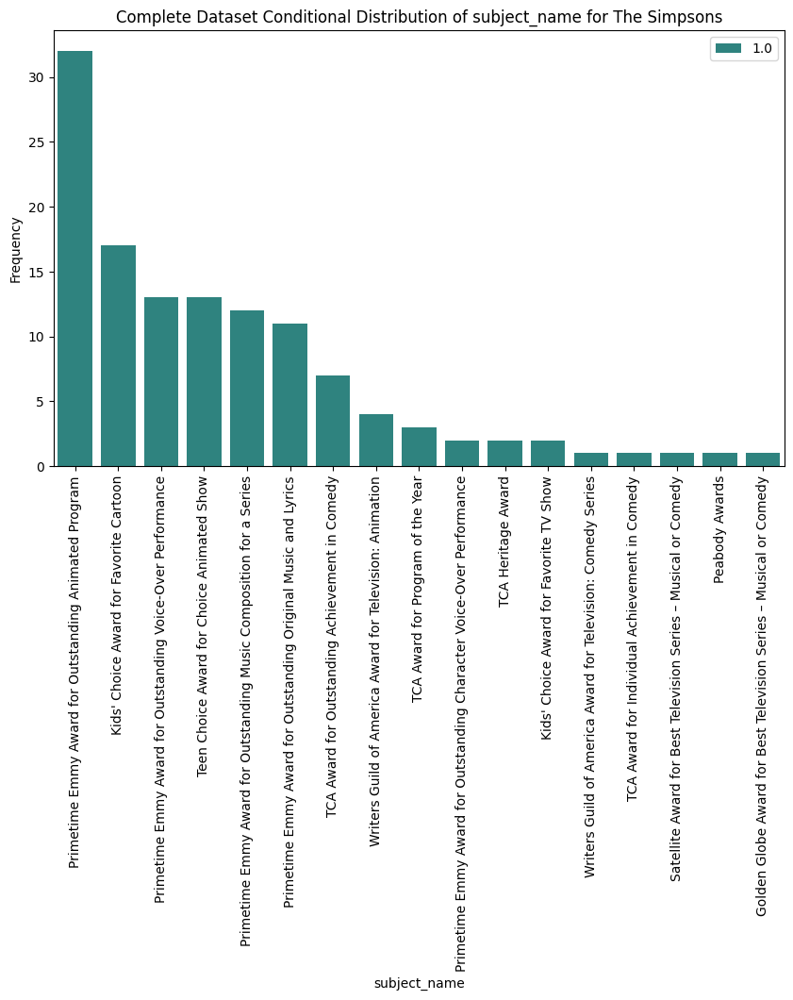

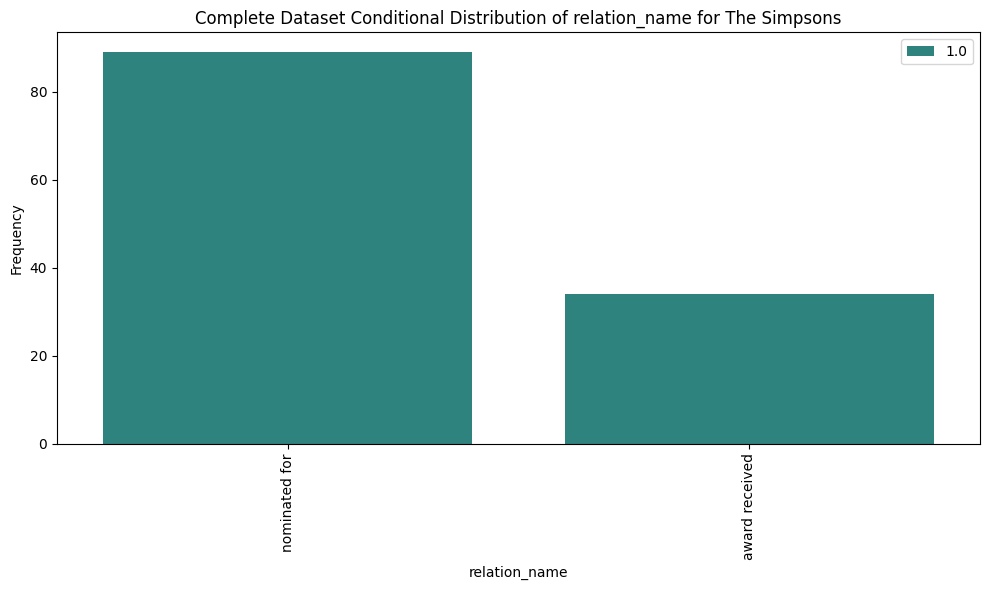

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


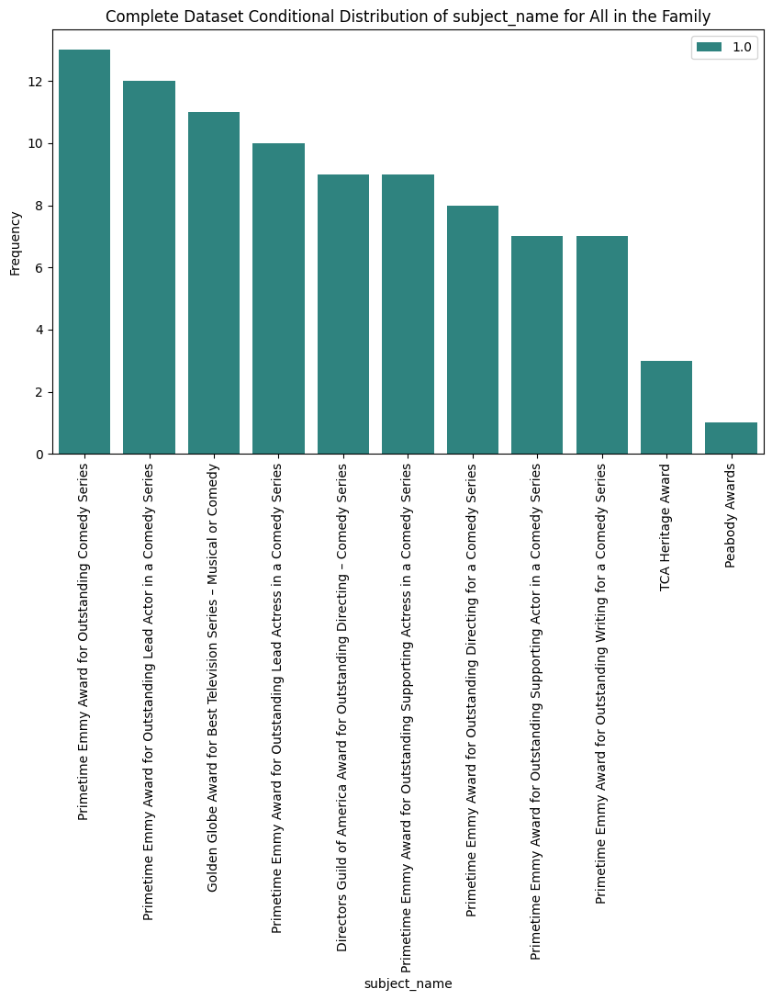

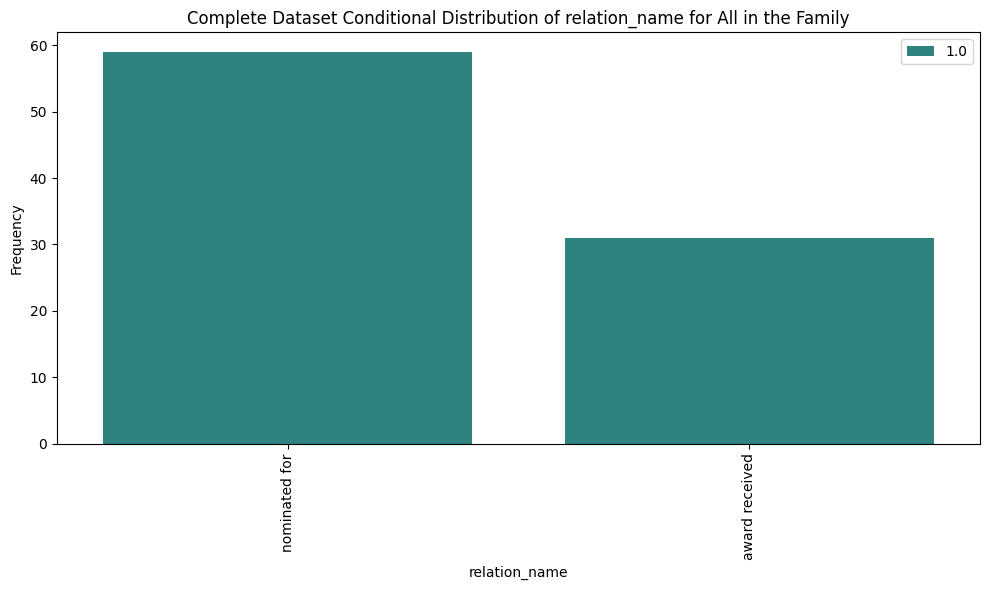

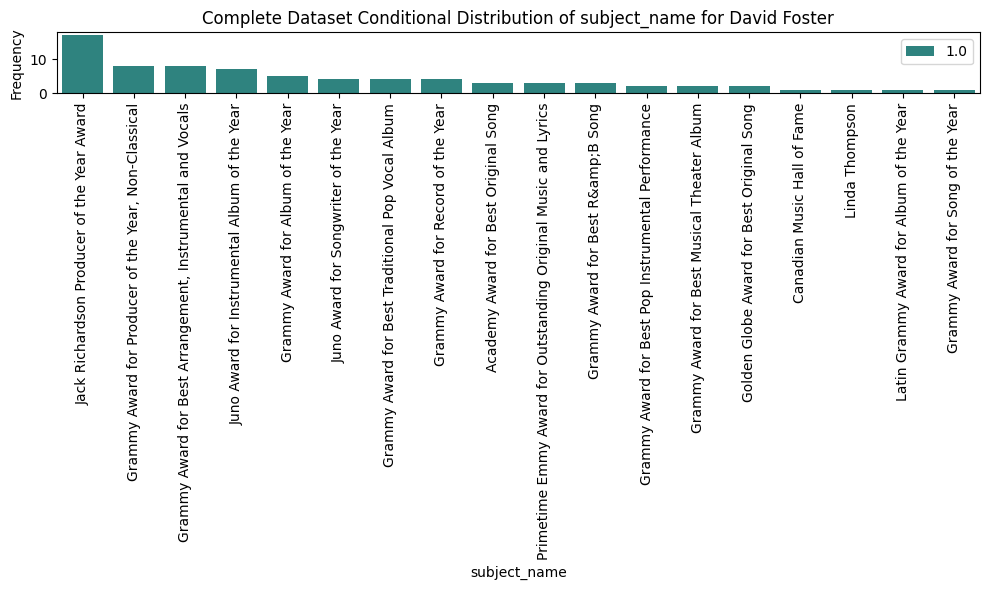

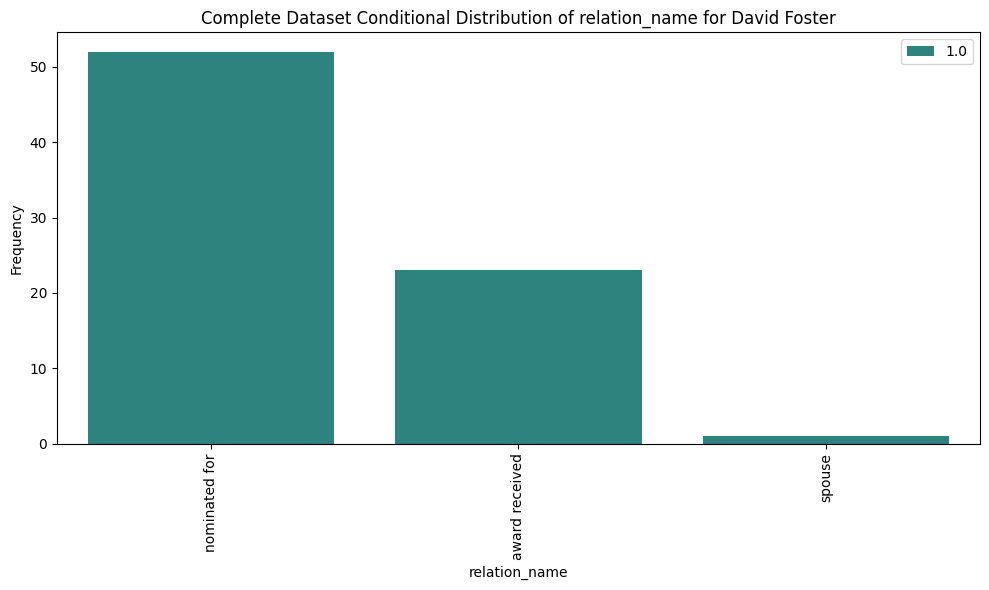

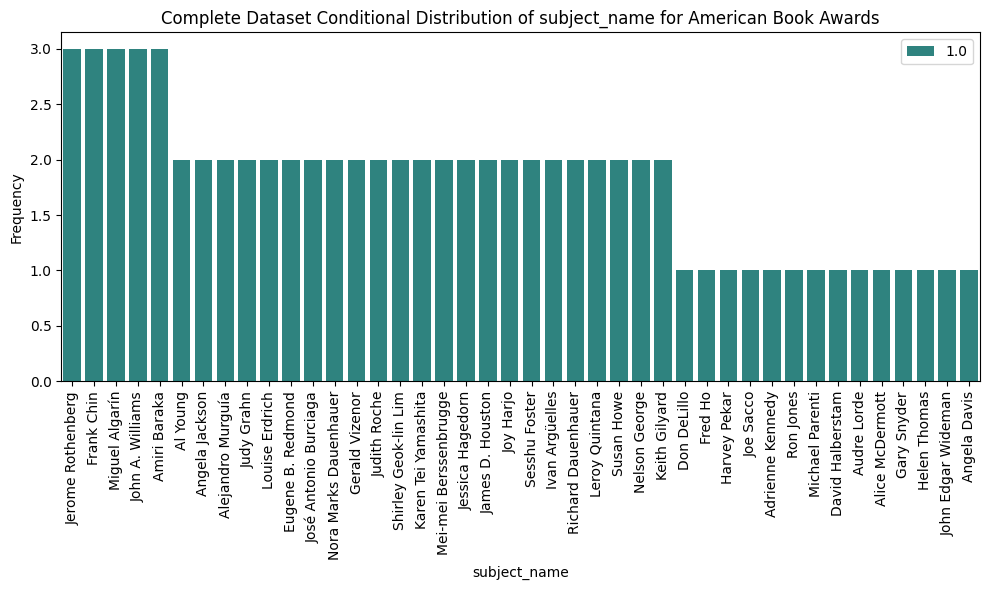

...

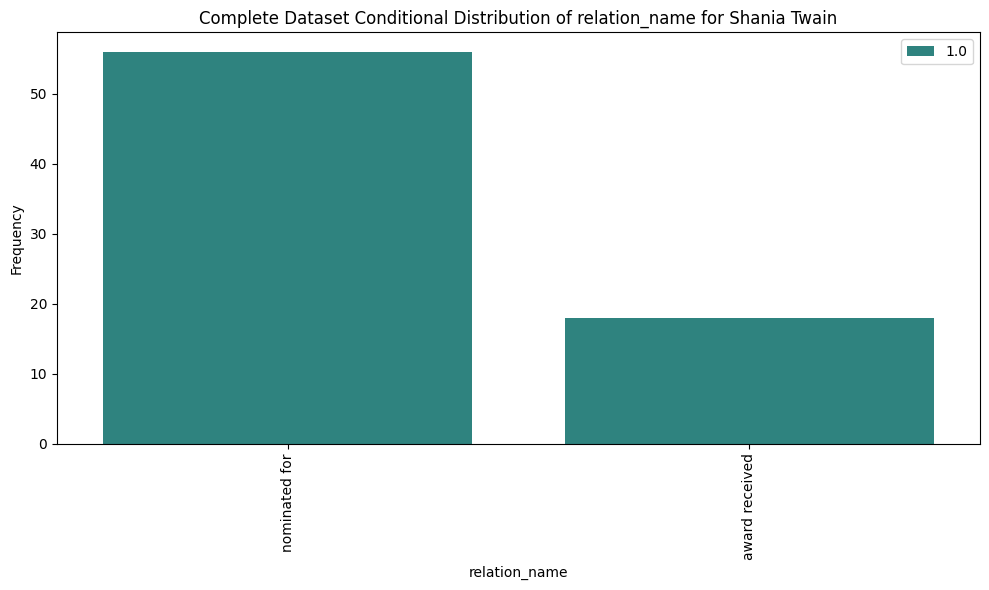

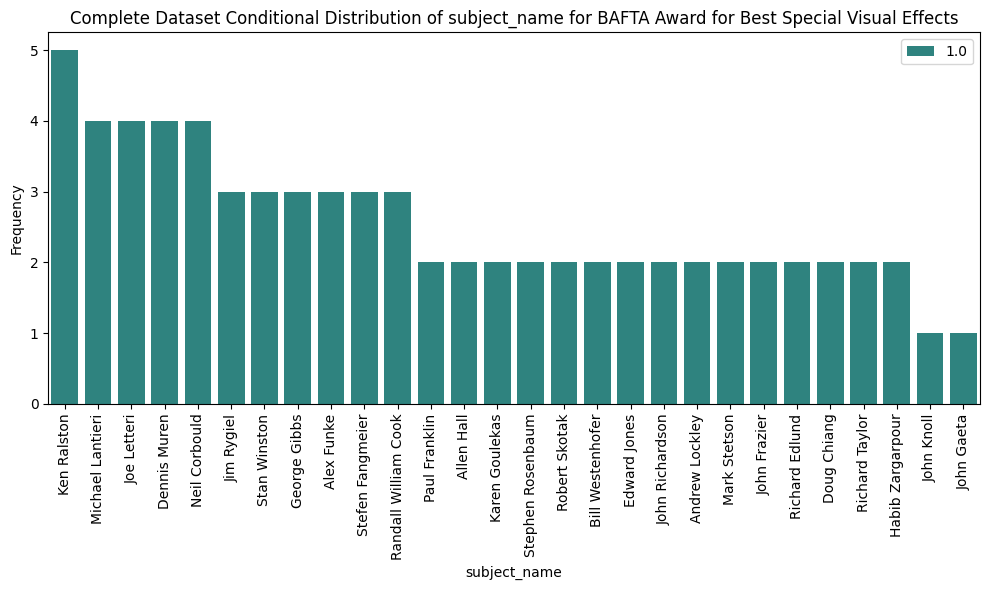

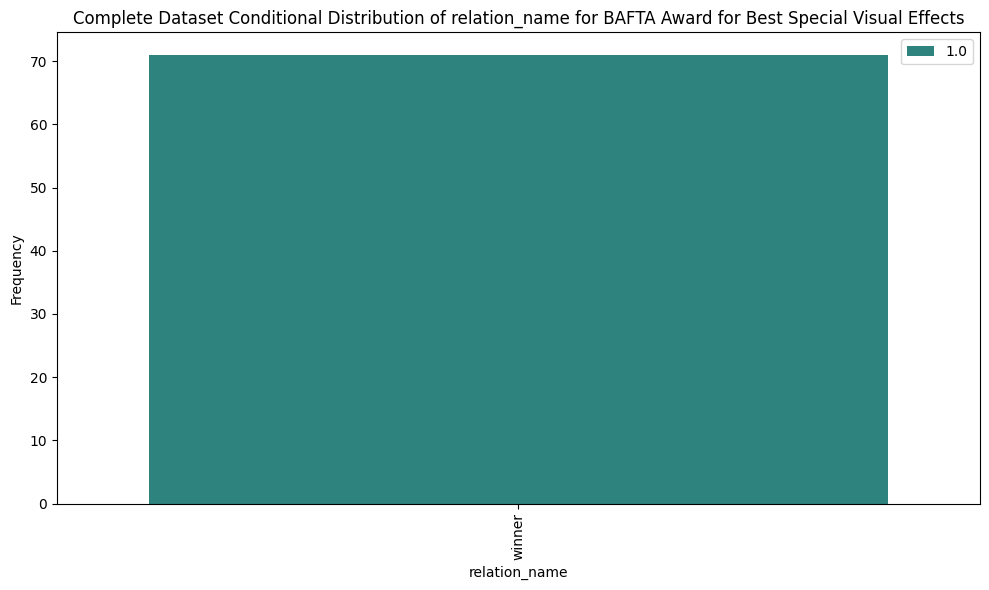

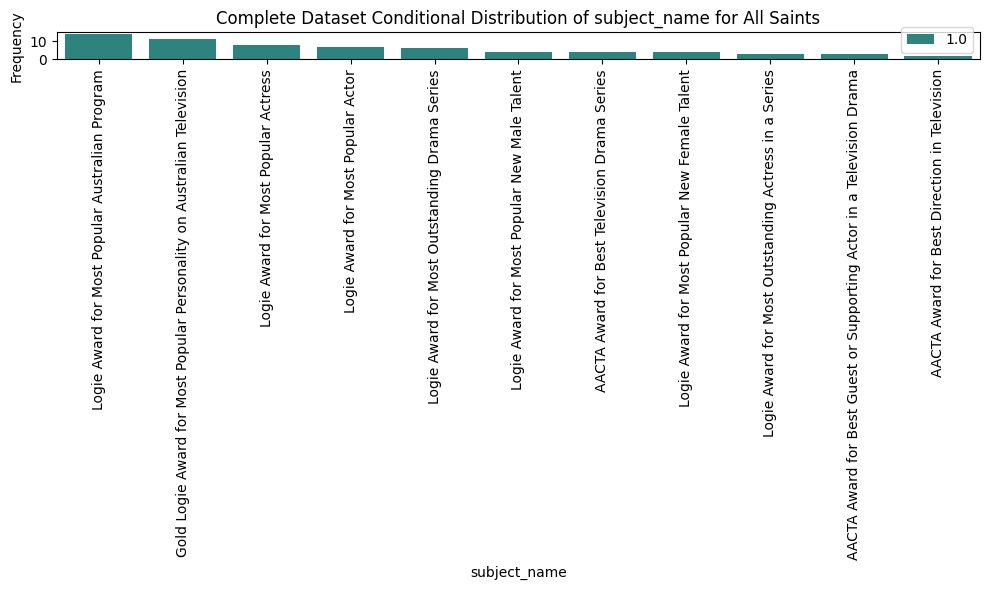

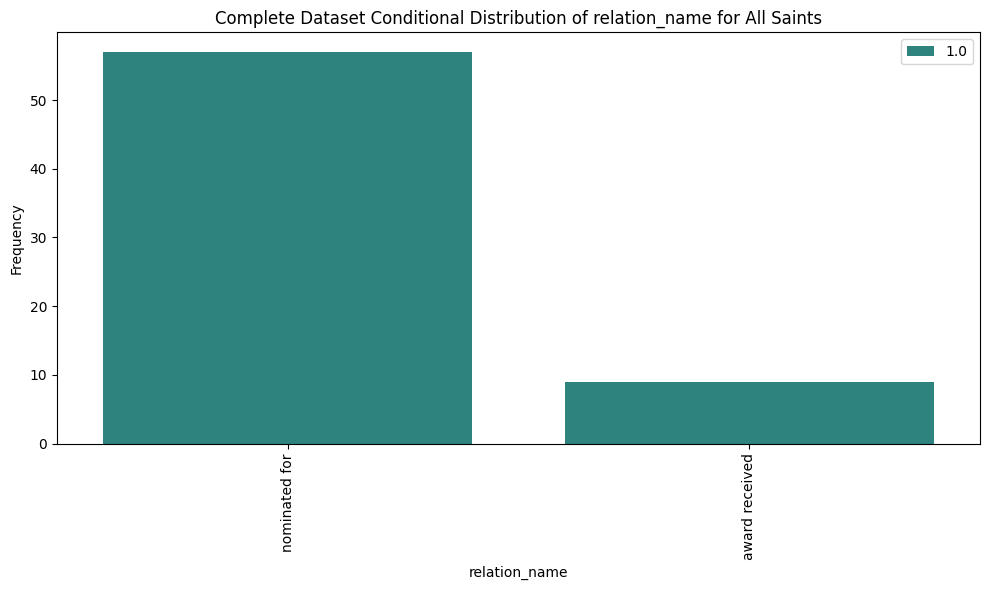

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


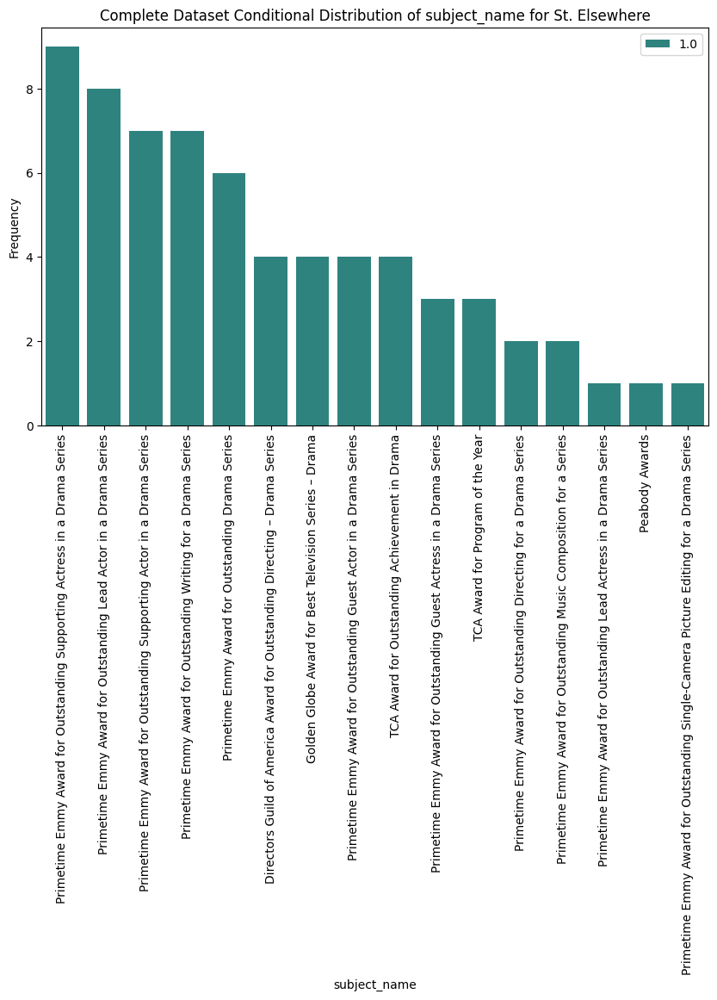

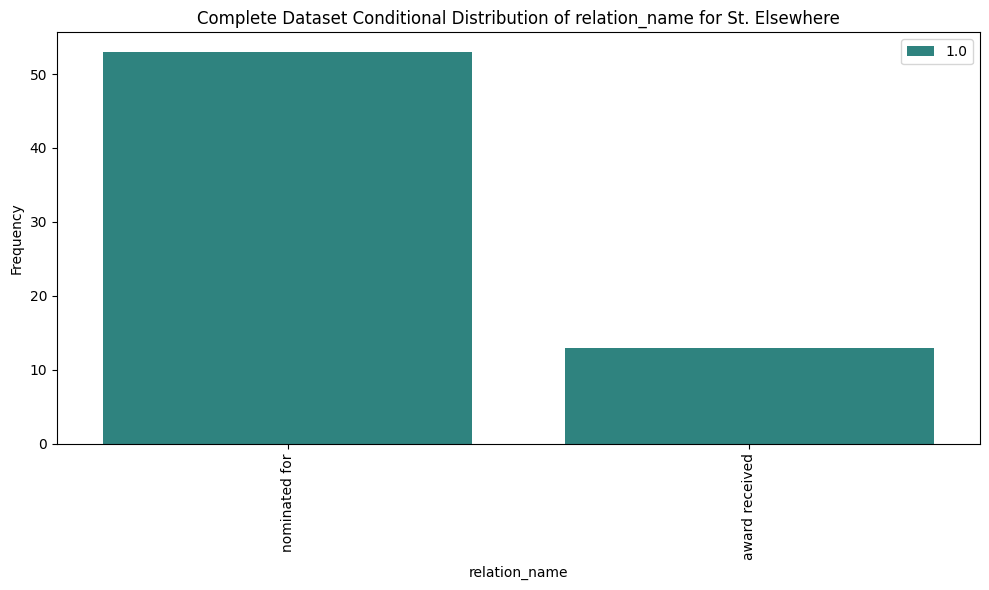

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


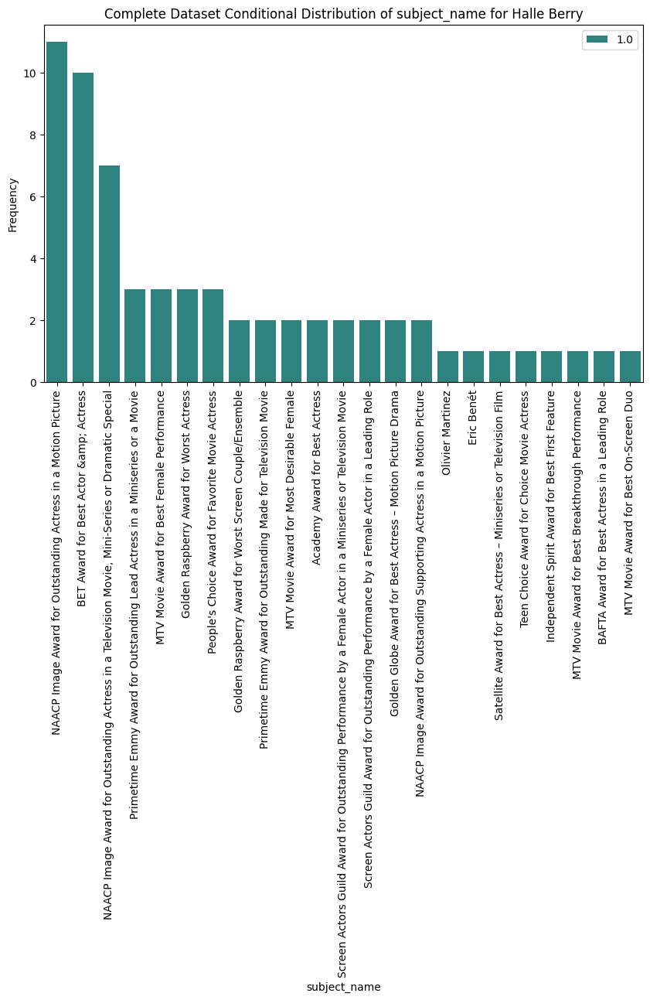

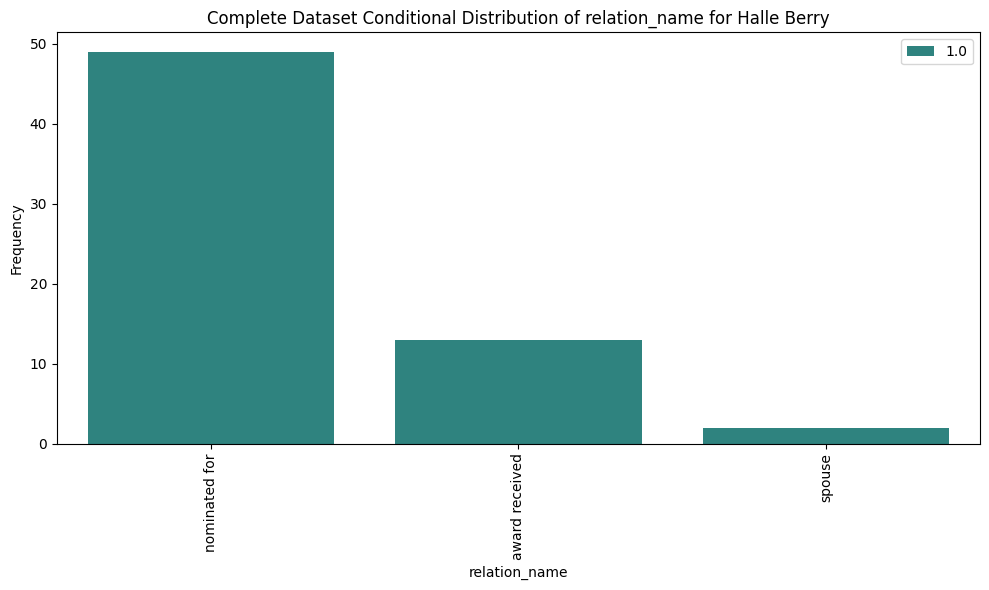

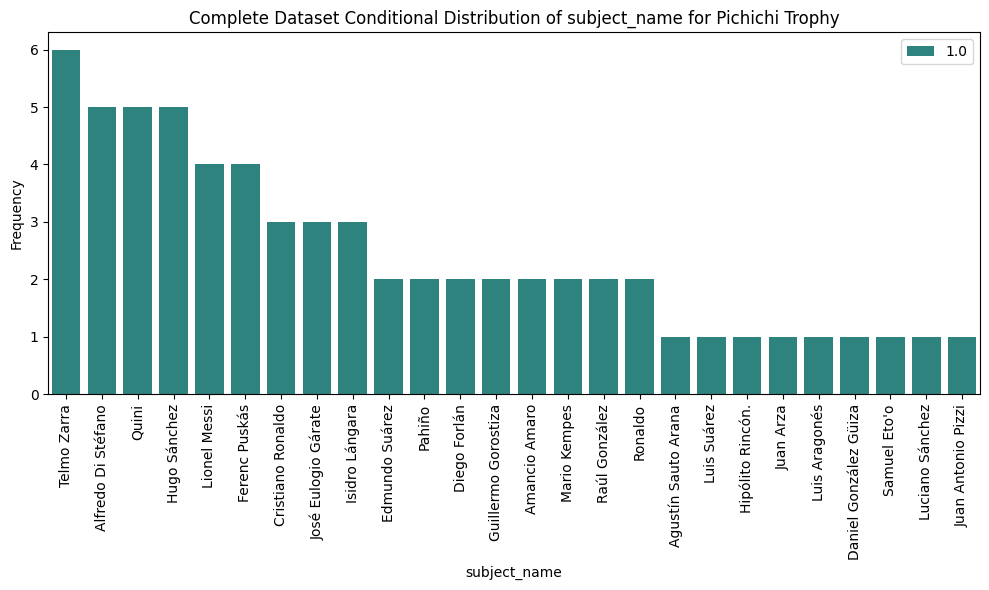

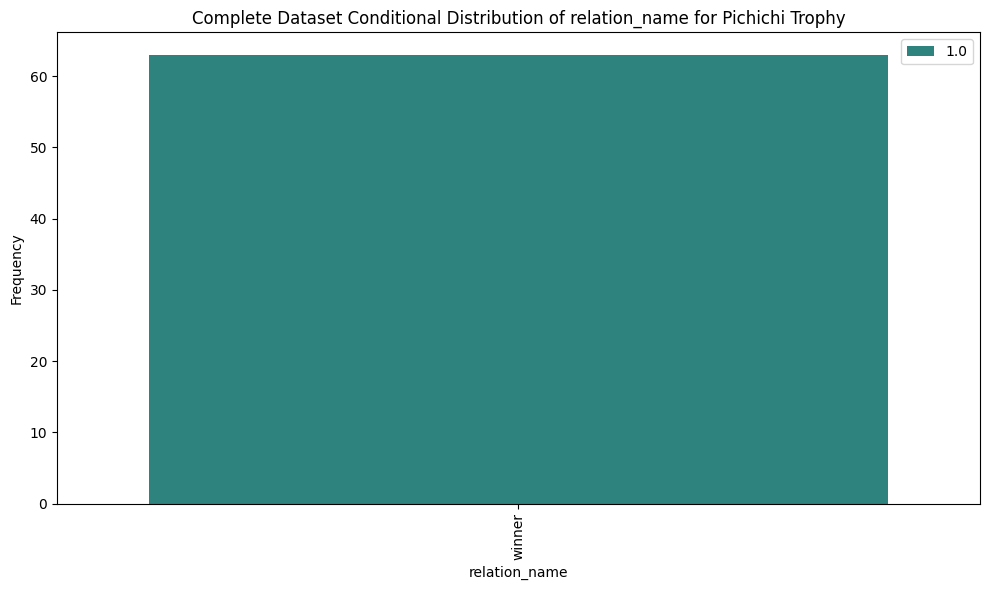

In [34]:
duplicate_values = find_duplicates(total_inductive, 'object_name', min_occurences=60)

duplicate_values = list(duplicate_values)
for val in duplicate_values:
    plot_conditional_distribution(total_inductive, 'object_name', val, 'subject_name', dataset_name="Complete Dataset")
    plot_conditional_distribution(total_inductive, 'object_name', val, 'relation_name', dataset_name="Complete Dataset")

### Transductive

### YAGO11K

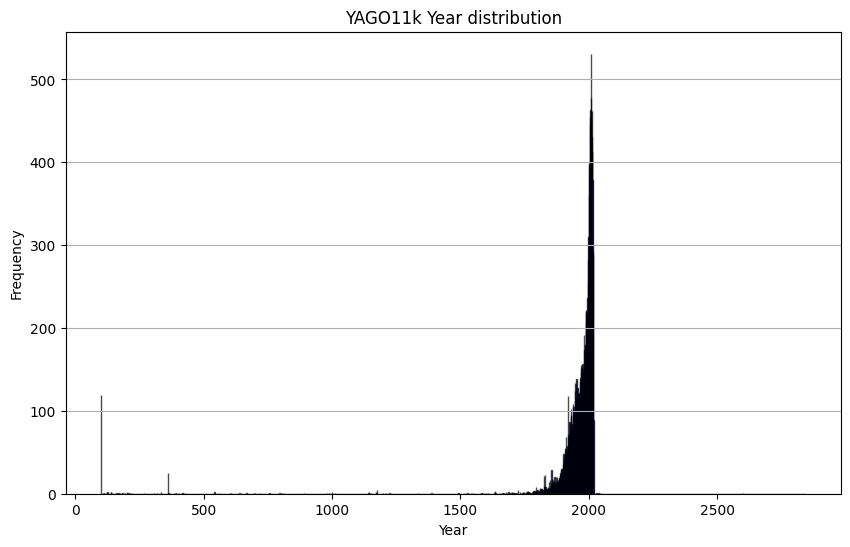

In [35]:
plot_year_distribution(yago, "relation_start_date", title="YAGO11k Year distribution")

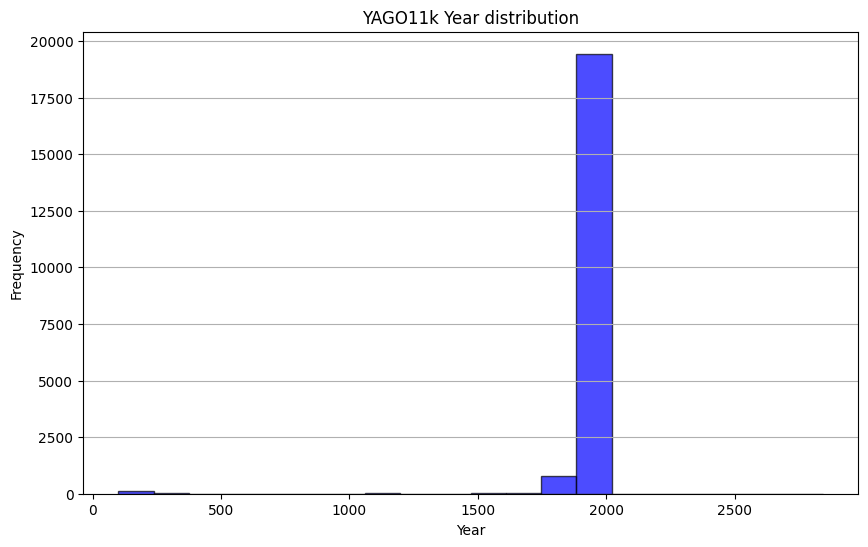

In [36]:
plot_year_distribution_bins(yago, "relation_start_date", title="YAGO11k Year distribution", bins=20)

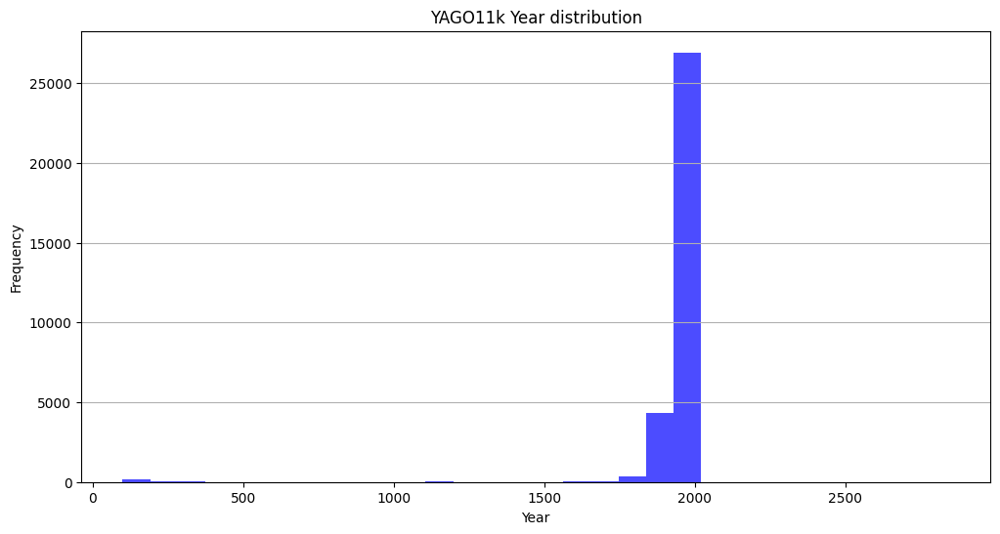

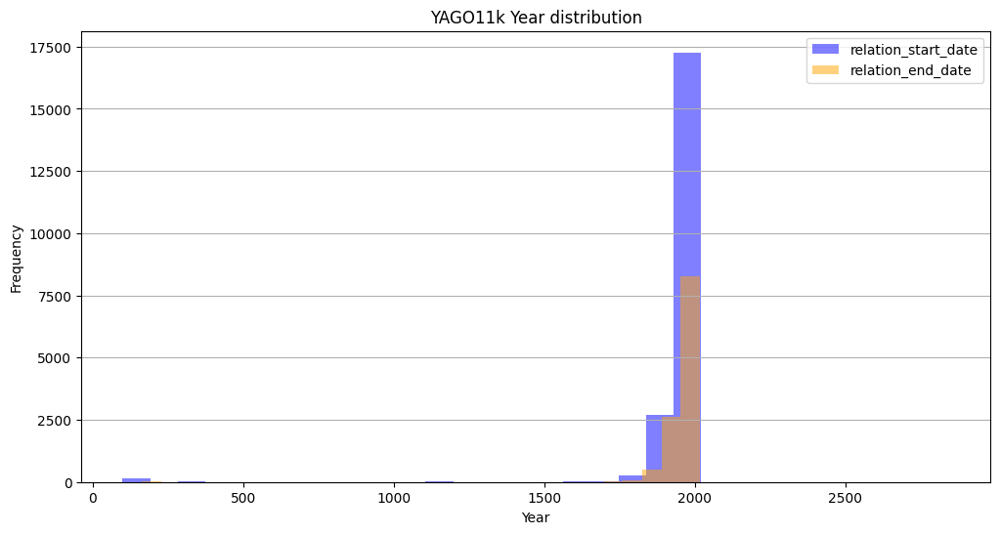

In [37]:
plot_year_distributions(yago, "relation_start_date", "relation_end_date", title="YAGO11k Year distribution")

greatest number of occurences: 26
smallest number of occurences: 1


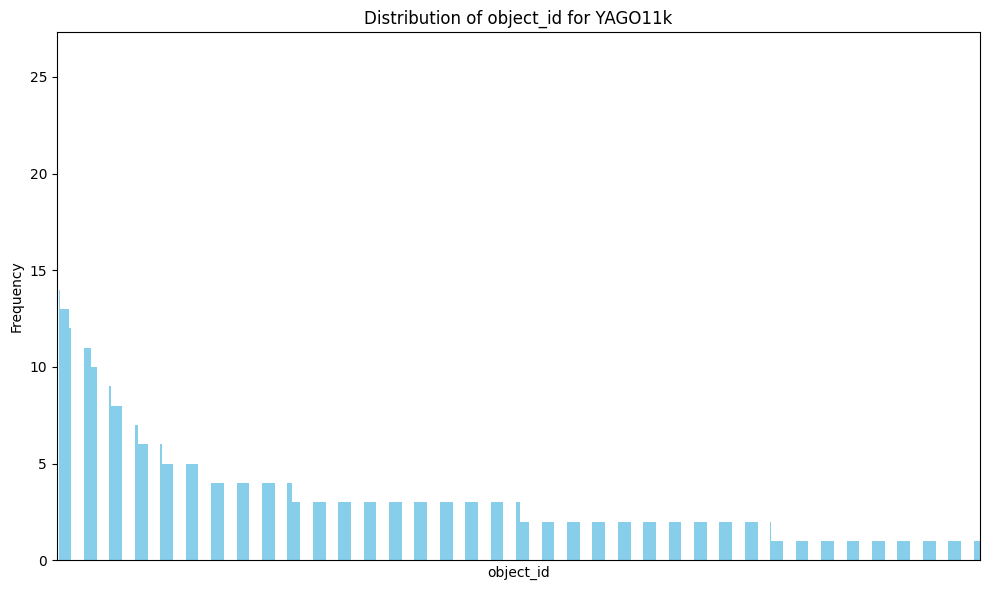

greatest number of occurences: 347
smallest number of occurences: 1


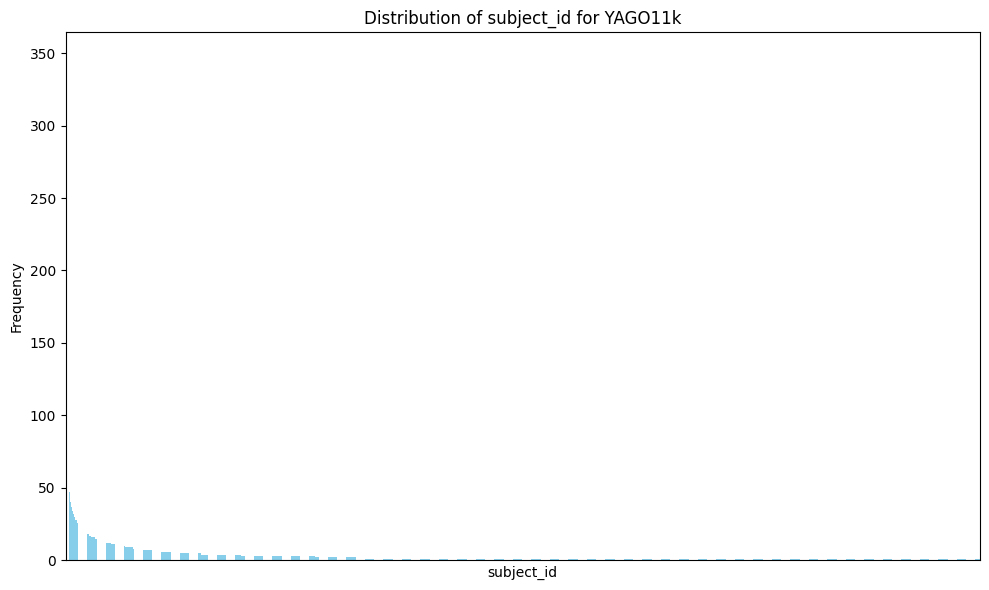

greatest number of occurences: 4787
smallest number of occurences: 408


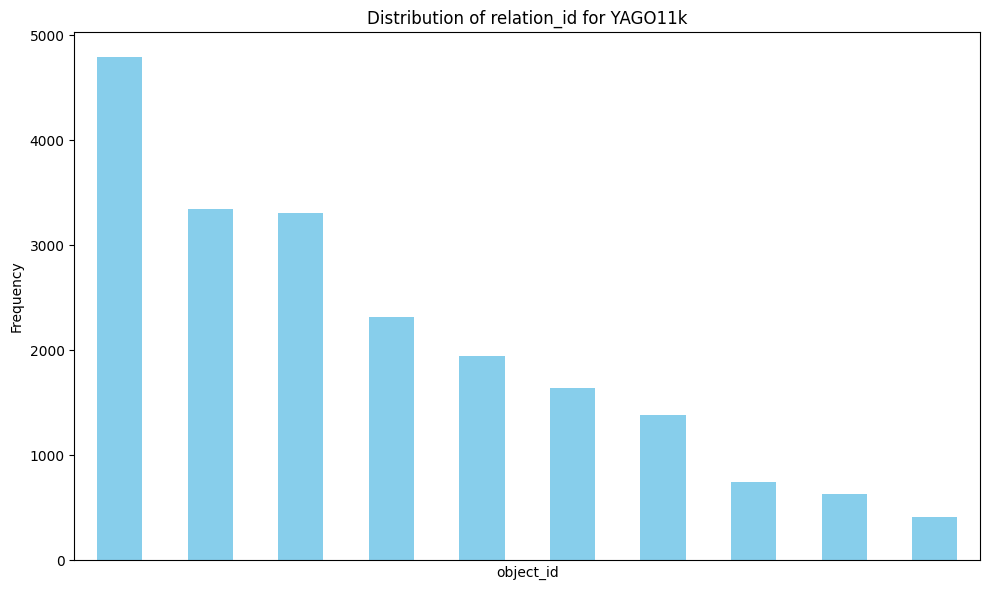

In [38]:
plot_value_counts(yago, "object_id", title="Distribution of object_id for YAGO11k", x_label="object_id", y_label="Frequency")
plot_value_counts(yago, "subject_id", title="Distribution of subject_id for YAGO11k", x_label="subject_id", y_label="Frequency")
plot_value_counts(yago, "subject_relation_id", title="Distribution of relation_id for YAGO11k", x_label="object_id", y_label="Frequency")

In [39]:
analyze_columns("YAGO11K", yago, columns=["object_id", "object_entity_id", "object_name", "subject_id", "subject_num_id", "subject_name", "relation_name", "relation_num_id", "relation_start_date", "relation_end_date"])

Analysis Name: YAGO11K
Analysis for column 'object_id':
  - Number of unique values: 6498
  - Most common value: '6546' with 26 occurrences
  - Least common value: '6464' with 1 occurrence(s)

Analysis for column 'object_entity_id':
  - Number of unique values: 6498
  - Most common value: '<Southern_Region_of_British_Railways>' with 26 occurrences
  - Least common value: '<Government_of_Canada>' with 1 occurrence(s)

Analysis for column 'object_name':
  - Number of unique values: 6498
  - Most common value: 'Southern Region of British Railways' with 26 occurrences
  - Least common value: 'Government of Canada' with 1 occurrence(s)

Analysis for column 'subject_id':
  - Number of unique values: 6351
  - Most common value: '139' with 347 occurrences
  - Least common value: '6274' with 1 occurrence(s)

Analysis for column 'subject_num_id':
  - Number of unique values: 6351
  - Most common value: '139' with 347 occurrences
  - Least common value: '6274' with 1 occurrence(s)

Analysis for c

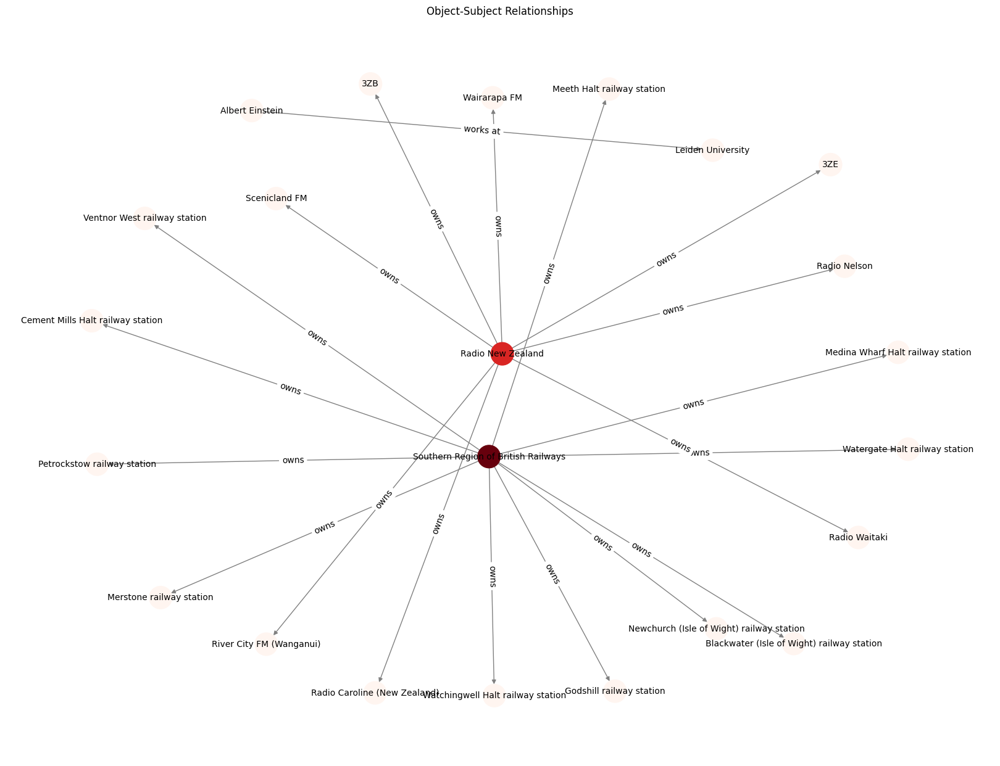

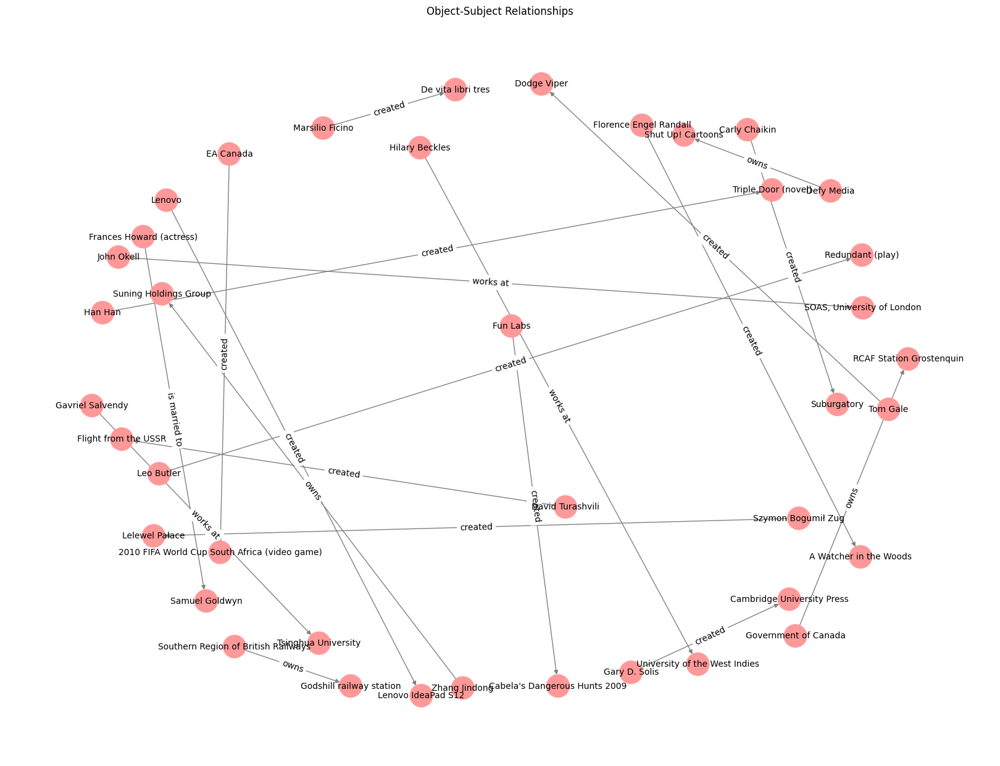

In [40]:
top_15_df = extract_top_n_common(yago, "object_name", n=5)
visualize_relationships(top_15_df.head(20), 'object_name', 'relation_name', 'subject_name')
visualize_relationships(yago.head(20), 'object_name', 'relation_name', 'subject_name')

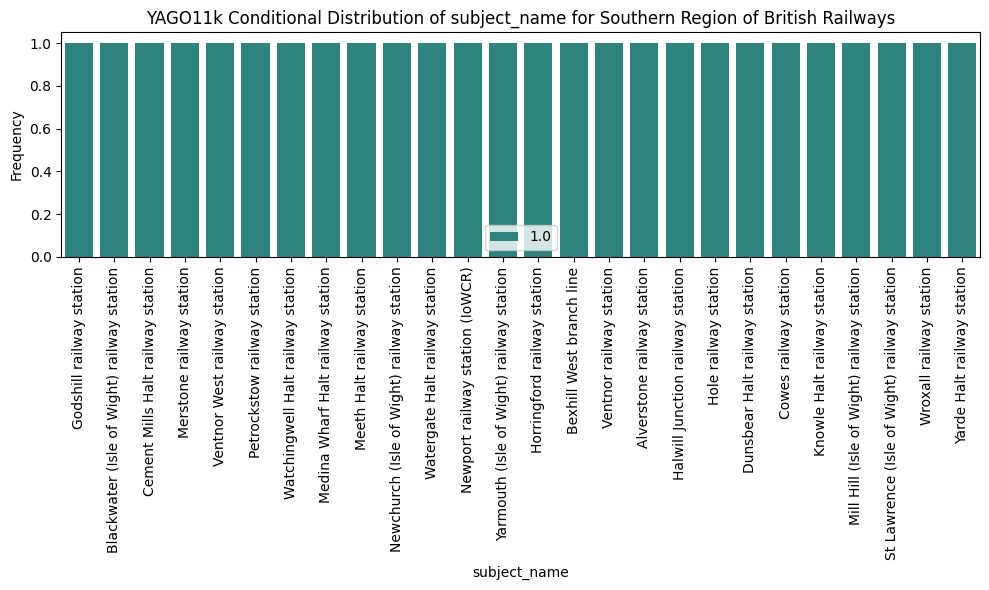

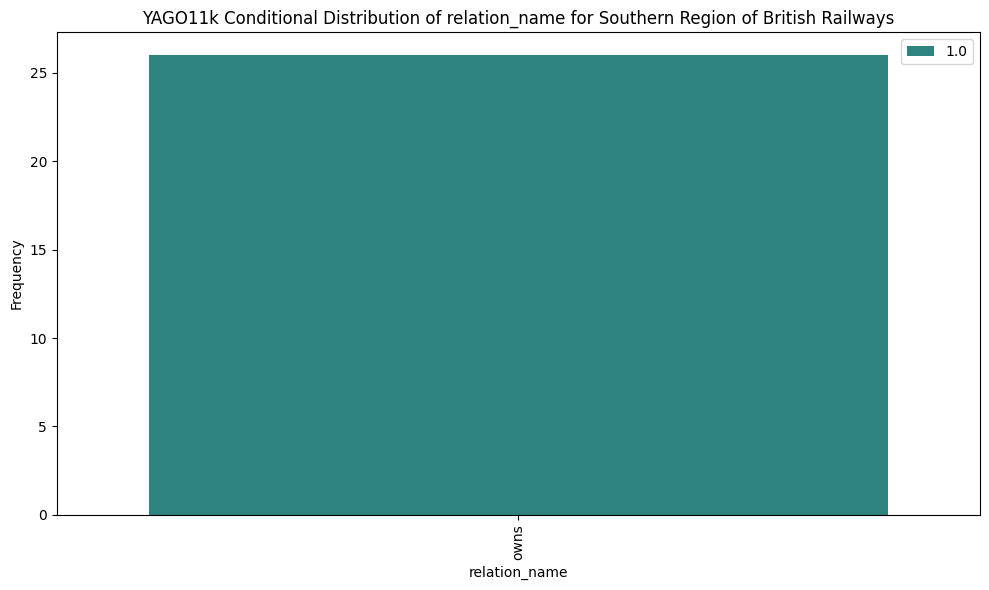

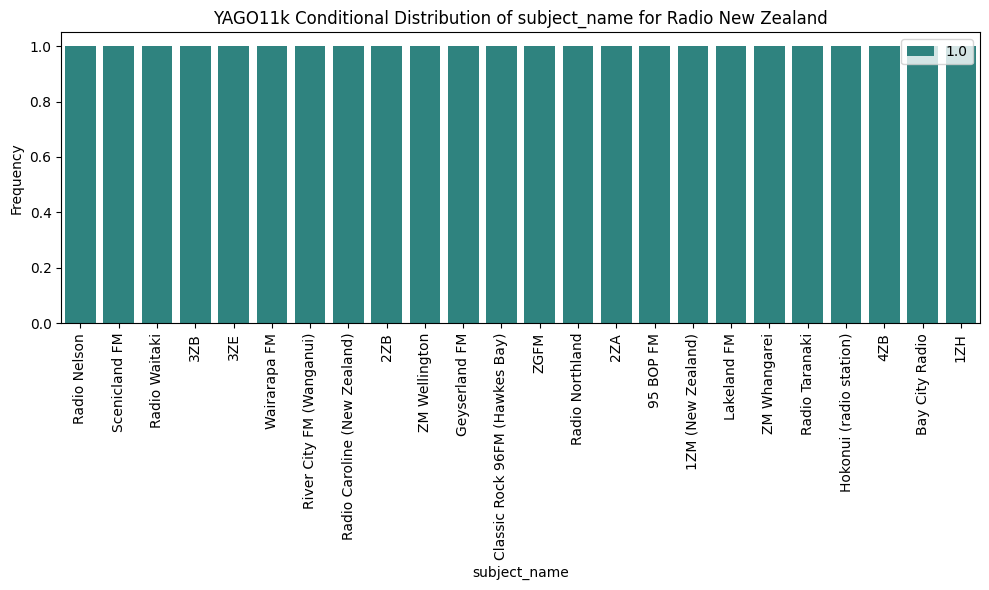

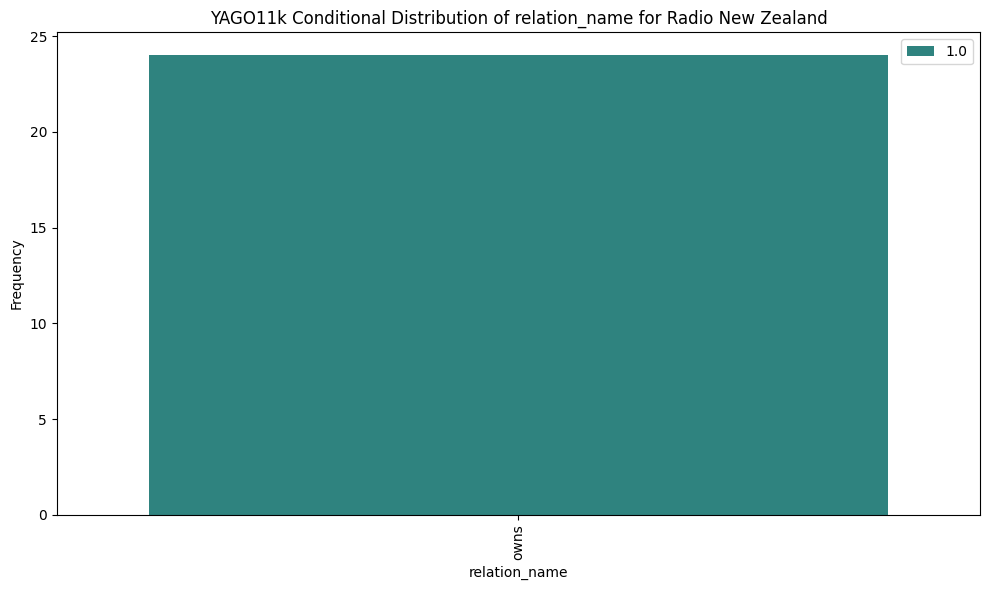

In [41]:
duplicate_values = find_duplicates(yago, 'object_name', min_occurences=20)

duplicate_values = list(duplicate_values)
for val in duplicate_values:
    plot_conditional_distribution(yago, 'object_name', val, 'subject_name', dataset_name="YAGO11k")
    plot_conditional_distribution(yago, 'object_name', val, 'relation_name', dataset_name="YAGO11k")

### WikiData

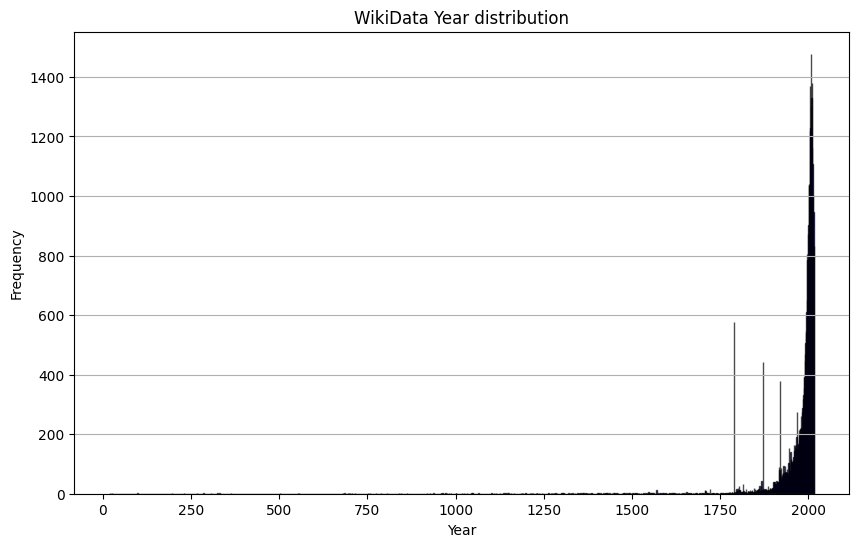

In [42]:
plot_year_distribution(wiki, "start_date", title="WikiData Year distribution")

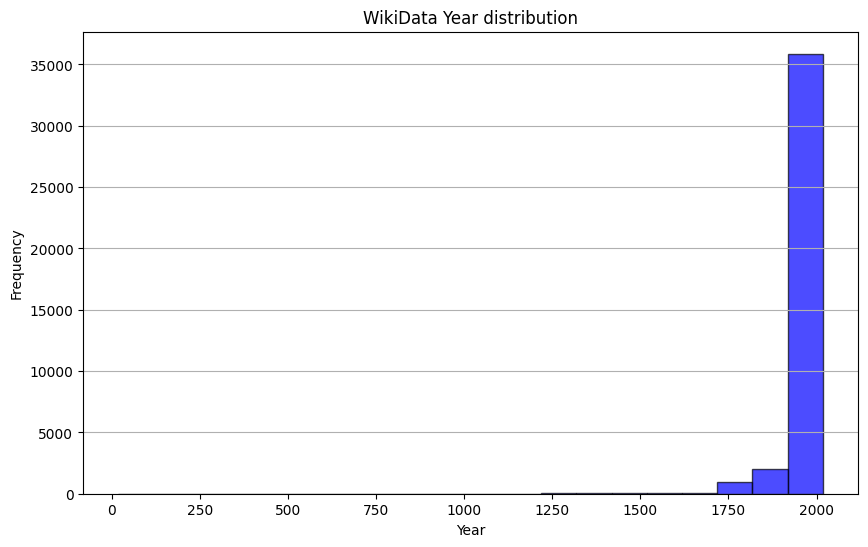

In [43]:
plot_year_distribution_bins(wiki, "start_date", title="WikiData Year distribution", bins=20)

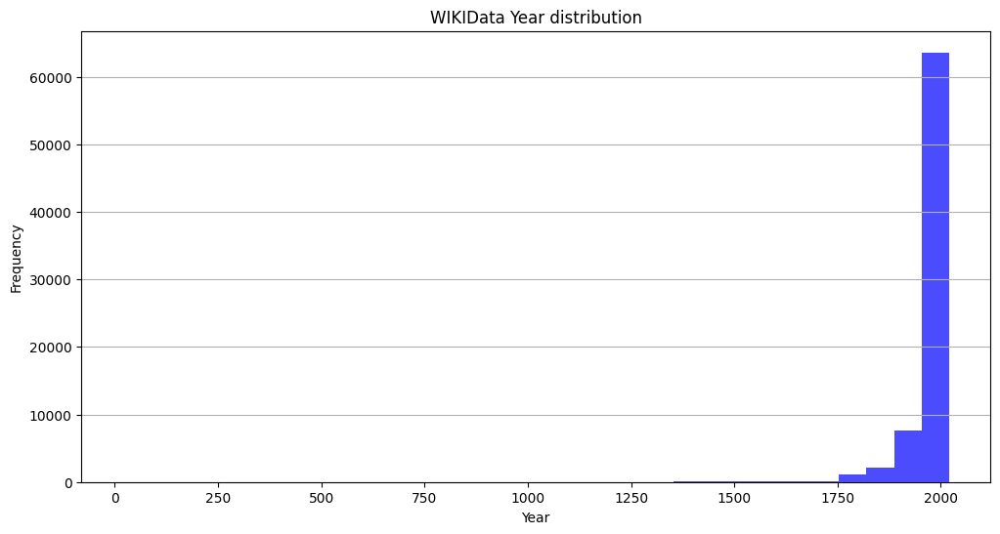

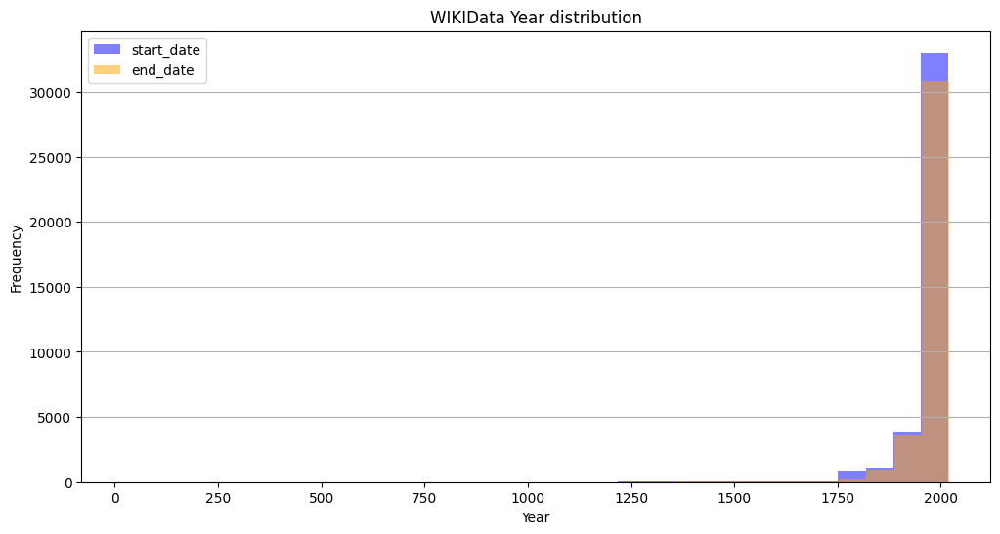

In [44]:
plot_year_distributions(wiki, "start_date", "end_date", title="WIKIData Year distribution")

greatest number of occurences: 187
smallest number of occurences: 1


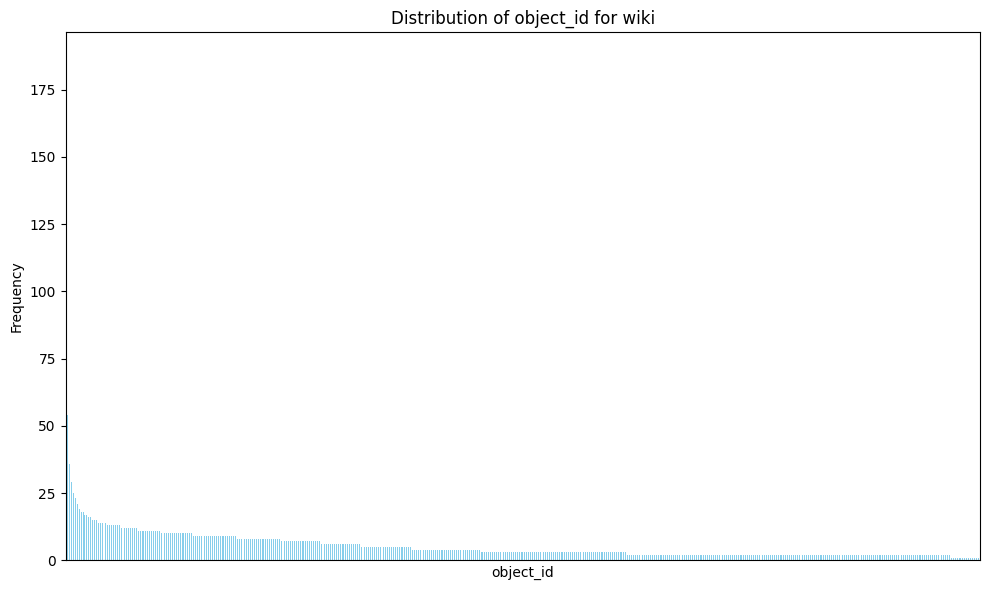

greatest number of occurences: 356
smallest number of occurences: 1


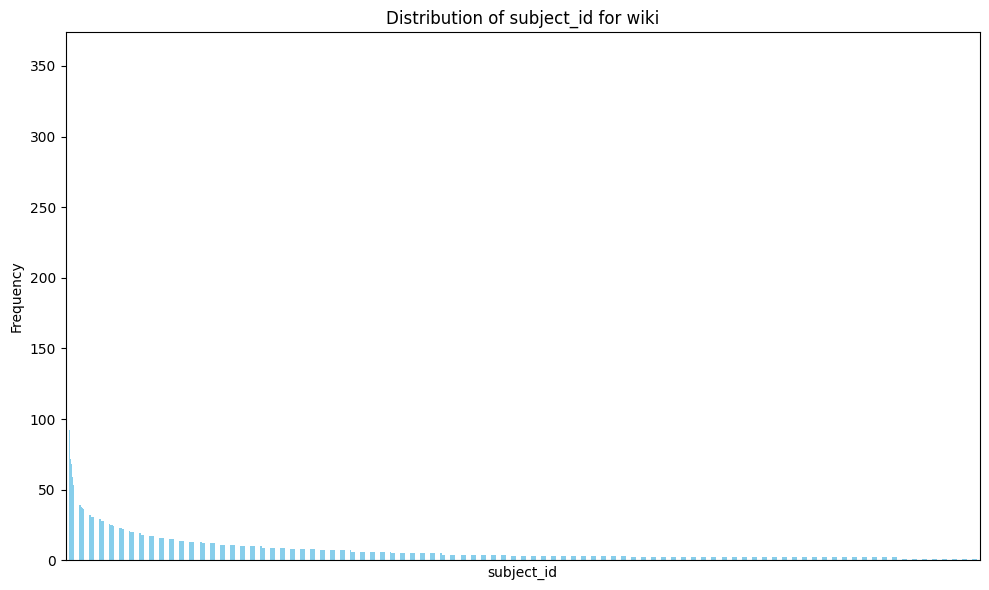

greatest number of occurences: 16090
smallest number of occurences: 80


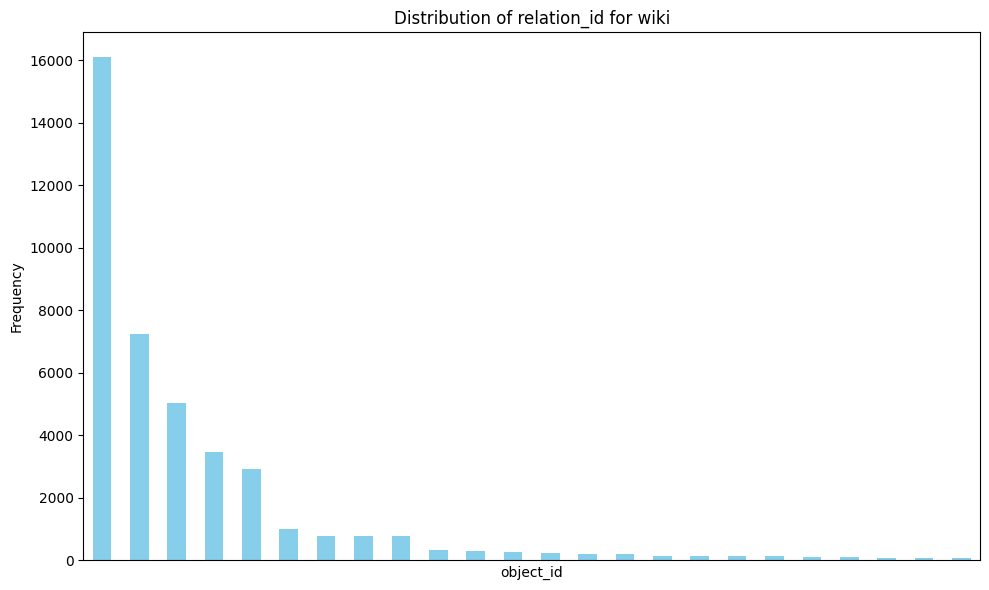

In [45]:
plot_value_counts(wiki, "object_id", title="Distribution of object_id for wiki", x_label="object_id", y_label="Frequency")
plot_value_counts(wiki, "subject_id", title="Distribution of subject_id for wiki", x_label="subject_id", y_label="Frequency")
plot_value_counts(wiki, "subject_relation_id", title="Distribution of relation_id for wiki", x_label="object_id", y_label="Frequency")

In [46]:
analyze_columns("WikiData", wiki, columns=["object_id", "object_entity_id", "object_name", "subject_id", "subject_num_id", "subject_name", "relation_name", "relation_num_id", "start_date", "end_date"])

Analysis Name: WikiData
Analysis for column 'object_id':
  - Number of unique values: 7749
  - Most common value: '6663' with 187 occurrences
  - Least common value: '2347' with 1 occurrence(s)

Analysis for column 'object_entity_id':
  - Number of unique values: 7749
  - Most common value: 'Q23628' with 187 occurrences
  - Least common value: 'Q256531' with 1 occurrence(s)

Analysis for column 'object_name':
  - Number of unique values: 7741
  - Most common value: 'The Sopranos' with 187 occurrences
  - Least common value: 'Kingdom of Scotland' with 1 occurrence(s)

Analysis for column 'subject_id':
  - Number of unique values: 5395
  - Most common value: '7092' with 356 occurrences
  - Least common value: '396' with 1 occurrence(s)

Analysis for column 'subject_num_id':
  - Number of unique values: 5395
  - Most common value: '7092' with 356 occurrences
  - Least common value: '396' with 1 occurrence(s)

Analysis for column 'subject_name':
  - Number of unique values: 5366
  - Most c

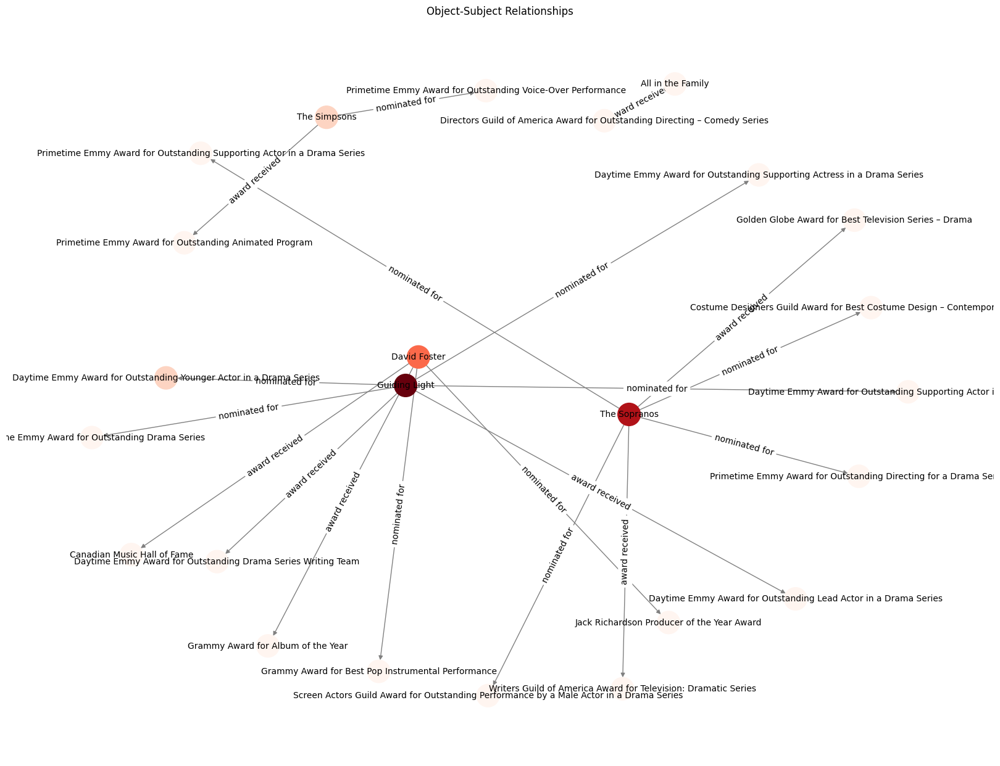

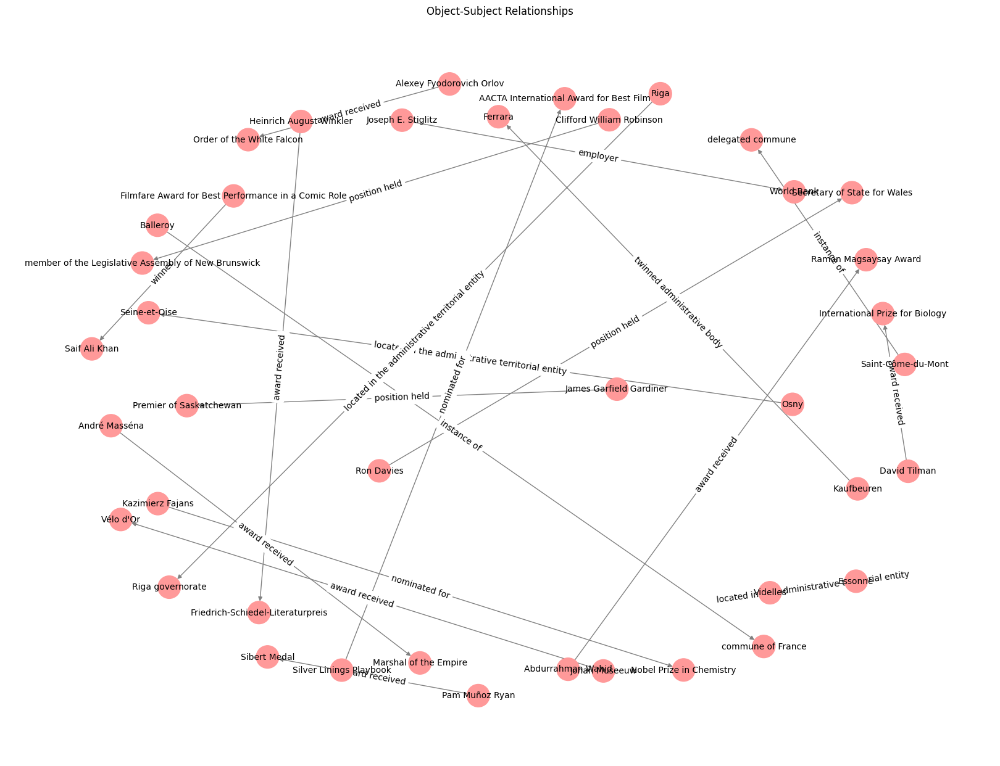

In [47]:
top_15_df = extract_top_n_common(wiki, "object_name", n=5)
visualize_relationships(top_15_df.head(20), 'object_name', 'relation_name', 'subject_name')
visualize_relationships(wiki.head(20), 'object_name', 'relation_name', 'subject_name')

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


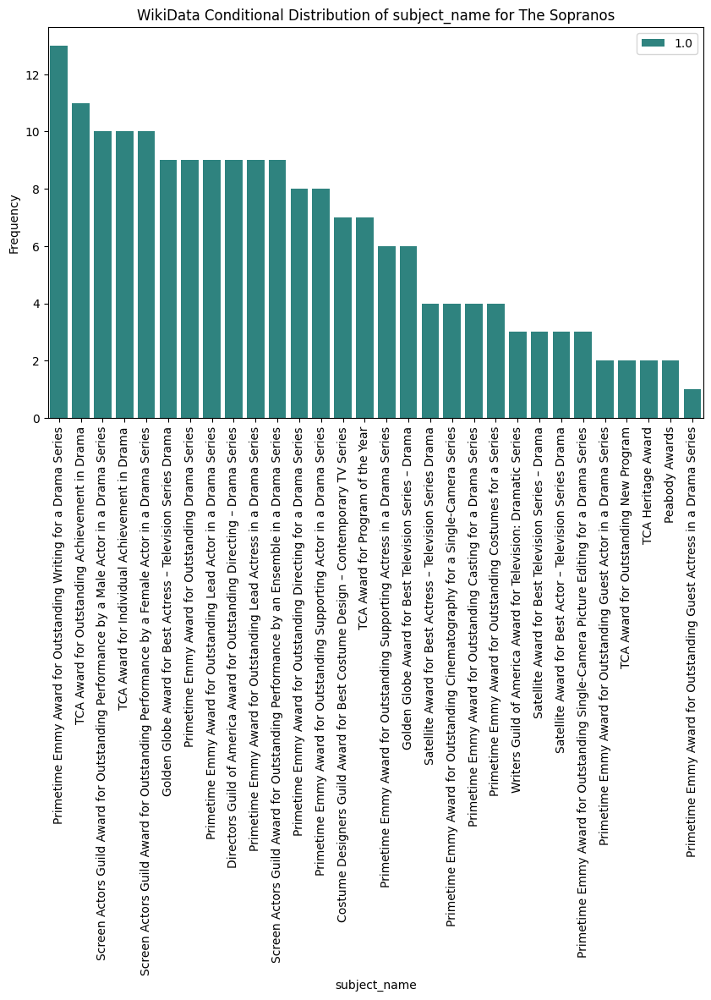

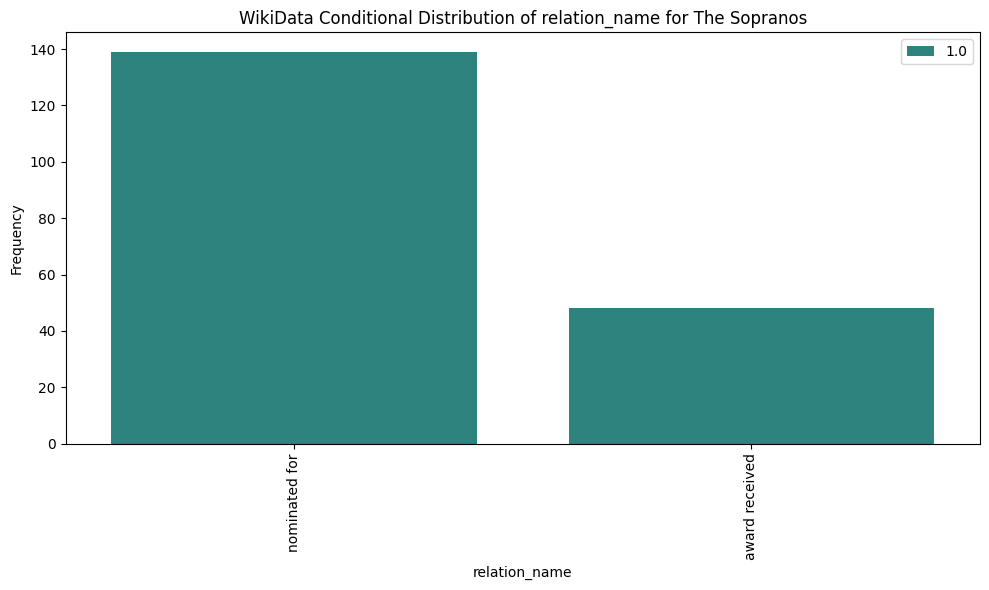

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


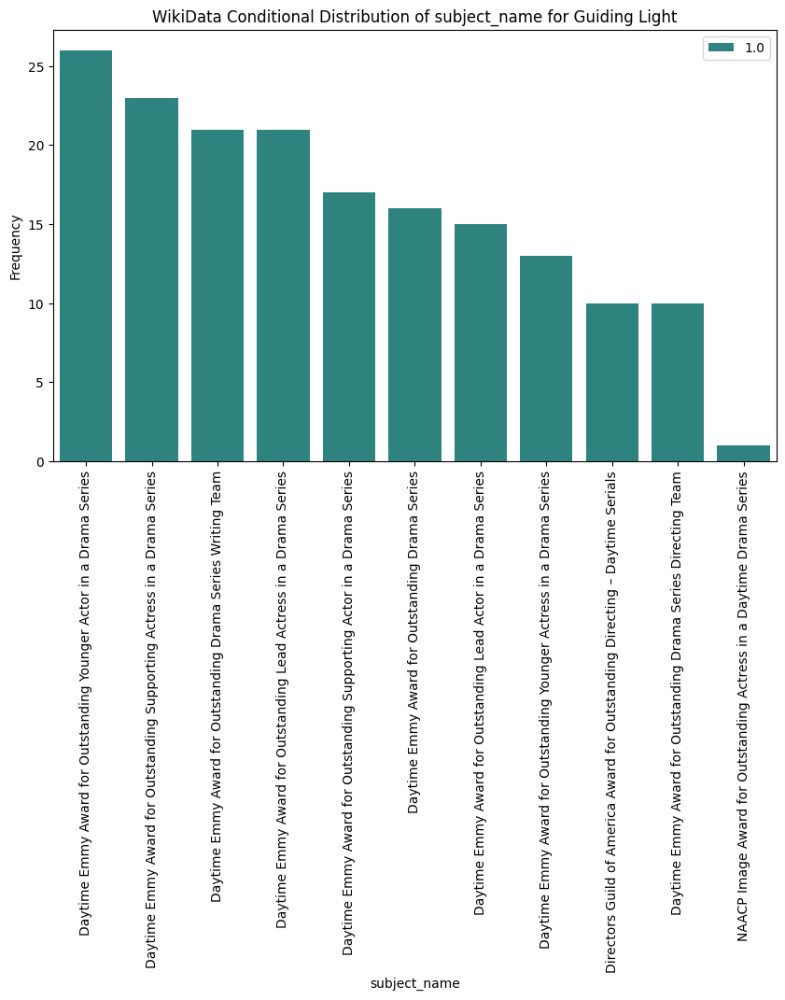

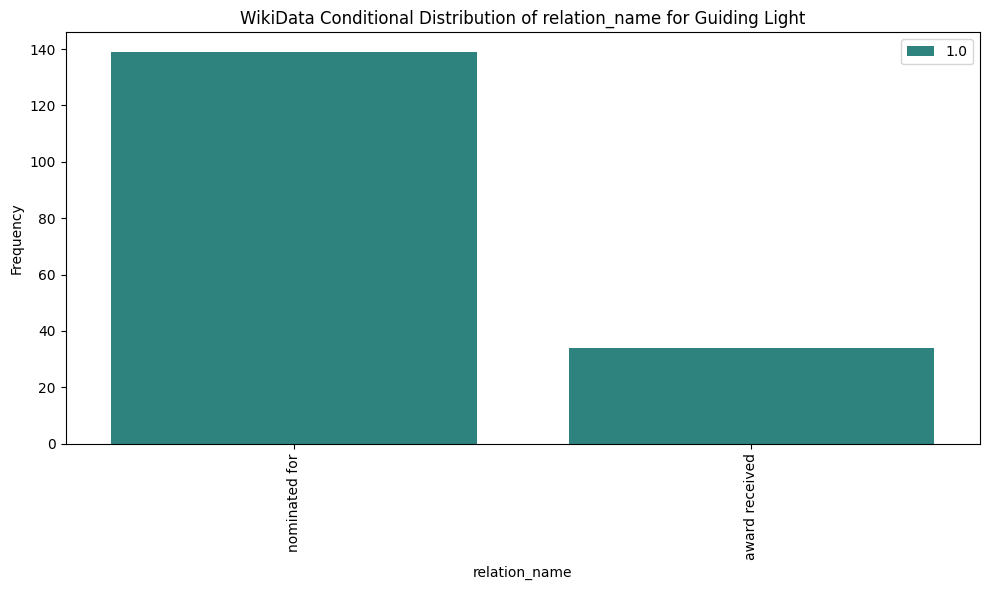

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


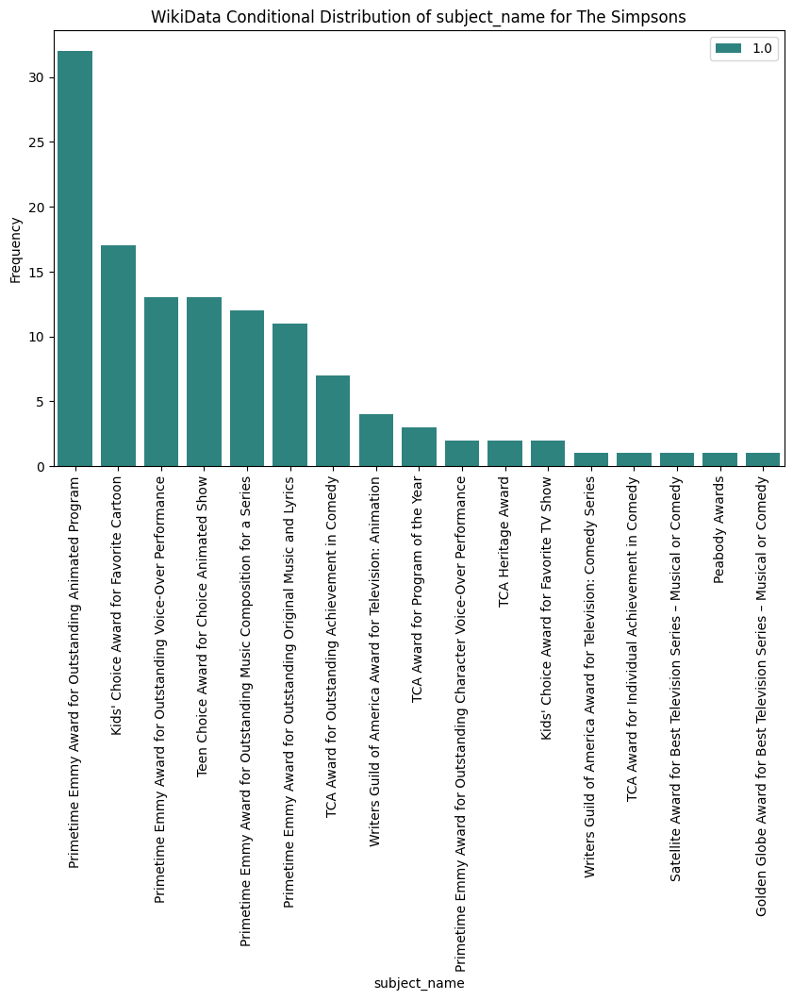

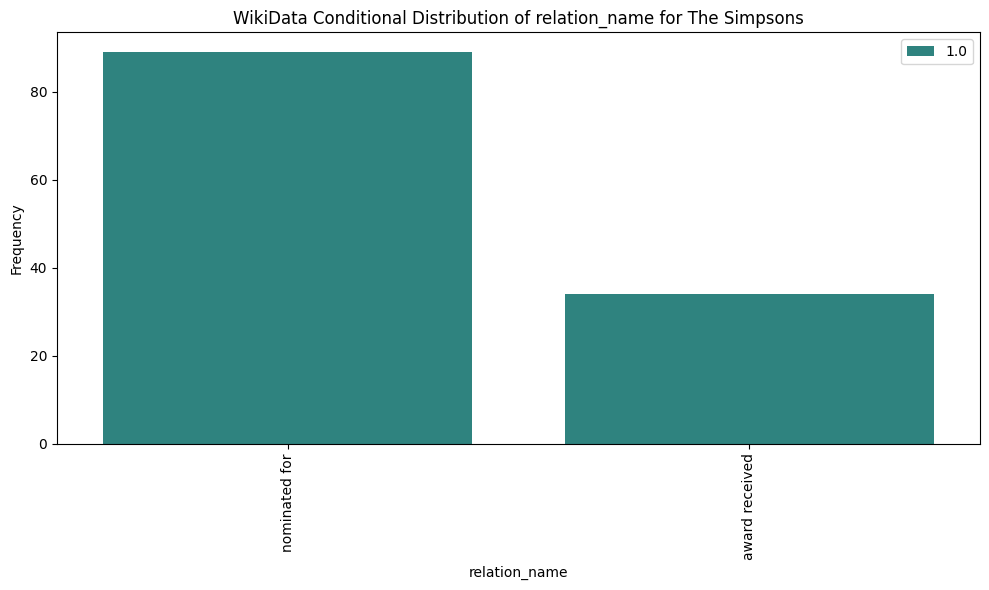

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


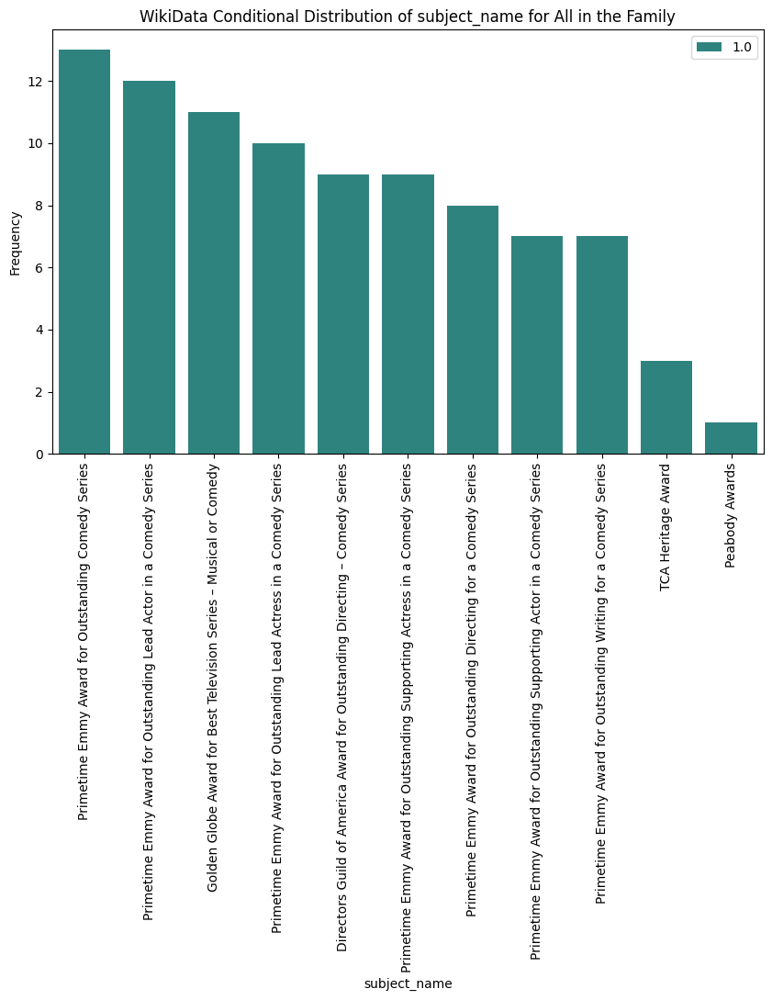

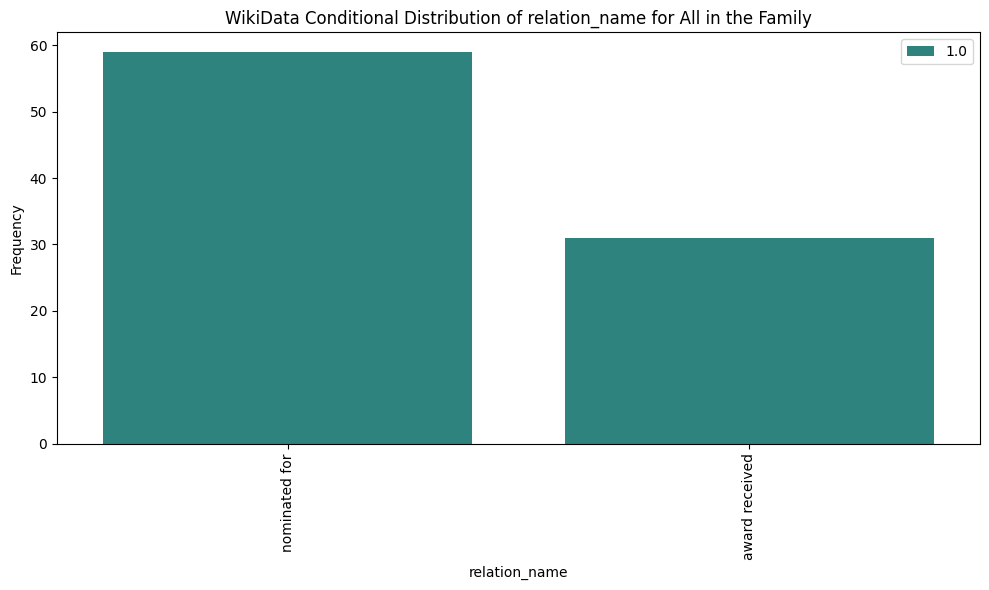

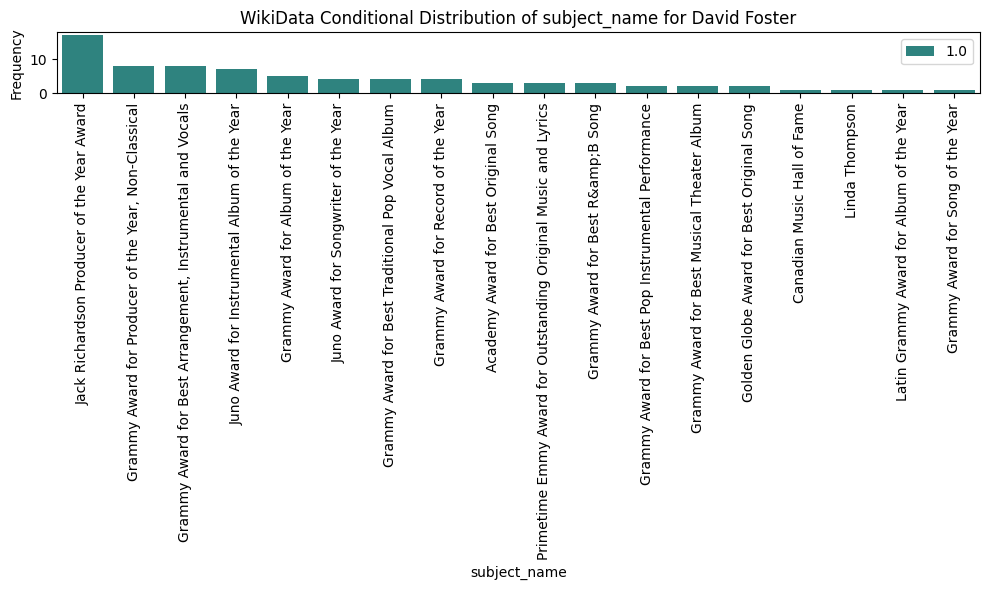

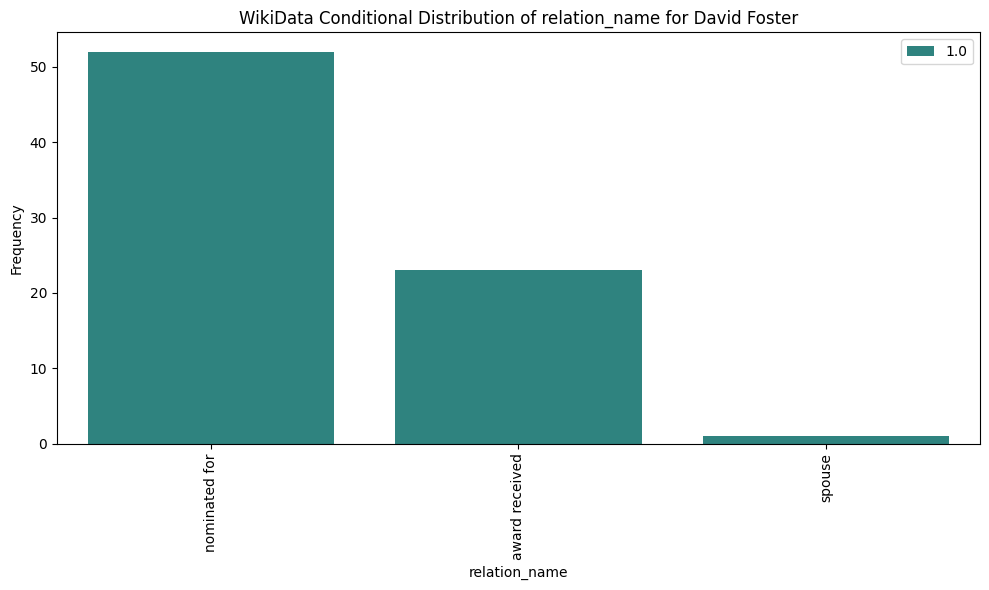

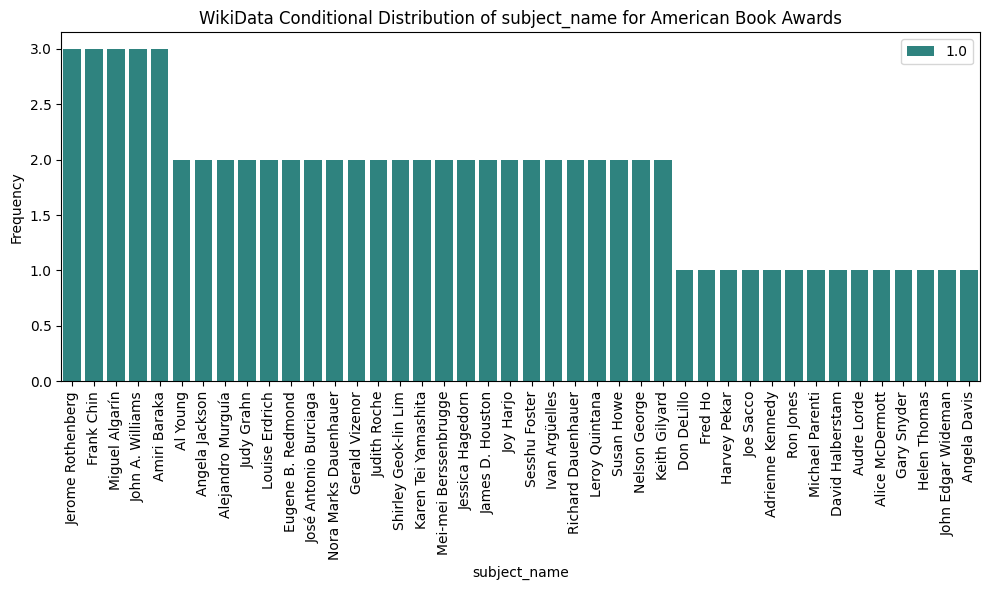

...

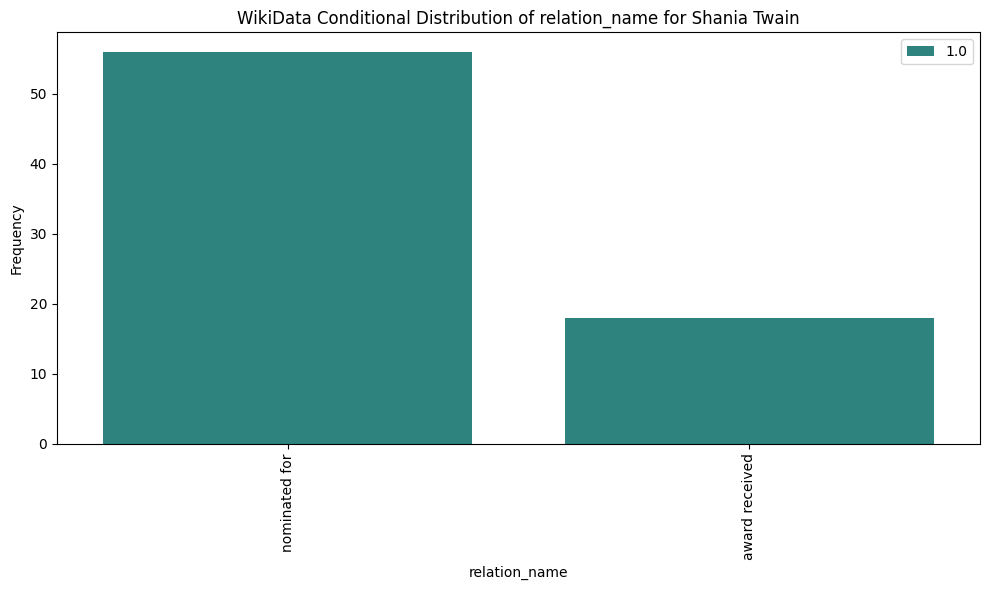

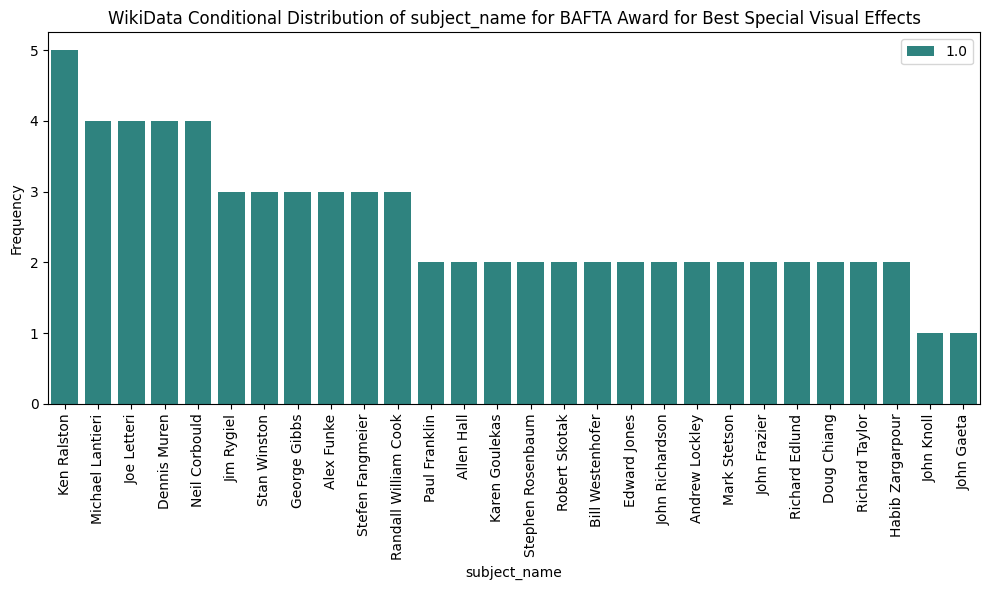

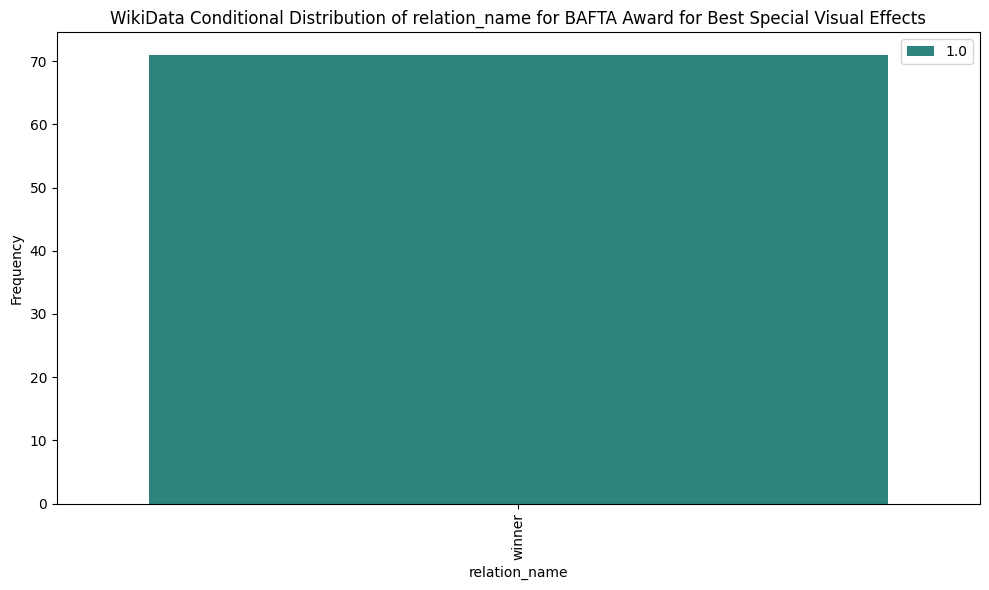

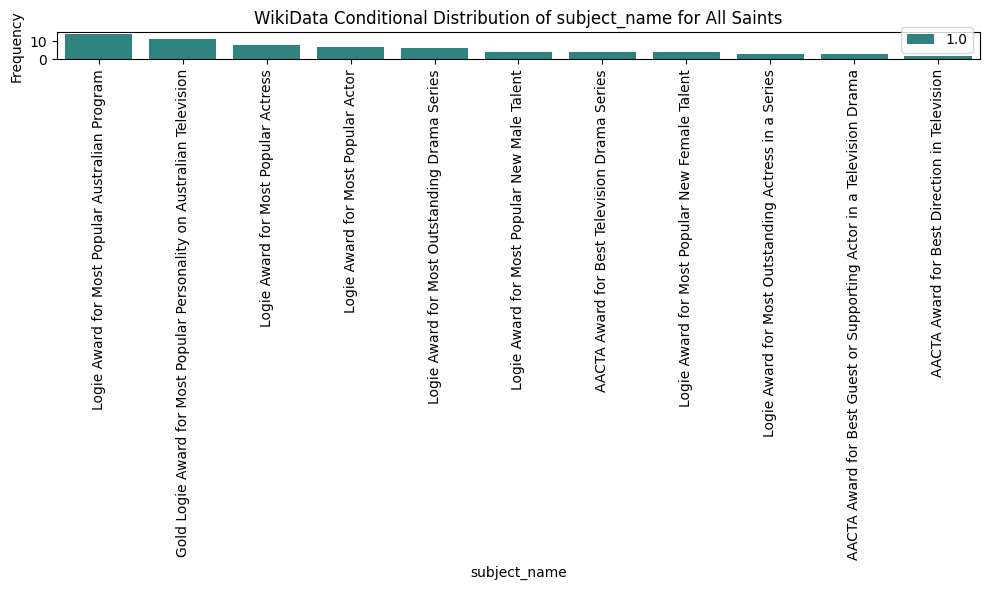

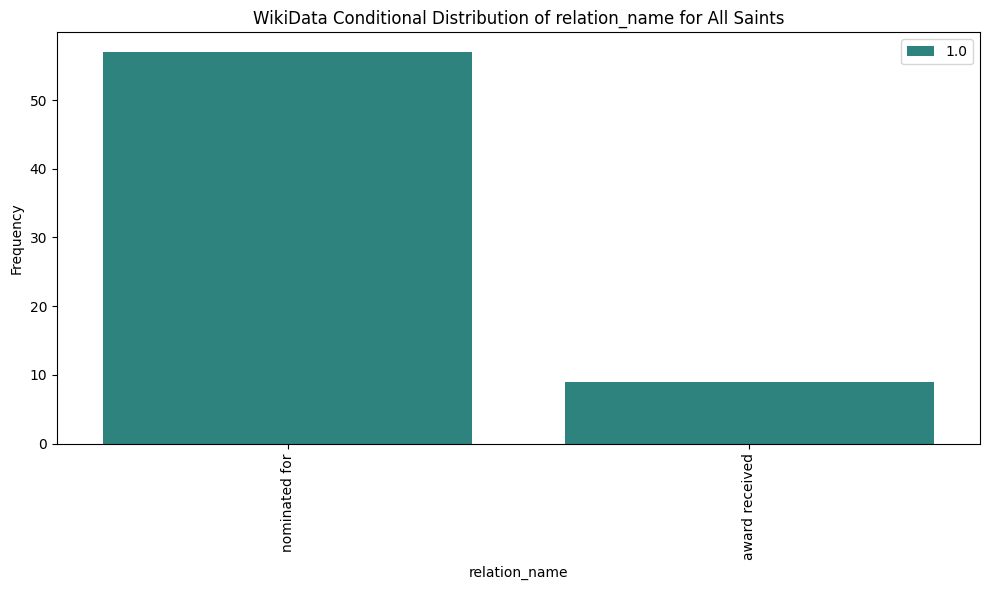

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


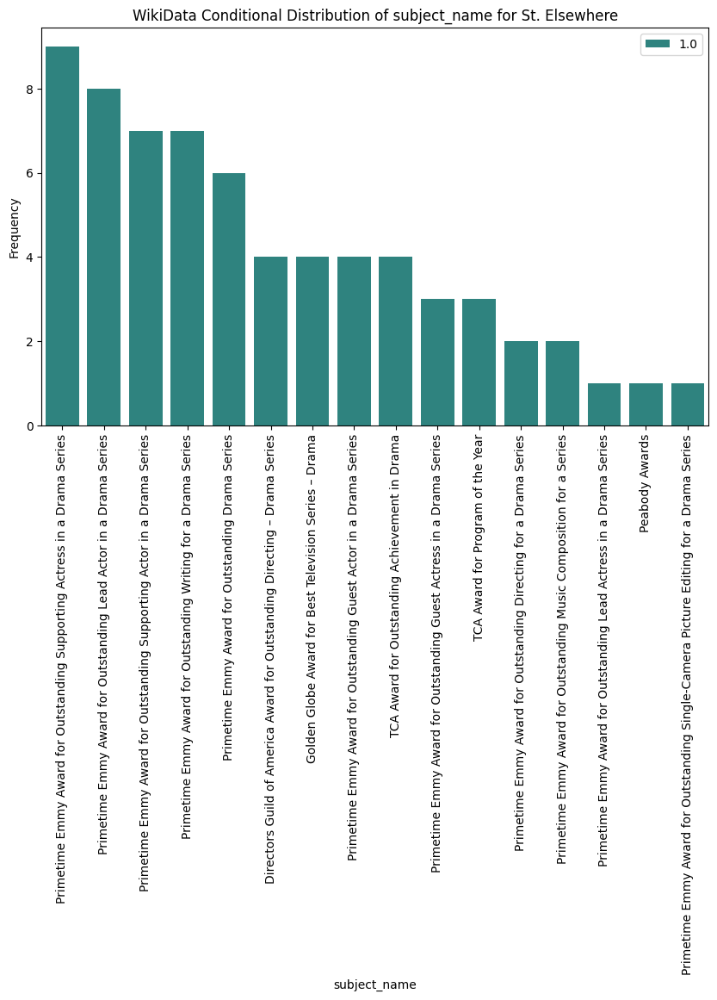

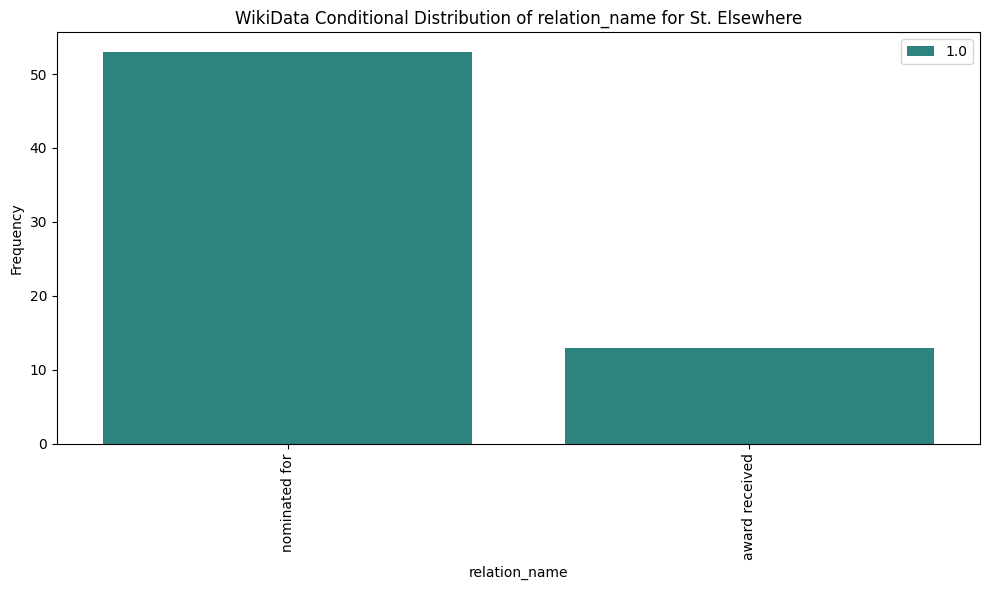

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


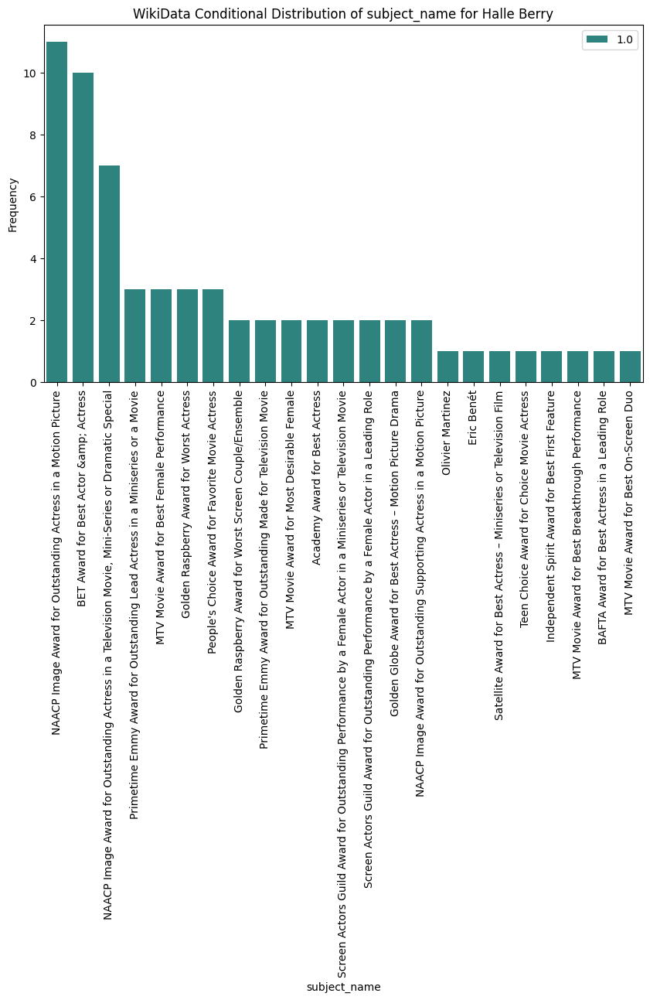

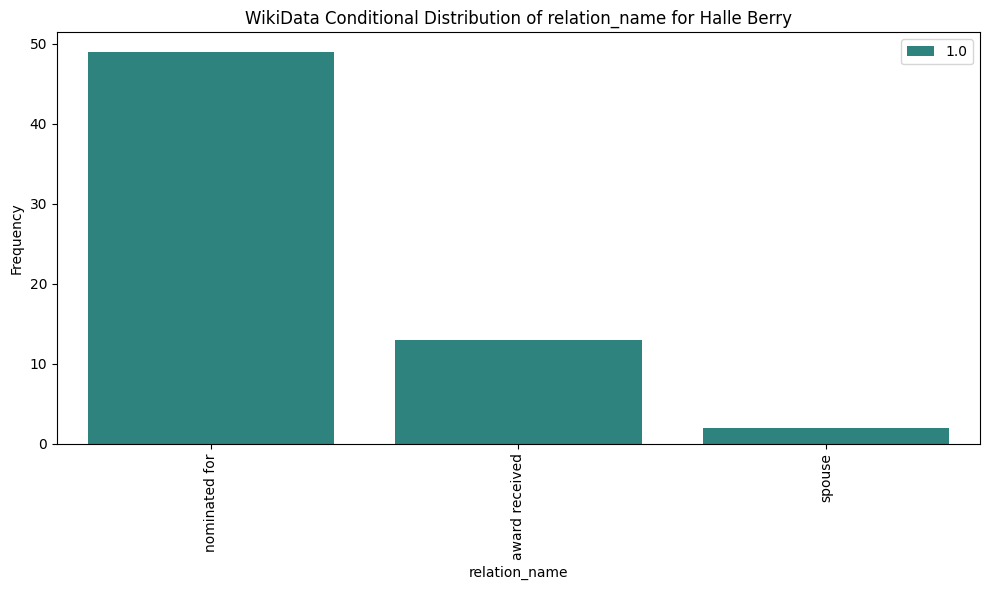

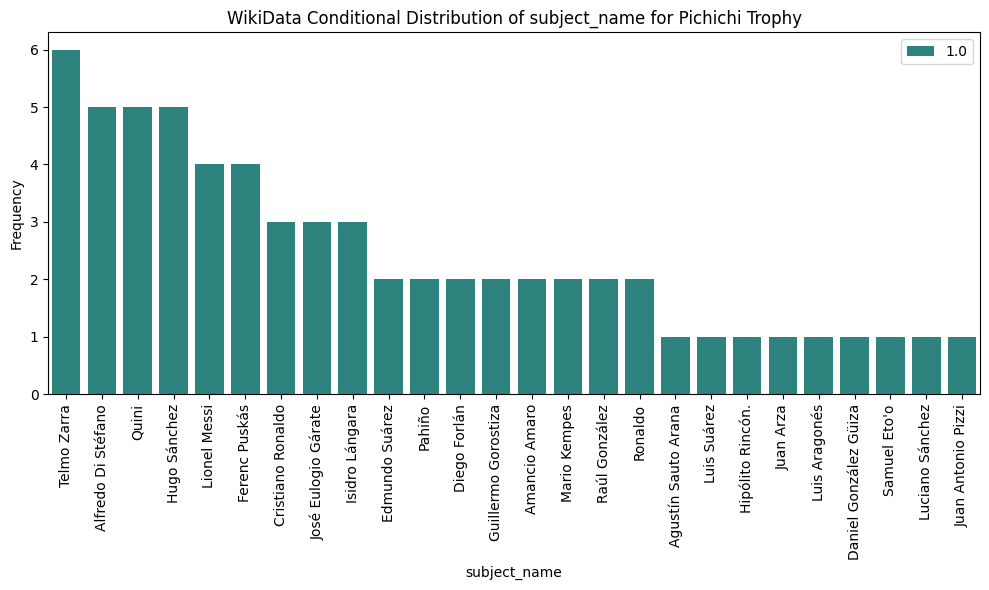

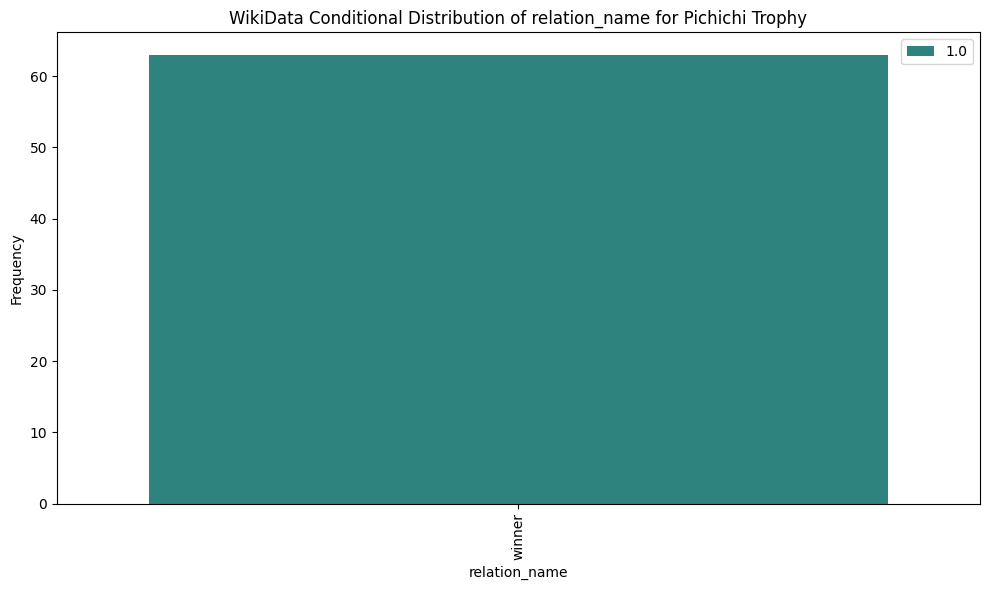

In [48]:
duplicate_values = find_duplicates(wiki, 'object_name', min_occurences=60)

duplicate_values = list(duplicate_values)
for val in duplicate_values:
    plot_conditional_distribution(wiki, 'object_name', val, 'subject_name', dataset_name="WikiData")
    plot_conditional_distribution(wiki, 'object_name', val, 'relation_name', dataset_name="WikiData")

### Complete

greatest number of occurences: 187
smallest number of occurences: 1


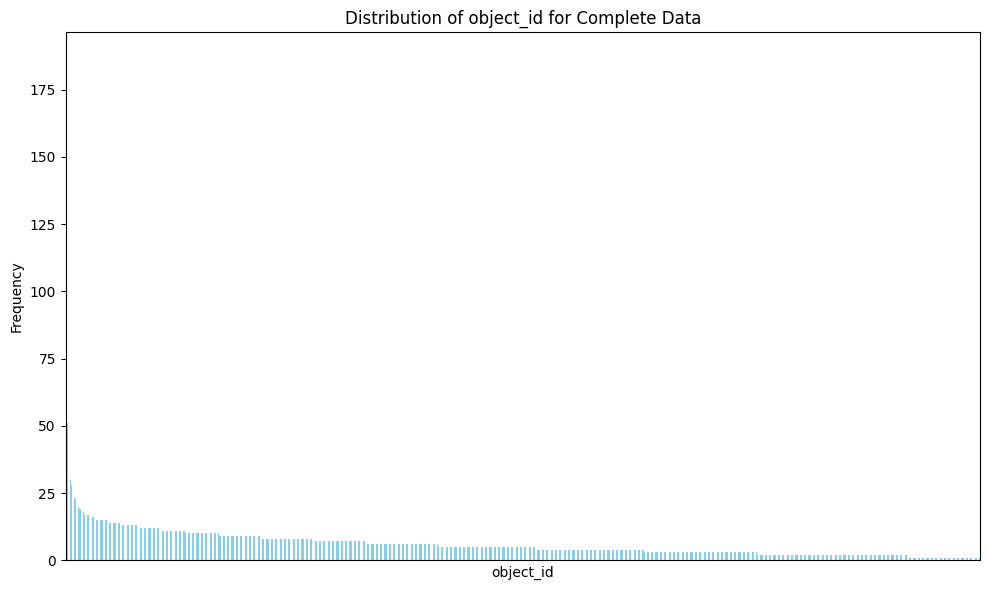

greatest number of occurences: 356
smallest number of occurences: 1


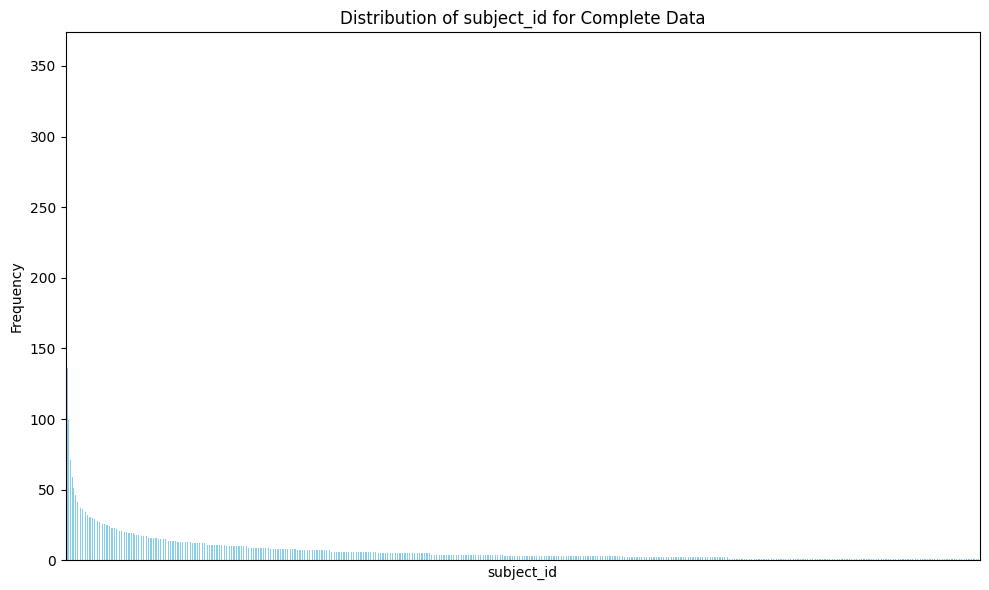

greatest number of occurences: 16090
smallest number of occurences: 80


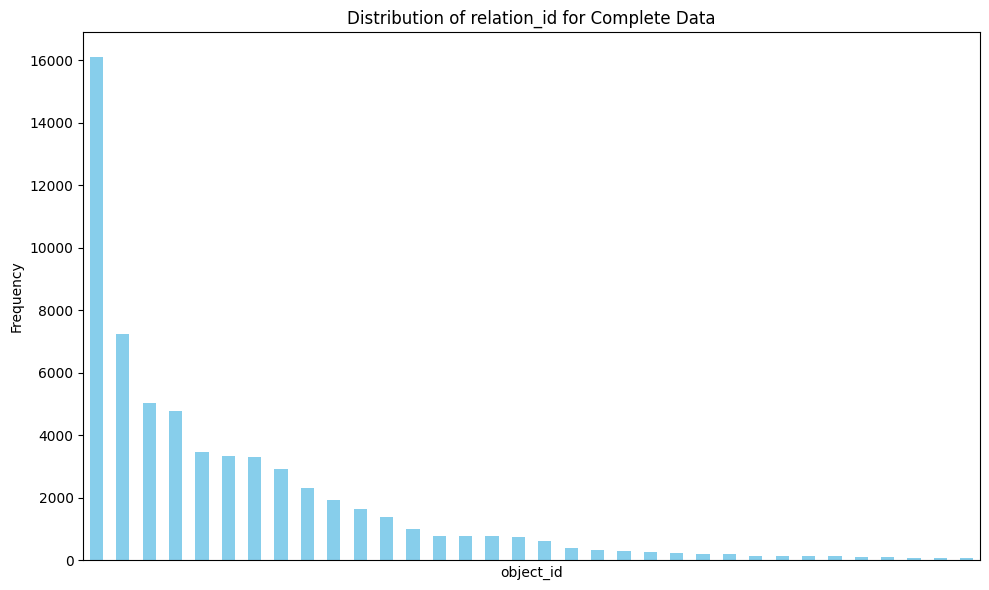

In [49]:
plot_value_counts(total_transductive, "object_id", title="Distribution of object_id for Complete Data", x_label="object_id", y_label="Frequency")
plot_value_counts(total_transductive, "subject_id", title="Distribution of subject_id for Complete Data", x_label="subject_id", y_label="Frequency")
plot_value_counts(total_transductive, "subject_relation_id", title="Distribution of relation_id for Complete Data", x_label="object_id", y_label="Frequency")

In [50]:
analyze_columns("Complete Dataset", total_inductive, columns=["object_id", "object_entity_id", "object_name", "subject_id", "subject_num_id", "subject_name", "relation_name", "relation_num_id", "relation_start_date", "relation_end_date"])

Analysis Name: Complete Dataset
Analysis for column 'object_id':
  - Number of unique values: 10267
  - Most common value: '6663' with 187 occurrences
  - Least common value: '10289' with 1 occurrence(s)

Analysis for column 'object_entity_id':
  - Number of unique values: 14247
  - Most common value: 'Q23628' with 187 occurrences
  - Least common value: 'Q53037' with 1 occurrence(s)

Analysis for column 'object_name':
  - Number of unique values: 13971
  - Most common value: 'The Sopranos' with 187 occurrences
  - Least common value: 'Ettore Scola' with 1 occurrence(s)

Analysis for column 'subject_id':
  - Number of unique values: 8769
  - Most common value: '7092' with 356 occurrences
  - Least common value: '5661' with 1 occurrence(s)

Analysis for column 'subject_num_id':
  - Number of unique values: 8769
  - Most common value: '7092' with 356 occurrences
  - Least common value: '5661' with 1 occurrence(s)

Analysis for column 'subject_name':
  - Number of unique values: 11111
  -

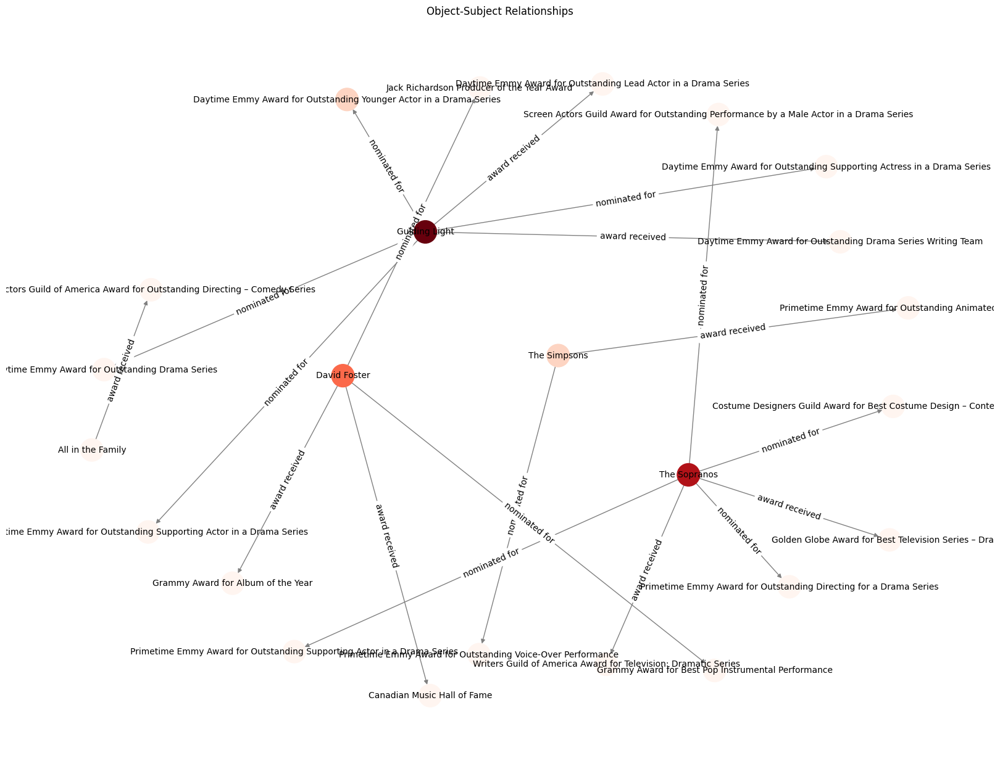

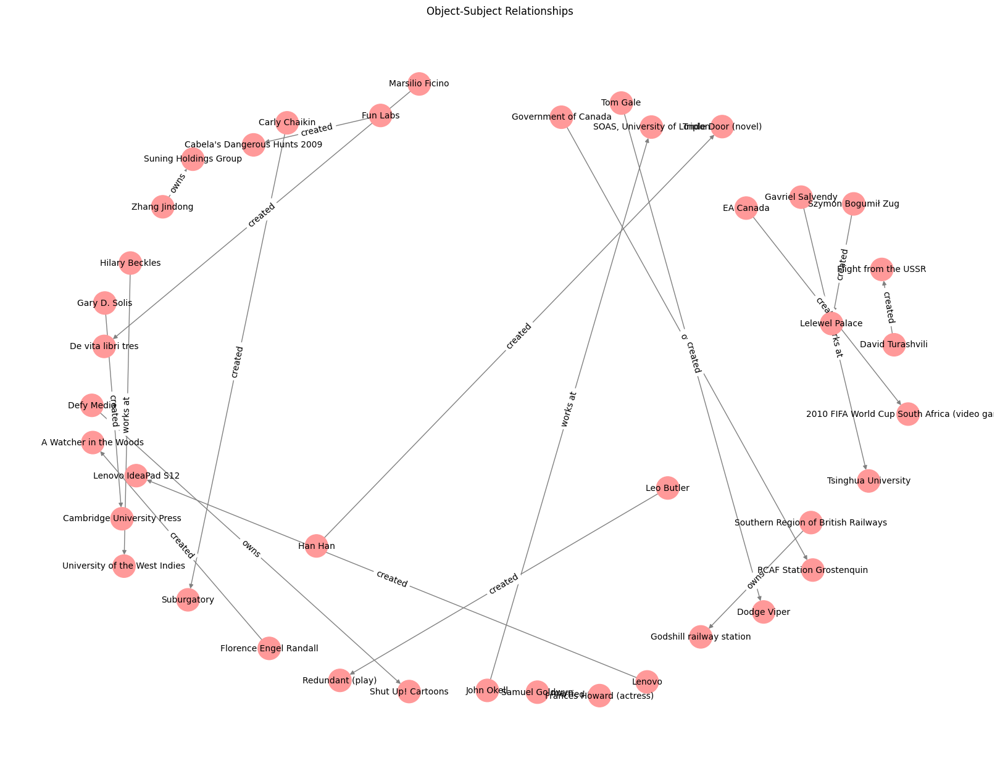

In [51]:
top_15_df = extract_top_n_common(total_transductive, "object_name", n=5)
visualize_relationships(top_15_df.head(20), 'object_name', 'relation_name', 'subject_name')
visualize_relationships(total_transductive.head(20), 'object_name', 'relation_name', 'subject_name')

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


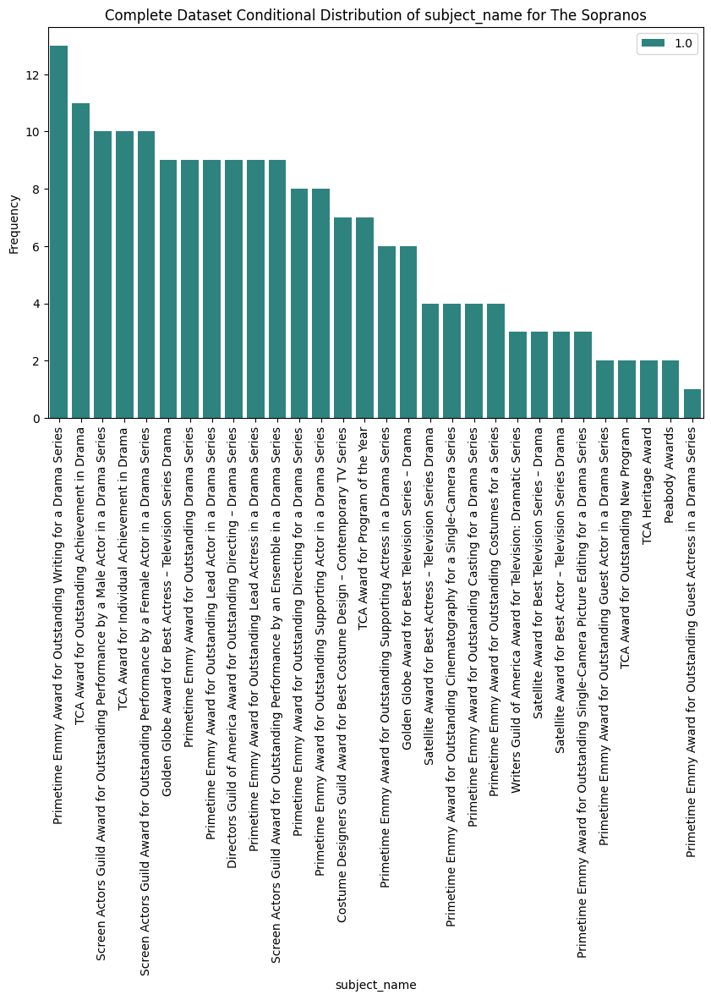

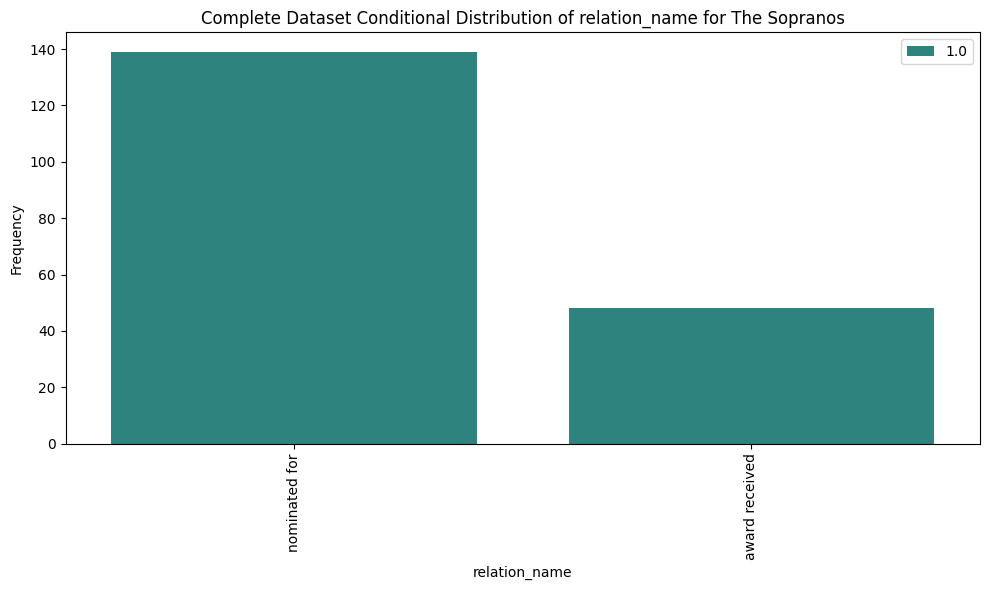

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


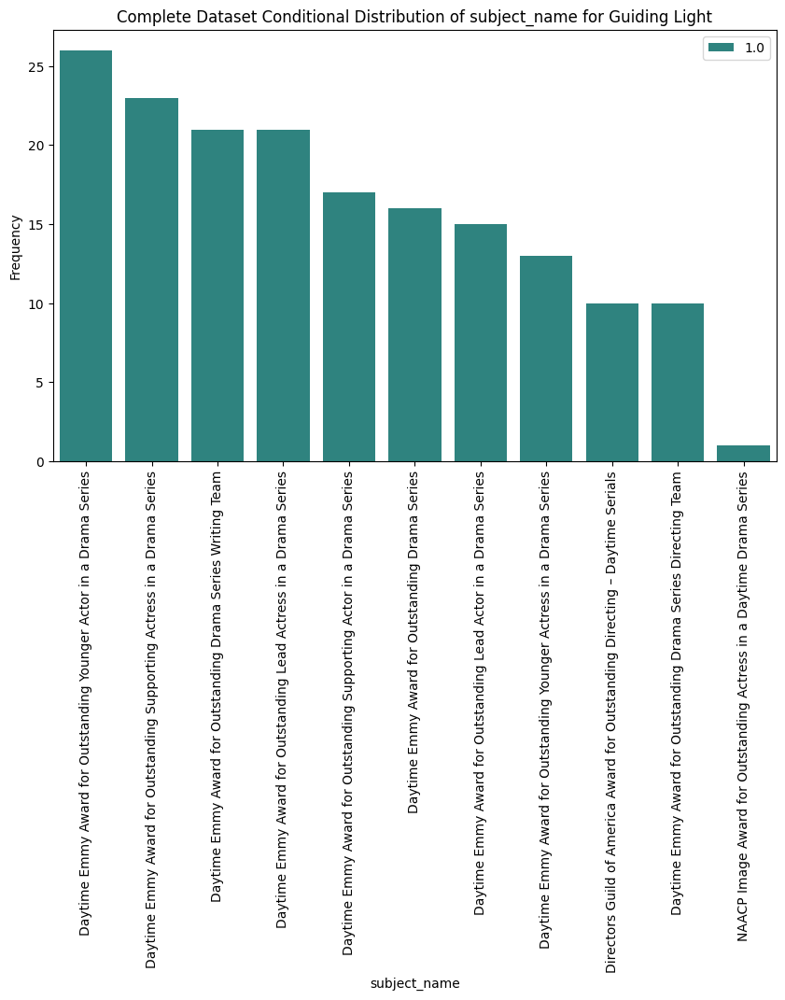

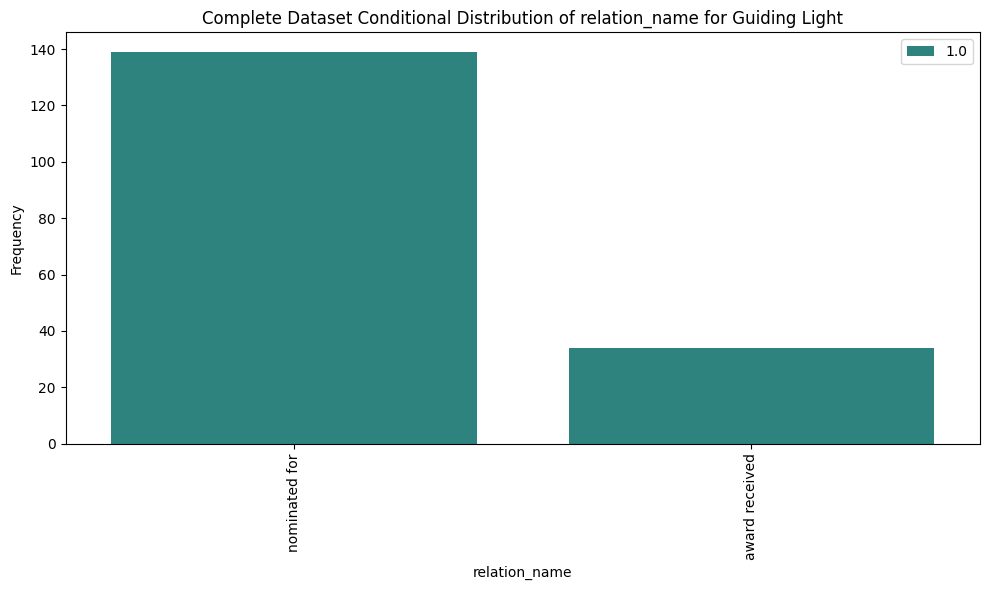

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


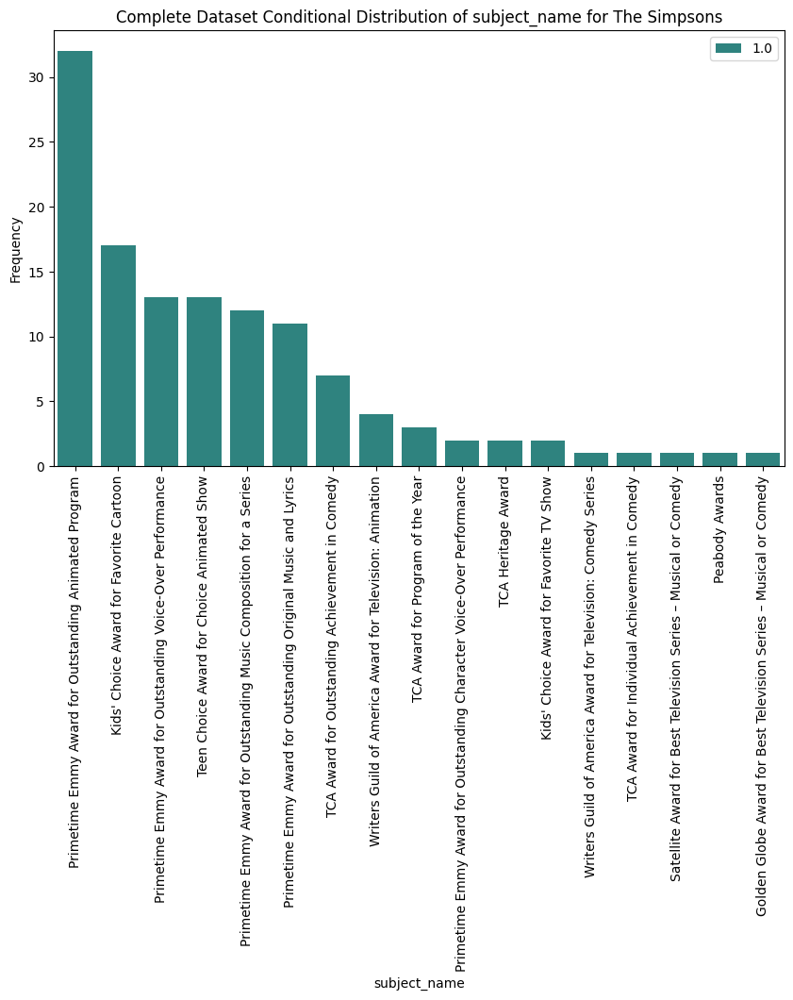

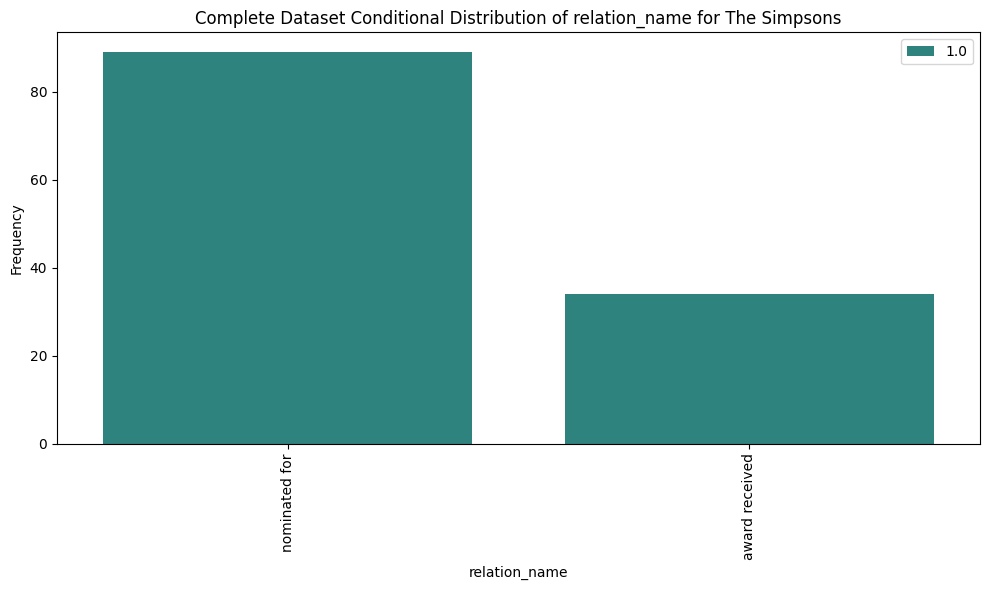

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


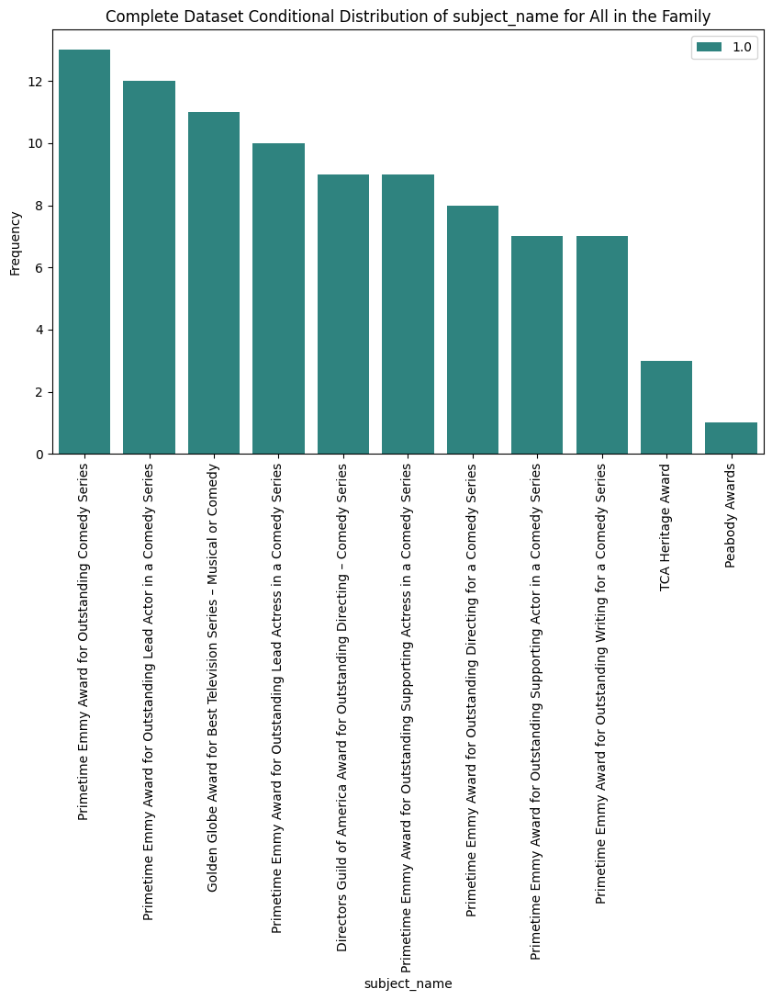

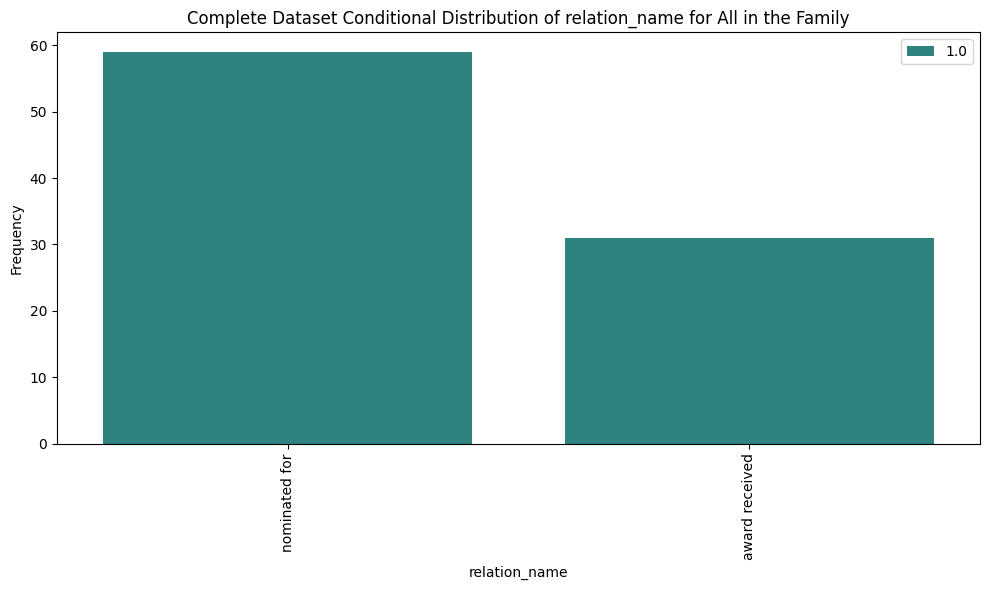

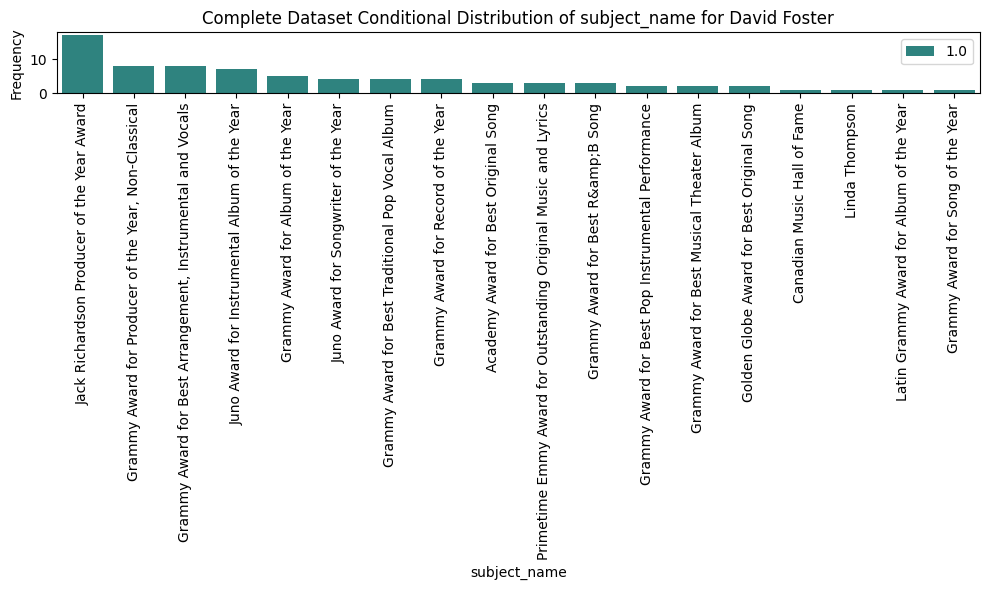

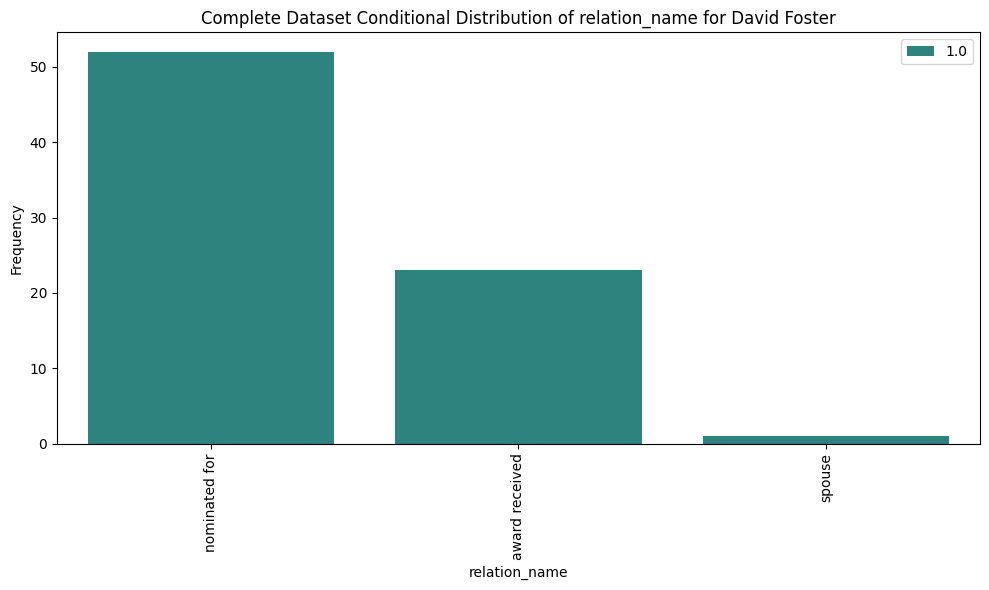

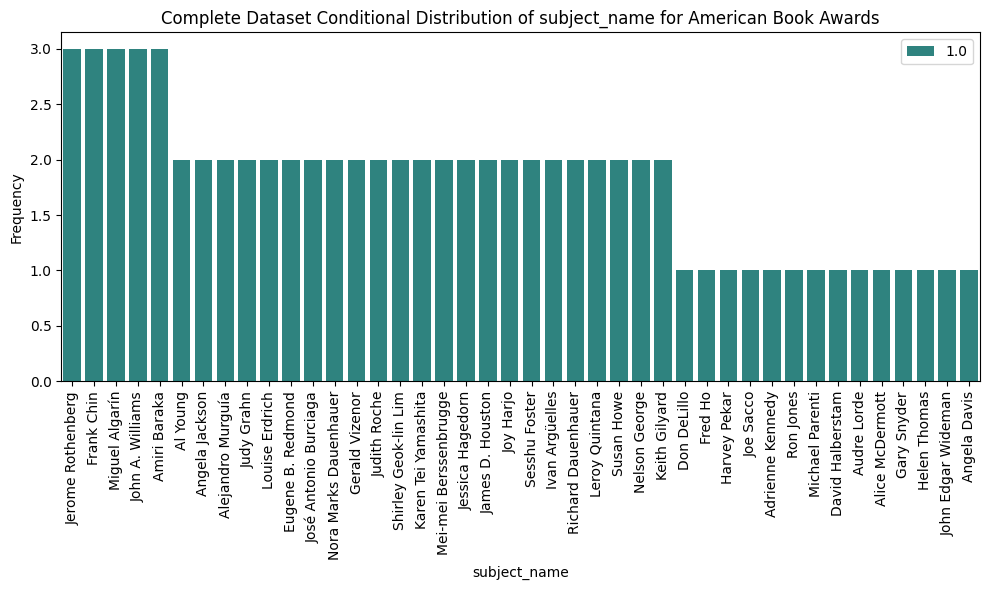

...

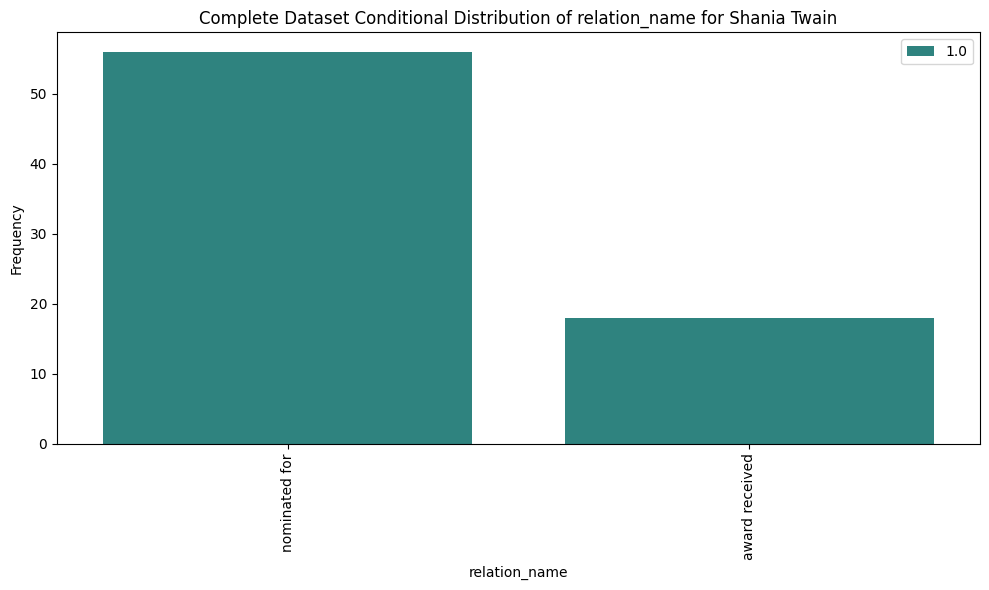

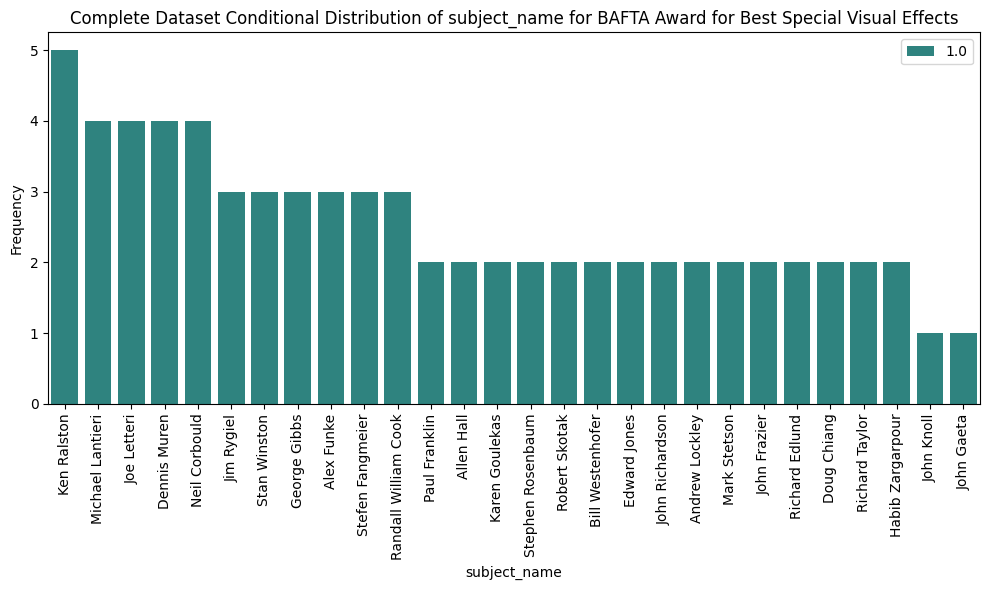

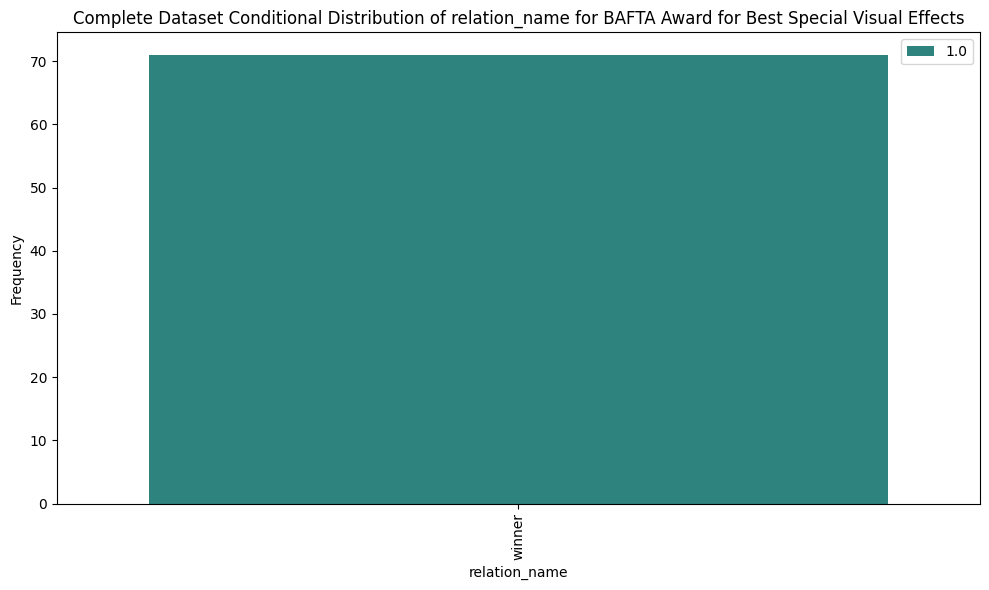

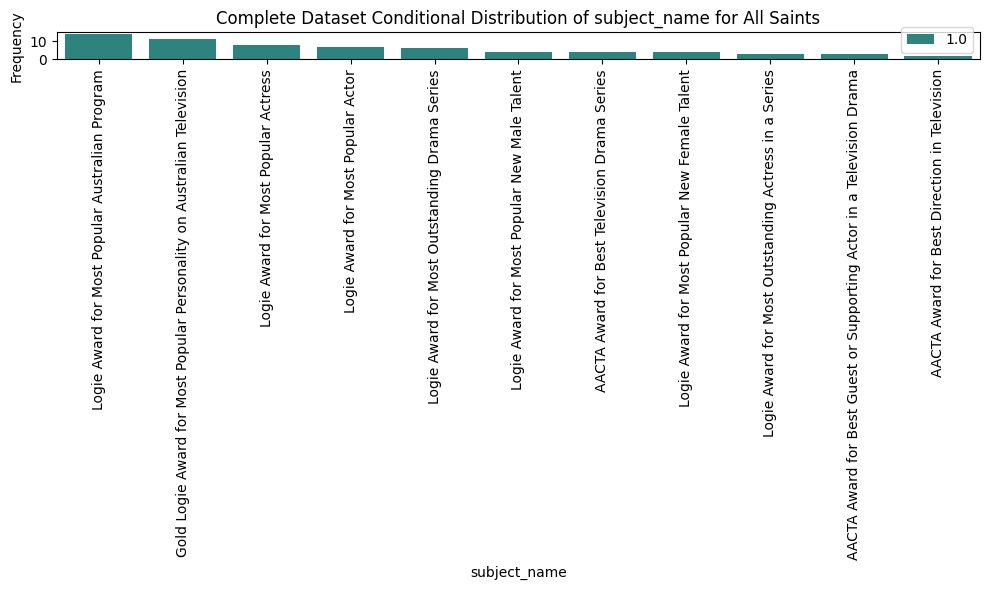

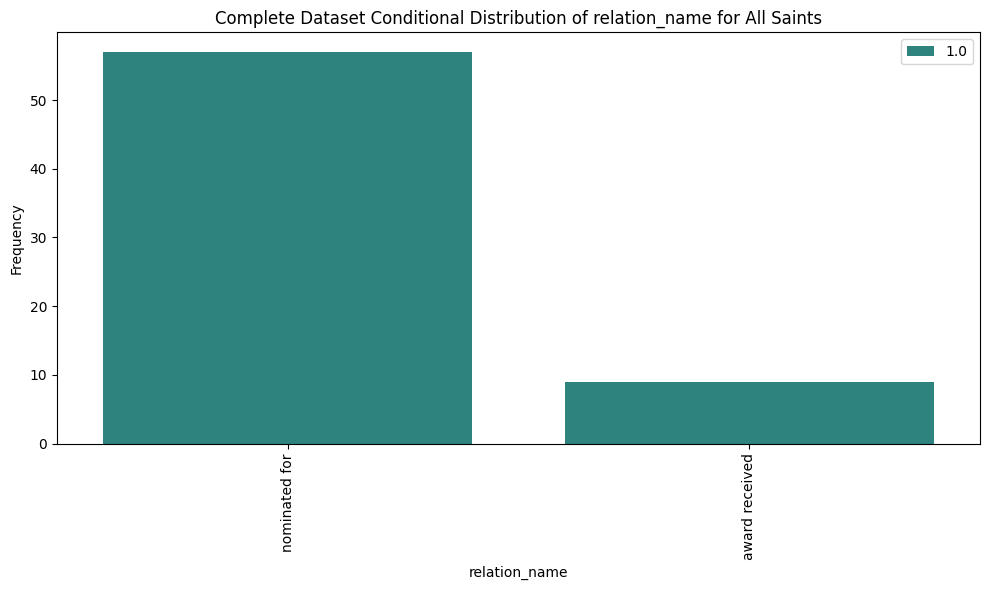

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


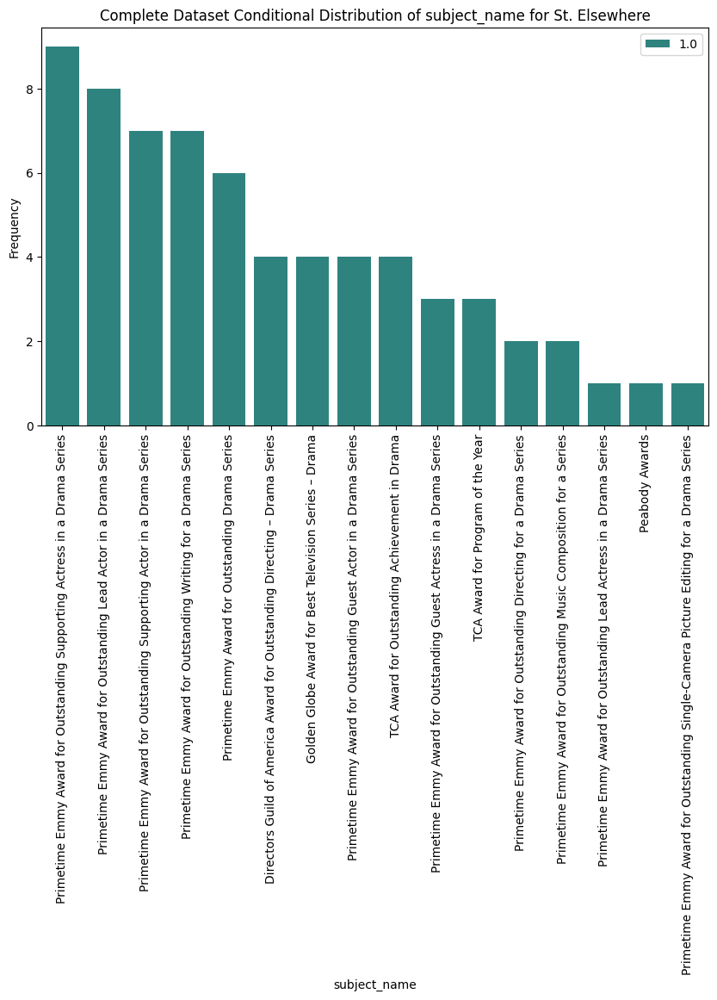

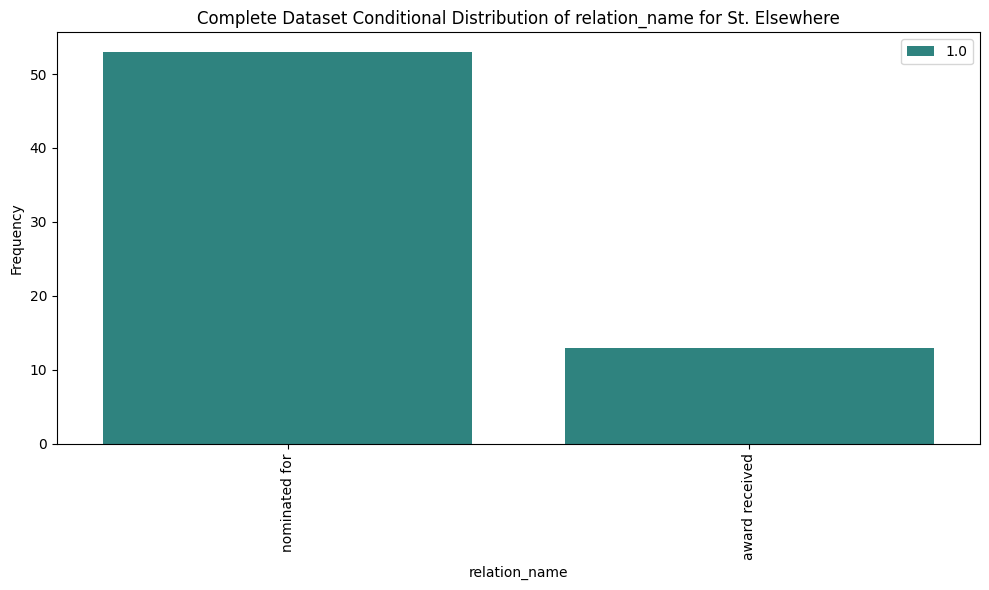

C:\Users\mateu\AppData\Local\Temp\ipykernel_20056\4173805533.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


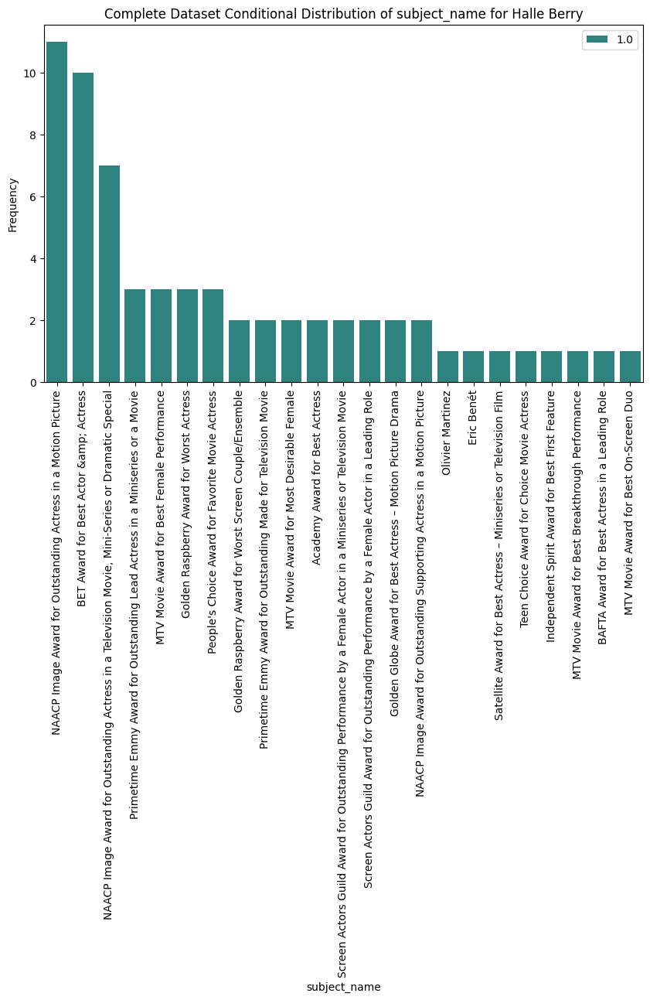

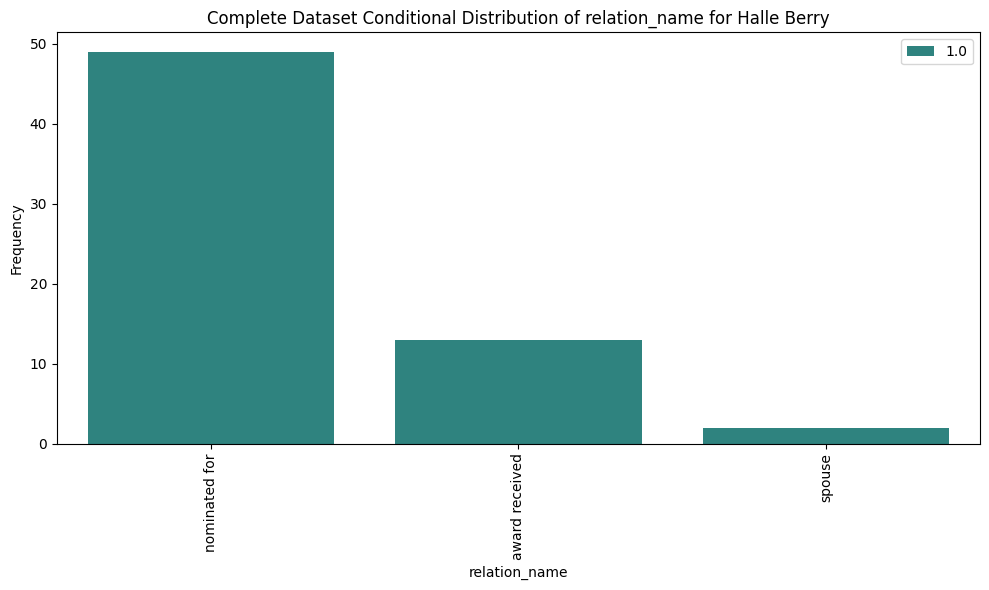

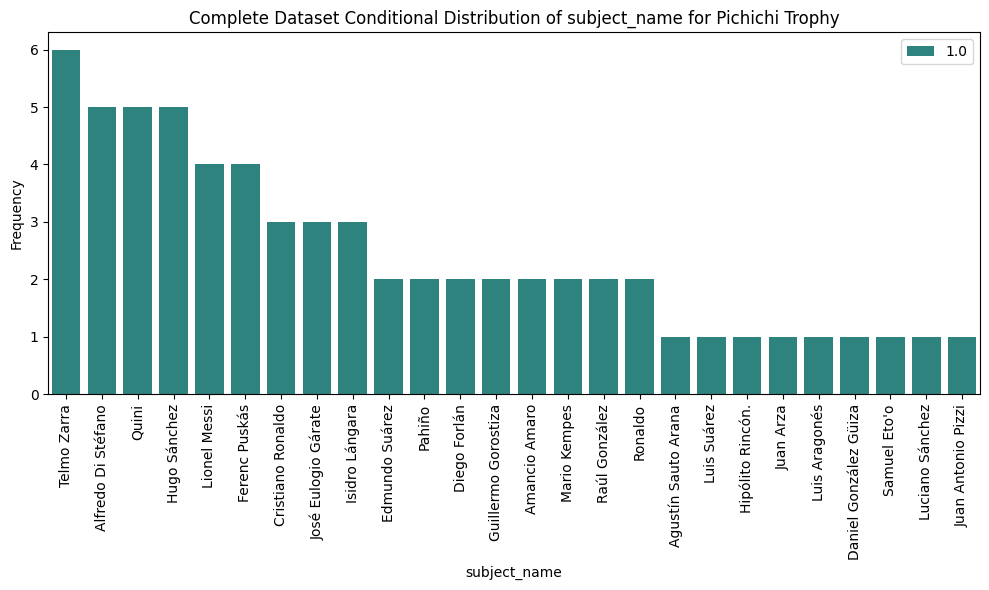

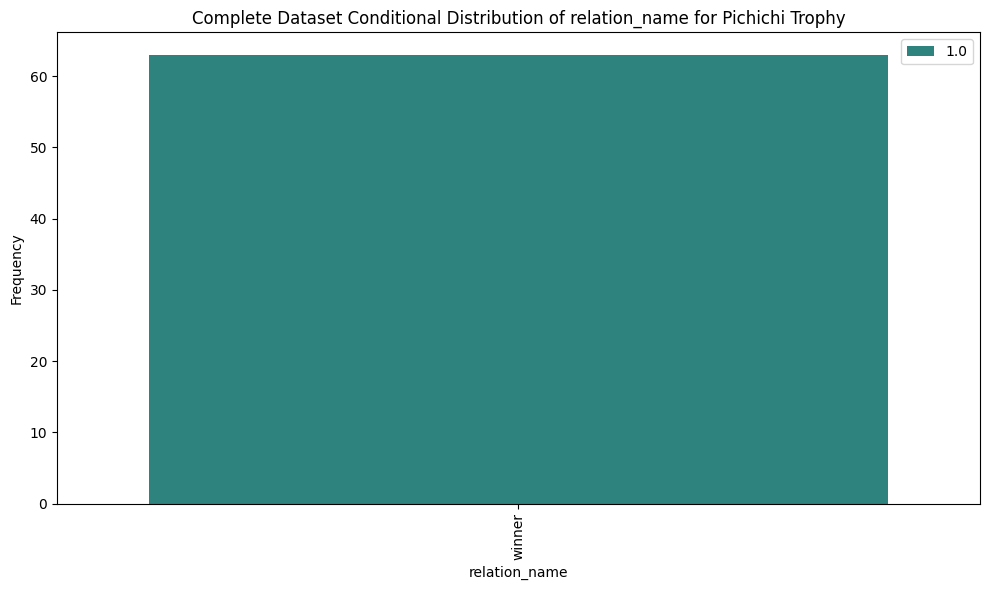

In [52]:
duplicate_values = find_duplicates(total_transductive, 'object_name', min_occurences=60)

duplicate_values = list(duplicate_values)
for val in duplicate_values:
    plot_conditional_distribution(total_transductive, 'object_name', val, 'subject_name', dataset_name="Complete Dataset")
    plot_conditional_distribution(total_transductive, 'object_name', val, 'relation_name', dataset_name="Complete Dataset")